 ![](airbnb.jpg) 

# Price prediction of Airbnb properties in New York City

# Introduction

Airbnb is a platform where millions of hosts and travelers list their space and book unique accommodations anywhere in the world. Airbnb affects the city's housing supply and affordability. In a modern, busy cosmopolitan like New York City, there are so many competitions for housing and huge demands for accommodations, Airbnb pricing is important to get right. If the price is too high the hosts might risk losing customers while if the price is too low they might be missing out on potential benefits. The goal of our project is to come up with the appropriate prediction of Airbnb price using Machine Learning, so the hosts can achieve optimal profits. One of the challenges we faced is that since the raw data we used consists of both categorical and numerical values and missing values which makes classification more difficult.

# Chapter 1. Data Acquisition

The dataset is obtained directly from the Airbnb website (http://data.insideairbnb.com/united-states/ny/new-york-city/2020-06-08/visualisations/listings.csv). Inside Airbnb is an independent, non-commercial organization that provides Airbnb data in cities around the world. Specifically, this dataset describes the listing activity and metrics in New York City as was in 8 June 2020. The columns include the following information: id number of the housing, name of the host, id number of the host, the neighbourhood group that the housing is located (Manhattan, Brooklyn, Queens, Staten Island and Bronx), the specific neighbourhood, latitude and longitude, type of room, price per night, the minimum nights allowed to book, the number of reviews, the date of last review, average reviews per month, the number of host listings, and the available days in 365 days.

### Obtain required dataset

In [1]:
#!pip install wget
import wget

In [2]:
!wget http://data.insideairbnb.com/united-states/ny/new-york-city/2020-06-08/visualisations/listings.csv

'wget' is not recognized as an internal or external command,
operable program or batch file.


In [3]:
#!pip install pyspark

In [4]:
from pyspark import SparkContext, SparkConf
from pyspark.sql import SQLContext, SparkSession
from pyspark.sql.types import StructType, StructField, DoubleType, IntegerType, StringType
sc = SparkContext.getOrCreate(SparkConf().setMaster("local[*]"))
from pyspark.sql import SparkSession
spark = SparkSession \
    .builder \
    .getOrCreate()

In [5]:
rdd = sc.textFile('listings.csv')
df = spark.read.csv(rdd,header=True)

In [6]:
df.createOrReplaceTempView('listings')
df.show()

+----+--------------------+-------+-------------+-------------------+------------------+--------+---------+---------------+-----+--------------+-----------------+-----------+-----------------+------------------------------+----------------+
|  id|                name|host_id|    host_name|neighbourhood_group|     neighbourhood|latitude|longitude|      room_type|price|minimum_nights|number_of_reviews|last_review|reviews_per_month|calculated_host_listings_count|availability_365|
+----+--------------------+-------+-------------+-------------------+------------------+--------+---------+---------------+-----+--------------+-----------------+-----------+-----------------+------------------------------+----------------+
|2060|          Modern NYC|   2259|        Jenny|          Manhattan|Washington Heights|40.85722| -73.9379|   Private room|  100|             1|                1| 2008-09-22|             0.01|                             1|             365|
|2595|Skylit Midtown Ca...|   2845| 

In [7]:
print(df.printSchema())

root
 |-- id: string (nullable = true)
 |-- name: string (nullable = true)
 |-- host_id: string (nullable = true)
 |-- host_name: string (nullable = true)
 |-- neighbourhood_group: string (nullable = true)
 |-- neighbourhood: string (nullable = true)
 |-- latitude: string (nullable = true)
 |-- longitude: string (nullable = true)
 |-- room_type: string (nullable = true)
 |-- price: string (nullable = true)
 |-- minimum_nights: string (nullable = true)
 |-- number_of_reviews: string (nullable = true)
 |-- last_review: string (nullable = true)
 |-- reviews_per_month: string (nullable = true)
 |-- calculated_host_listings_count: string (nullable = true)
 |-- availability_365: string (nullable = true)

None


In [8]:
df.registerTempTable("listings")

### Importing the Necessary Libraries

As we want to do a thorough analysis on the dataset, we will revert to conventional Python libraries to the data exploration and extract meaningful insights from the data.

In [9]:
#Essential libraries
#!pip install pandas_profiling
#!pip install missingno
#!pip install pywaffle -q
#!pip install ipyleaflet
#!pip install geopy

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
#import pandas_profiling to create HTML profiling reports
import pandas_profiling
import missingno as ms
%matplotlib inline

#import statistical libraries
from scipy import stats
from scipy.stats import norm,skew, boxcox_normmax

from pywaffle import Waffle

from ipyleaflet import Map, Heatmap
from collections import defaultdict, Counter

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

#Import geopy distance calculator
from geopy.distance import geodesic

In [10]:
df_listings = pd.read_csv('listings.csv')

In [11]:
print(f"Number of records: {df_listings.shape[0]}")

Number of records: 49530


In [12]:
print(f"List of columns: ({df_listings.shape[1]})")

List of columns: (16)


In [13]:
df_listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49530 entries, 0 to 49529
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              49530 non-null  int64  
 1   name                            49512 non-null  object 
 2   host_id                         49530 non-null  int64  
 3   host_name                       49524 non-null  object 
 4   neighbourhood_group             49530 non-null  object 
 5   neighbourhood                   49530 non-null  object 
 6   latitude                        49530 non-null  float64
 7   longitude                       49530 non-null  float64
 8   room_type                       49530 non-null  object 
 9   price                           49530 non-null  int64  
 10  minimum_nights                  49530 non-null  int64  
 11  number_of_reviews               49530 non-null  int64  
 12  last_review                     

In [14]:
df_listings.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.953000e+04,4.953000e+04,49530.000000,49530.000000,49530.000000,49530.000000,49530.000000,38211.000000,49530.000000,49530.000000
mean,2.295964e+07,8.509951e+07,40.729238,-73.951042,162.643872,8.191540,23.867515,1.008095,6.233030,126.666848
std,1.352683e+07,9.887597e+07,0.054674,0.047547,419.312316,21.974833,48.245823,1.345213,25.485293,142.381428
min,2.060000e+03,2.259000e+03,40.499790,-74.240840,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,1.085050e+07,9.269052e+06,40.689820,-73.983367,68.000000,2.000000,1.000000,0.150000,1.000000,0.000000
50%,2.233602e+07,3.800483e+07,40.723840,-73.955350,101.000000,3.000000,5.000000,0.450000,1.000000,79.000000
75%,3.557779e+07,1.373589e+08,40.762790,-73.934290,175.000000,6.000000,23.000000,1.420000,2.000000,267.000000
max,4.370336e+07,3.490826e+08,40.911690,-73.712990,10000.000000,1250.000000,746.000000,53.800000,280.000000,365.000000


# Chapter 2. Data Exploration

The objective of this step is to understand the structure of the dataset.

#### Variable Dictionary

     1. id:                              Listing identification number
     2. name:                            Listing name
     3. host_id:                         Host identification number
     4. host_name:                       Host name
     5. neighbourhood_group:             Location
     6. neighbourhood:                   Area
     7. latitude:                        Latitude coordinates
     8. longitude:                       Longitude coordinates
     9. room_type:                       Listing space type
    10. price:                           Price in dollars
    11. minimum_nights:                  Amount of nights minimum 
    12. number_of_reviews:               Number of reviews 
    13. last_review:                     Latest review date
    14. reviews_per_month:               Number of reviews per month
    15. calculated_host_listings_count:  Amount of listing per host
    16. availability_365:                Number of days when listing is 
                                         available for booking

Before analyzing anything, let's see the "face"of our dataset, analyzing the first 5 entries.

In [15]:
# Show the first 5 entries
df_listings.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2060,Modern NYC,2259,Jenny,Manhattan,Washington Heights,40.85722,-73.93790,Private room,100,1,1,2008-09-22,0.01,1,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,3,48,2019-11-04,0.37,2,335
2,3831,"Whole flr w/private bdrm, bath & kitchen(pls r...",4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,322,2020-06-07,4.64,1,276
3,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,78,2019-10-13,0.58,1,0
4,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,29,50,2019-12-02,0.37,1,365


I grouped the columns into column categories for enhanced understanding of the dataset.

<b>Host descriptors:</b>
- <b>host_id:</b> host ID
- <b>host_name:</b> name of the host
- <b>calculated_host_listings_count:</b> amount of listing per host
        
<b>Listing descriptors:</b>
- <b>id:</b> listing ID
- <b>name:</b> name of the listing
- <b>room_type:</b> listing space type
- <b>minimum_nights:</b> amount of nights minimum
- <b>availability_365:</b> number of days when listing is available for booking
- <b>price:</b> price in dollars

<b>Review descriptors:</b>
- <b>number_of_reviews:</b> number of reviews
- <b>last_review:</b> latest review
- <b>reviews_per_month:</b> number of reviews per month
    
<b>Location descriptors:</b>
- <b>neighbourhood_group:</b> location
- <b>neighbourhood:</b> area
- <b>latitude:</b> latitude coordinates
- <b>longitude:</b> longitude coordinates

In [16]:
display(df_listings.profile_report())

In [17]:
profile = df_listings.profile_report(title='Pandas Profiling Report')
profile.to_file(output_file="datanalysis.html") # saving the profile report

Data visualization and analysis allows the user/reader to understand the data in a simple and insightful way. Through our analysis, we will try to show where all the Airbnb listings are located in NYC and determine where high density and low density spots of listings are. Furthermore, we took a deep dive into the variables of the dataframe and through bar graphs, scatter plots, density plots, and correlation matrices, we try to find their relationships. We finally created a visually appealing matrix of pies to allow the reader to see which neighbourhoods are booked the most and better inform their decisions and opinions.

Through data visualization, we try to abstract the code and make the data as easy to understand as possible. And this can be done through visually appealing plots and graphs.

In [18]:
host_count=df_listings.host_id.value_counts().head(10)
host_count

107434423    280
137358866    160
61391963     116
48005494      95
51501835      86
30283594      83
19303369      83
22541573      81
9419684       71
334163301     68
Name: host_id, dtype: int64

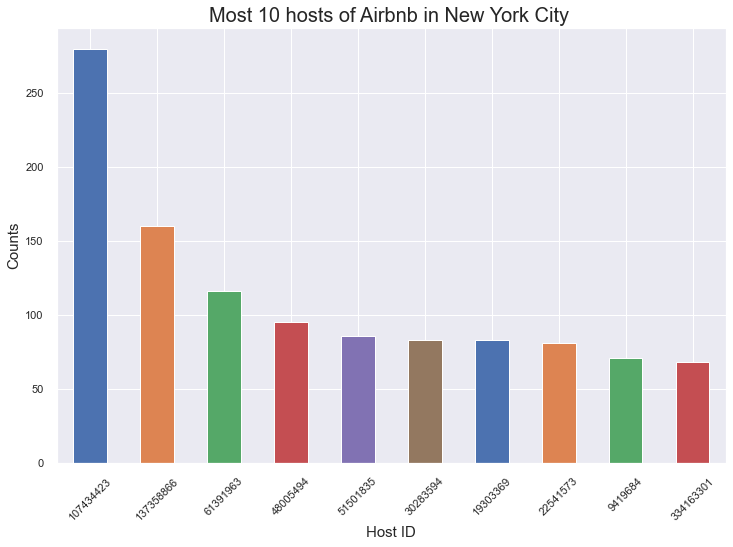

In [19]:
sns.set(rc={'figure.figsize':(12,8)})
visual1=host_count.plot(kind='bar', color=['C0','C1','C2','C3','C4','C5'])
visual1.set_ylabel('Counts', fontsize='15')
visual1.set_xlabel('Host ID', fontsize='15')
visual1.set_title('Most 10 hosts of Airbnb in New York City ', fontsize='20')
visual1.set_xticklabels(visual1.get_xticklabels(), rotation=45)
plt.show()

###  The New York City encompasses Five county-level administrative divisions called `"Boroughs"`: 
1. Bronx 
2. Brooklyn
3. Manhattan
4. Queens
5. Staten Island  

Reference: https://en.wikipedia.org/wiki/Boroughs_of_New_York_City

### Listing Airbnb by Borough

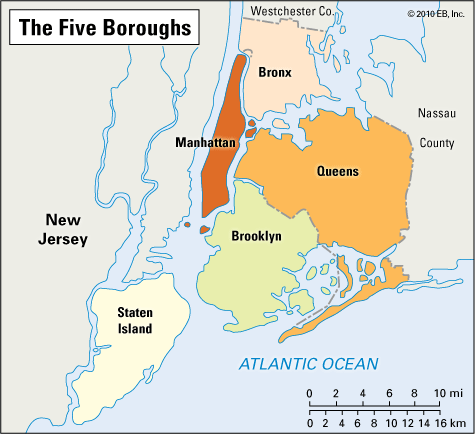


• The number of unique neighbourhood_group in dataset is :

 Manhattan        21963
Brooklyn         19931
Queens            6068
Bronx             1198
Staten Island      370
Name: neighbourhood_group, dtype: int64


• The Number of unique neighbourhood is :  222 



,Unique_neighborhood,Total number of Airbnb Listings
neighbourhood_group,,
Bronx,48,1198
Brooklyn,48,19931
Manhattan,32,21963
Queens,51,6068
Staten Island,43,370


	     Total		 222      		 49530


In [20]:
from IPython.display import Image
display(Image("The_Five_Boroughs.gif"))
print('\n• The number of unique neighbourhood_group in dataset is :\n\n',df_listings['neighbourhood_group'].value_counts())
print('\n\n• The Number of unique neighbourhood is : ',df_listings['neighbourhood'].nunique(),'\n')
one=pd.DataFrame(df_listings[['neighbourhood_group','neighbourhood']].groupby(['neighbourhood_group']).nunique())
two=pd.DataFrame(df_listings[['neighbourhood_group','neighbourhood']].groupby(['neighbourhood_group']).count())
two.rename(columns={'neighbourhood':'n2'},inplace=True)
three= pd.concat([one,two],axis=1)
three.drop('neighbourhood_group',axis=1,inplace=True)
three.rename(columns={'neighbourhood':'Unique_neighborhood','n2':'Total number of Airbnb Listings'},inplace=True)
display(three)
print('\t     Total\t\t',np.sum(48+48+32+51+43),'     \t\t',np.sum(21963+19931+6068+1198+370))

Each `neighbourhood_group` (boroughs) has been drilled down into fine locations as `neighborhood` whose count is 222.<br>
Among the neighbourhood groups:<br>
   
    
1. `Manhattan` have the least number of unique neighbourhood locations (`32`) but at the same time have the highest number of Airbnb listings (`21.963`) in the whole New York City, which means that this is a popular site, thus more travelers and tourists and thus the large number of rental places. Therefore we can expect that the average rental price to be higher than the other boroughs.<br>    

    
2. `Brooklyn` have the second highest number of unique neighbourhood locations (`48`) and also have the second highest number of Airbnb listings (`19.931`) in the whole New York City, which means that this site is also as popular as Manhattan. Therefore we can expect that the average rental price will be higher than the other boroughs but not as expensive as 'Manhattan` borough is.<br> 
    
    
3. `Queens` have the highest number of unique neighbourhood locations (`51`) but less number of Airbnb listings (`6068`) than `Manhattan` and `Brooklyn`, which indicates that the Queens is not much popular site therefore less tourists and less rental spaces. Hence we can expect a low average rental price for this borough.<br>            

    
4. `Bronx` have the same number of unique neighbourhood locations (`48`) as `Brooklyn` but have a few number of Airbnb listings (`1,198`), which means that this site is less popular. Hence we can expect a low average rental price for this borough.<br>
    
    
5. `Staten Island` have the second smallest number of unique neighbourhood locations (`43`) but have the least number of Airbnb listings (only `370`), which means that this site is not popular at all. Hence we can expect a low average rental price for this borough.<br>  
    
               
We can see that the number of Airbnb listings in each borough is what influences the price and there are more number of Airbnb listing in Manhattan and Brooklyn.

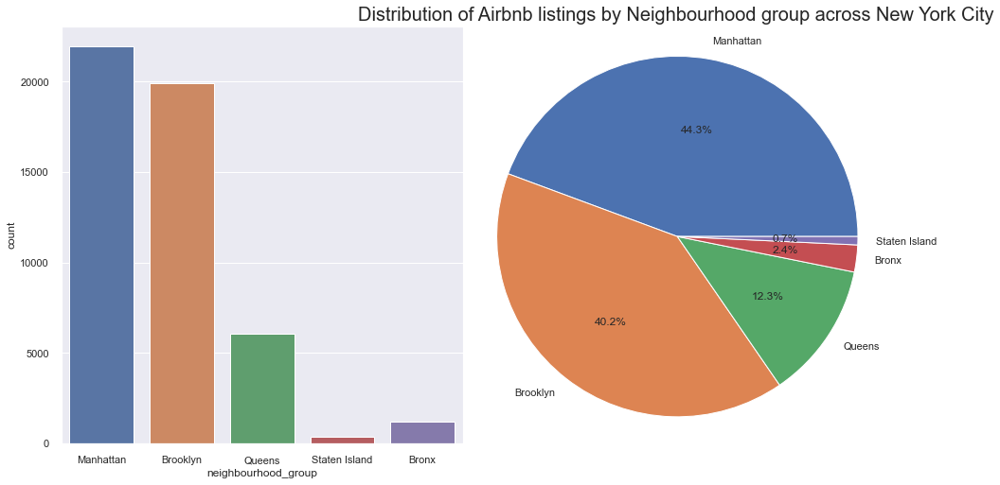

In [21]:
fig, ax = plt.subplots(1, 2, figsize=(14,7))
sns.set(style="whitegrid")

sns.countplot(df_listings['neighbourhood_group'], ax=ax[0])
plt.pie(df_listings['neighbourhood_group'].value_counts(), labels=df_listings['neighbourhood_group'].value_counts().index, 
        autopct='%1.1f%%',shadow=False)
plt.axis('equal')
plt.tight_layout()
plt.title("Distribution of Airbnb listings by Neighbourhood group across New York City", fontsize='20')
plt.show()

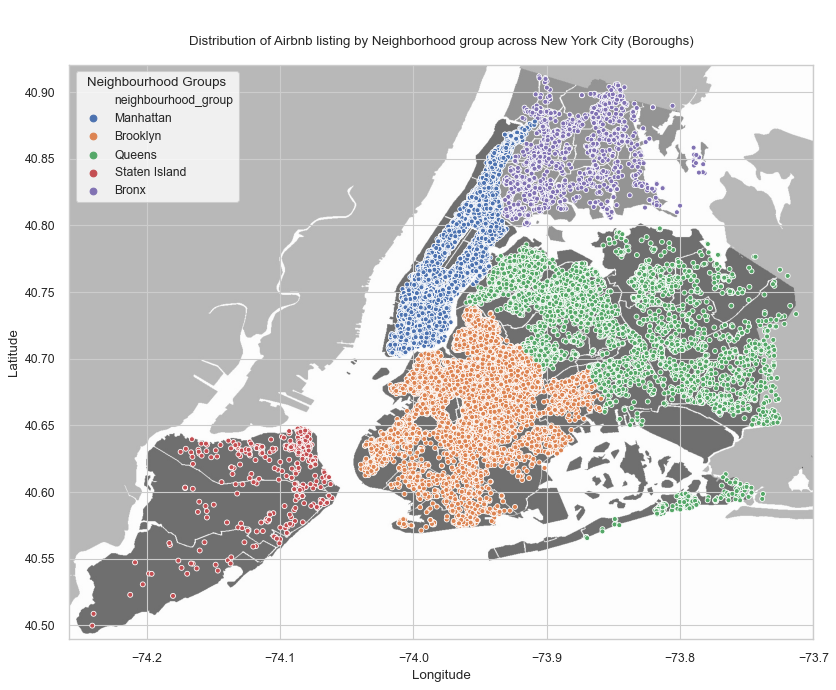

In [22]:
fig, ax = plt.subplots(figsize=(12,12),dpi =80)
img=plt.imread('NYC.png', 0)# importing the Background image
coordenates_to_extent = [-74.258, -73.7, 40.49, 40.92]
ax.imshow(img, zorder=0, extent=coordenates_to_extent)
nymap = sns.scatterplot(x='longitude', y='latitude', hue='neighbourhood_group',s=20, ax=ax, data=df_listings)
nymap.set(xlabel='Longitude', ylabel='Latitude', title='\n\nDistribution of Airbnb listing by Neighborhood group across New York City (Boroughs)\n')
ax.grid(True)
plt.legend(title='Neighbourhood Groups')
plt.show()

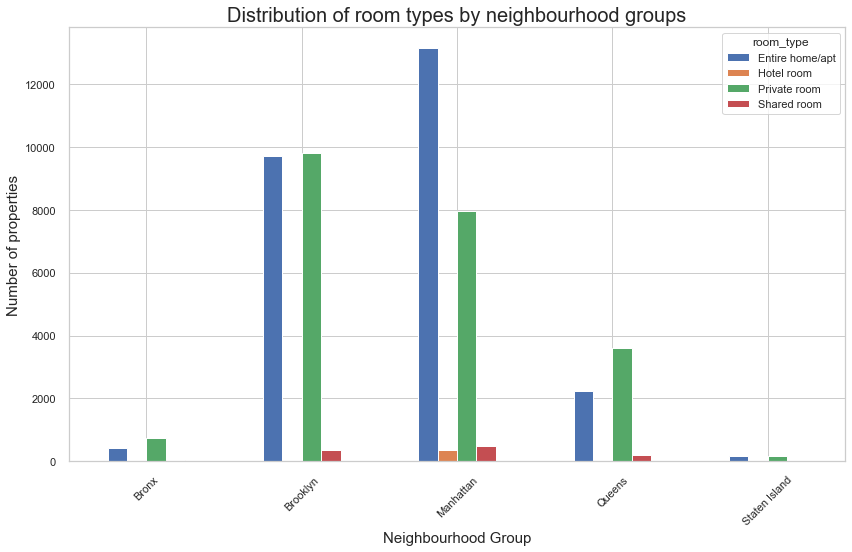

In [23]:
pd.crosstab(df_listings.neighbourhood_group,df_listings.room_type).plot(kind='bar', figsize=(12,8))
plt.title('Distribution of room types by neighbourhood groups', fontsize=20)
plt.xlabel('Neighbourhood Group', fontsize='15')
plt.ylabel('Number of properties', fontsize='15')
plt.tight_layout()
plt.xticks(rotation=45)
plt.show()

From the above spatial analysis, it is evident that there are a lot of Airbnb listings in both `Manhattan` & `Brooklyn`and very few Airbnb rental spaces in `Staten Island` as our Data Analysis indicate.

Let's visualize the Price Distribution of Airbnb listings based on neighborhood_group (boroughs) to verify the above insight

### Most Popular Neighborhoods

In [24]:
n_count=df_listings.neighbourhood.value_counts()
n_count.head(10)

Williamsburg          3752
Bedford-Stuyvesant    3736
Harlem                2649
Bushwick              2431
Hell's Kitchen        2076
Upper West Side       1899
East Village          1860
Upper East Side       1769
Midtown               1673
Crown Heights         1553
Name: neighbourhood, dtype: int64

In [25]:
region=df_listings.groupby(['neighbourhood_group','neighbourhood']).count()[['id']]
region=region['id'].groupby(level=0, group_keys=False)
region.nlargest()

neighbourhood_group  neighbourhood     
Bronx                Wakefield               75
                     Kingsbridge             67
                     Mott Haven              66
                     Longwood                65
                     Concourse               56
Brooklyn             Williamsburg          3752
                     Bedford-Stuyvesant    3736
                     Bushwick              2431
                     Crown Heights         1553
                     Greenpoint            1049
Manhattan            Harlem                2649
                     Hell's Kitchen        2076
                     Upper West Side       1899
                     East Village          1860
                     Upper East Side       1769
Queens               Astoria                892
                     Long Island City       589
                     Flushing               453
                     Ridgewood              366
                     Sunnyside              364


Next, we create a visually appealing matrix of pies to allow the reader to see which neighborhoods are booked the most and better inform their decisions and opinions.

In [26]:
# Create a dataframe for each borough  by using the loc method and having a condition within it for which borough you want
df_manhattan = df_listings.loc[df_listings['neighbourhood_group'] == "Manhattan"]
df_brooklyn = df_listings.loc[df_listings['neighbourhood_group'] == "Brooklyn"]
df_queens = df_listings.loc[df_listings['neighbourhood_group'] == "Queens"]
df_staten_island = df_listings.loc[df_listings['neighbourhood_group'] == "Staten Island"]
df_bronx = df_listings.loc[df_listings['neighbourhood_group'] == "Bronx"]

In [27]:
# Create a table for each borough and populate it with the neighbourhood as the key and the amount of listings as the value. 
manhattan, brooklyn, queens, staten_island, bronx, overall = defaultdict(int), defaultdict(int), defaultdict(int), defaultdict(int),defaultdict(int), defaultdict(int)

for idx, row in df_manhattan.iterrows():
    manhattan[row['neighbourhood']] += 1
for idx, row in df_brooklyn.iterrows():
    brooklyn[row['neighbourhood']] += 1
for idx, row in df_queens.iterrows():
    queens[row['neighbourhood']] += 1
for idx, row in df_staten_island.iterrows():
    staten_island[row['neighbourhood']] += 1
for idx, row in df_bronx.iterrows():
    bronx[row['neighbourhood']] += 1
for idx, row in df_listings.iterrows():
    overall[row['neighbourhood']] += 1
manhattan = dict(Counter(manhattan).most_common(10))
brooklyn = dict(Counter(brooklyn).most_common(10))
queens = dict(Counter(queens).most_common(10))
staten_island = dict(Counter(staten_island).most_common(10))
bronx = dict(Counter(bronx).most_common(10))
overall = dict(Counter(overall).most_common(10))

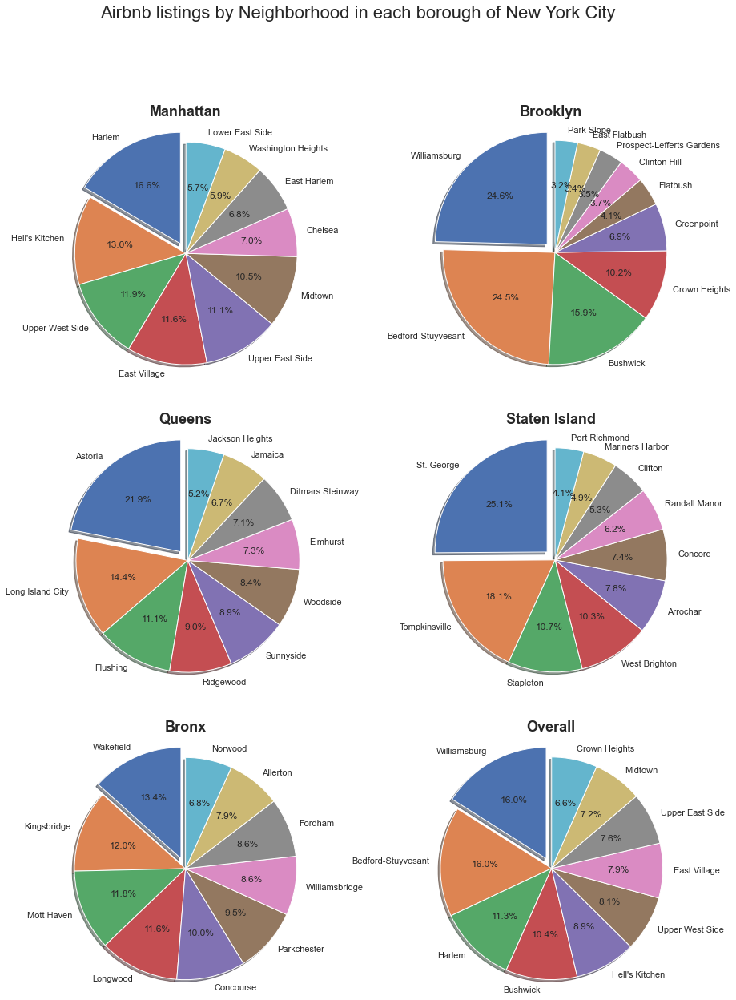

In [28]:
# Now we create each respective pie chart

#Manhattan
explode = (0.1, 0, 0, 0, 0, 0, 0, 0, 0, 0)  # only "explode" the 1st slice 
fig, ax = plt.subplots(3, 2, figsize=(15,20)) # create 2x3 matrix of pies
ax[0,0].pie(manhattan.values(), explode= explode, labels=manhattan.keys(), autopct='%1.1f%%',
        shadow=True, startangle=90)
ax[0,0].axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
ax[0,0].set_title('Manhattan', weight='bold').set_fontsize('18')

#Bronx
ax[0,1].pie(brooklyn.values(), explode= explode, labels=brooklyn.keys(), autopct='%1.1f%%',
        shadow=True, startangle=90)
ax[0,1].axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
ax[0,1].set_title('Brooklyn', weight='bold').set_fontsize('18')

#Queens
ax[1,0].pie(queens.values(), explode= explode, labels=queens.keys(), autopct='%1.1f%%',
        shadow=True, startangle=90)
ax[1,0].axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
ax[1,0].set_title('Queens', weight='bold').set_fontsize('18')

#Staten Island
ax[1,1].pie(staten_island.values(), explode= explode, labels=staten_island.keys(), autopct='%1.1f%%',
        shadow=True, startangle=90)
ax[1,1].axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
ax[1,1].set_title('Staten Island', weight='bold').set_fontsize('18')

#Brooklyn
ax[2,0].pie(bronx.values(), explode= explode, labels=bronx.keys(), autopct='%1.1f%%',
        shadow=True, startangle=90)
ax[2,0].axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
ax[2,0].set_title('Bronx', weight='bold').set_fontsize('18')

#Overall
ax[2,1].pie(overall.values(), explode= explode, labels=overall.keys(), autopct='%1.1f%%',
        shadow=True, startangle=90)
ax[2,1].axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
ax[2,1].set_title('Overall', weight='bold').set_fontsize('18')
fig.suptitle('Airbnb listings by Neighborhood in each borough of New York City', fontsize='22')
plt.show()

### Number of reservation by Neighborhood

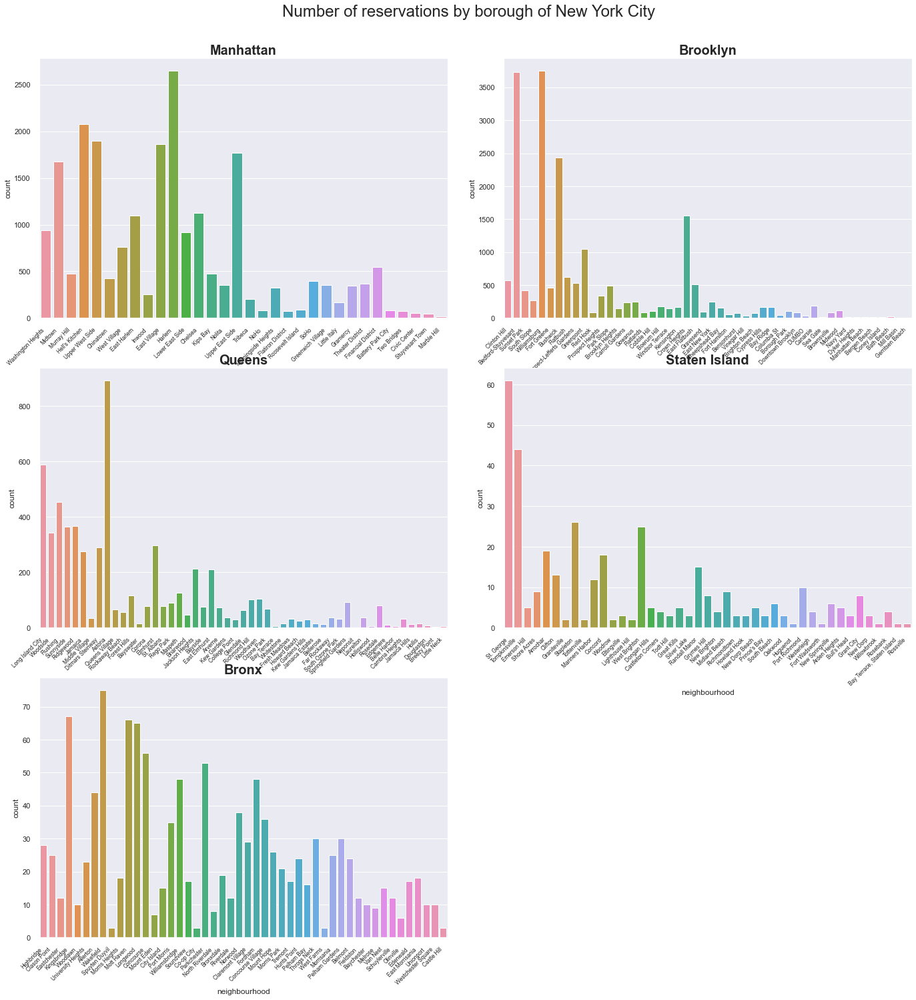

In [29]:
sns.set_style('darkgrid')
fig,ax = plt.subplots(3,2,figsize=(20,20))
fig.tight_layout(pad=4.0)
ax[0,0] = sns.countplot( x="neighbourhood",data=df_manhattan,ax=ax[0,0])
ax[0,0].set_xticklabels(ax[0,0].get_xticklabels(),
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-small'  
)
ax[0,1] = sns.countplot( x="neighbourhood",data=df_brooklyn,ax=ax[0,1])
ax[0,1].set_xticklabels(ax[0,1].get_xticklabels(),
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-small'  
)
ax[1,0] = sns.countplot( x="neighbourhood",data=df_queens,ax=ax[1,0])
ax[1,0].set_xticklabels(ax[1,0].get_xticklabels(),
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-small'  
)
ax[1,1] = sns.countplot( x="neighbourhood",data=df_staten_island,ax=ax[1,1])
ax[1,1].set_xticklabels(ax[1,1].get_xticklabels(),
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-small' 
)
ax[2,0] = sns.countplot( x="neighbourhood",data=df_bronx,ax=ax[2,0])
ax[2,0].set_xticklabels(ax[2,0].get_xticklabels(),
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-small'  
)
ax[2,1] = sns.countplot( x="neighbourhood",data=df_listings,ax=ax[2,1])
ax[2,1].set_xticklabels(ax[2,1].get_xticklabels(),
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-small'  
)
fig.suptitle("Number of reservations by borough of New York City", fontsize=24, y=1.02)
ax[0,0].set_title('Manhattan', weight='bold').set_fontsize('20')
ax[0,1].set_title('Brooklyn', weight='bold').set_fontsize('20')
ax[1,0].set_title('Queens', weight='bold').set_fontsize('20')
ax[1,1].set_title('Staten Island', weight='bold').set_fontsize('20')
ax[2,0].set_title('Bronx', weight='bold').set_fontsize('20')
fig.delaxes(ax[2,1])

### Listing Prices by Borough

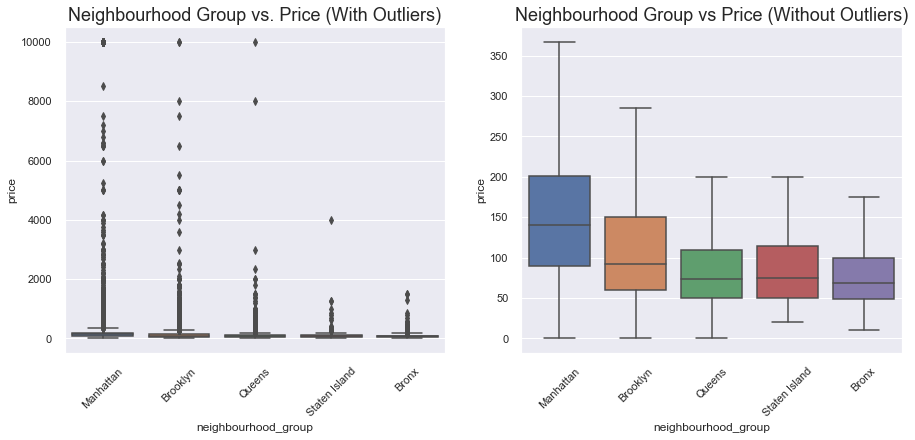

In [30]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
sns.set(style="whitegrid")
bp1 = sns.boxplot(x = 'neighbourhood_group', y = 'price', data = df_listings, ax=ax1)
bp2 = sns.boxplot(x = 'neighbourhood_group', y = 'price', data = df_listings, ax=ax2, showfliers=False)

bp1.set_xticklabels(bp1.get_xticklabels(), rotation=45)
bp1.set_title("Neighbourhood Group vs. Price (With Outliers)", fontsize='18')
bp2.set_xticklabels(bp1.get_xticklabels(), rotation=45)
plt.title("Neighbourhood Group vs Price (Without Outliers)", fontsize='18')
plt.show()

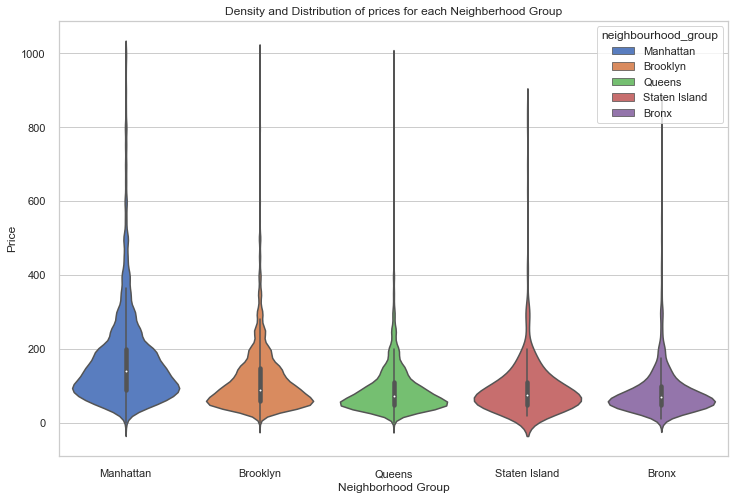



The Average price of each Boroughs :


,Average-Price
neighbourhood_group,
Bronx,90.176127
Brooklyn,125.056194
Manhattan,218.855166
Queens,99.745056
Staten Island,116.908108


In [31]:
plt.figure(figsize=(12,8))
vplot = sns.violinplot( x="neighbourhood_group", y="price",hue="neighbourhood_group", data=df_listings[df_listings['price']<1000], palette="muted", dodge=False)
vplot.set(xlabel='Neighborhood Group', ylabel='Price', title='Density and Distribution of prices for each Neighberhood Group')
plt.show()
avgprice= pd.DataFrame((df_listings[['neighbourhood_group','price']].groupby(['neighbourhood_group']).mean()))
avgprice.rename(columns={'price':'Average-Price'},inplace=True)
print('\n\nThe Average price of each Boroughs :')
display(avgprice)

From the above, we can see that the average price of rent is the same for the boroughs of `Bronx`, `Queens` and `Staten Island`. `Brooklyn` is more expensive than the three neighborhoud_group mentioned above. Finally, we must notice that the rent price is highly overpriced in region of `Manhattan`.


Let's visualize the same in the world map with heatmap representing the price, where we can verify that the most expensive airbnbs are in Manhattan borough. The rest of boroughs are regularly proportionate and all of them have about the same price.

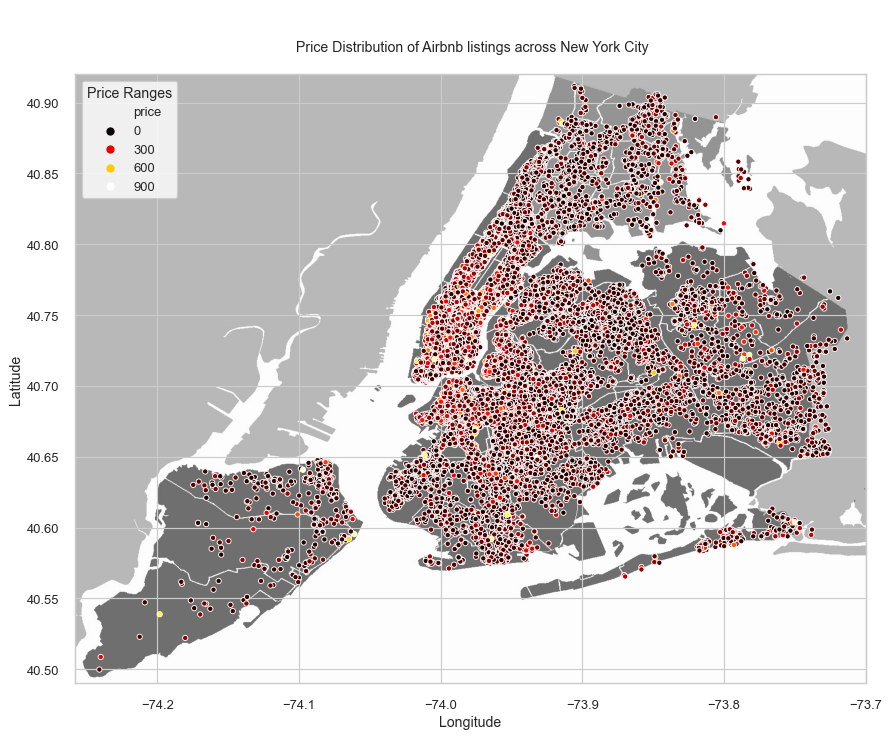

In [32]:
fig, ax = plt.subplots(figsize=(12,12),dpi =85)
img=plt.imread('NYC.png', 0)# importing the Background image
coordenates_to_extent = [-74.258, -73.7, 40.49, 40.92]
ax.imshow(img, zorder=0, extent=coordenates_to_extent)
nymap = sns.scatterplot(x=df_listings[df_listings['price']<900]['longitude'], y=df_listings[df_listings['price']<900]['latitude'], 
                        hue=df_listings[df_listings['price']<900]['price'] ,s=20, ax=ax, data=df_listings, palette='hot')
nymap.set(xlabel='Longitude', ylabel='Latitude', title='\n\n Price Distribution of Airbnb listings across New York City\n')
ax.grid(True)
plt.legend(title='Price Ranges',loc='upper left')
plt.show()

From the above spatial analysis it is evident that the most priced Airbnb listings are located in `Manhattan` & `Brooklyn` and the rest of boroughs are regularly proportionate and all of them have the about same price.

Let's analyze the other categorical features.

### What kind of listing is the most rented on Airbnb

The column of the variable `room_type` indicates what kind of listing it is on Airbnb. It is possible to rent an entire apartment/house, a private room, or a shared room. Let's count the quantity of entries for each type, using the method value_counts()

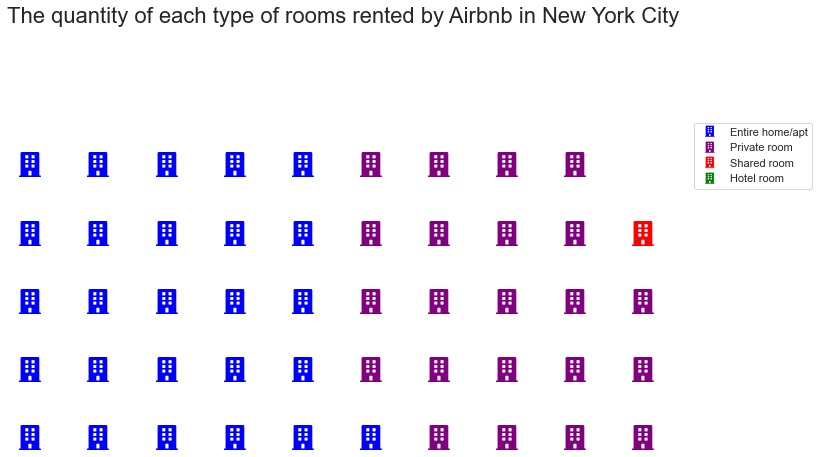

Quantity of each type of listing available:
 Entire home/apt    25716
Private room       22279
Shared room         1104
Hotel room           431
Name: room_type, dtype: int64


Percentage for each type of listing available:
 Entire home/apt    51.920048
Private room       44.980820
Shared room         2.228952
Hotel room          0.870180
Name: room_type, dtype: float64


In [33]:
# extracting value counts for the variable room_type
data = df_listings.room_type.value_counts().to_dict()

# plotting a waffle chart
fig = plt.figure(
                FigureClass=Waffle,
                rows=5,
                columns=10,
                colors=("blue", "purple", "red", "green"),
                values=data, icons='building', icon_size=25,
                legend={'loc': 'upper left', 'bbox_to_anchor': (1,1)},
                icon_legend=True
                )
fig.suptitle("The quantity of each type of rooms rented by Airbnb in New York City", fontsize='22')
fig.set_tight_layout(False)
plt.show();

# show the quantity of each type of listing available
print('Quantity of each type of listing available:\n', df_listings.room_type.value_counts())
print('\n')
# show the percentage of each type of listing available
print('Percentage for each type of listing available:\n', df_listings.room_type.value_counts() / df_listings.shape[0] * 100)

There are 4 types of Rooms avaiable in the above mentioned neighborhoods (222) which are `Entire home/apt` ,`Private room`, `Shared room` & `Hotel room'`, let's visualize the dataset and verify how much availablity is there in each type of rooms and also how much rooms are available in each type in each neighborhood_groups (boroughs).

In [34]:
room_labels=list(df_listings["room_type"].unique())
room_labels

['Private room', 'Entire home/apt', 'Shared room', 'Hotel room']

In [35]:
room_vals=list(df_listings.room_type.value_counts())
room_vals

[25716, 22279, 1104, 431]

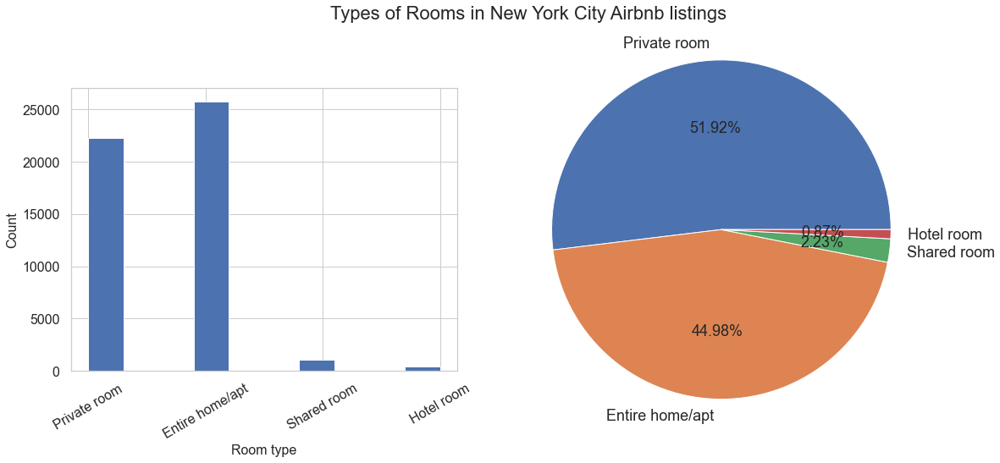

In [36]:
fig = plt.figure()
fig.set_figheight(8)
fig.set_figwidth(18)
plt.subplot(1, 2, 1)
plt.hist(x=df_listings['room_type'])
plt.xlabel('Room type',fontsize=16)
plt.ylabel('Count',fontsize=16)
plt.xticks(fontsize=16, rotation=30)
plt.yticks(fontsize=16)
plt.subplot(1, 2, 2)
plt.axis('equal')
plt.pie(room_vals, labels=room_labels, radius=1.5, autopct='%0.2f%%', textprops={'fontsize': 18})
fig.tight_layout(pad=2.6)
fig.suptitle('Types of Rooms in New York City Airbnb listings',fontsize=22)
plt.show()

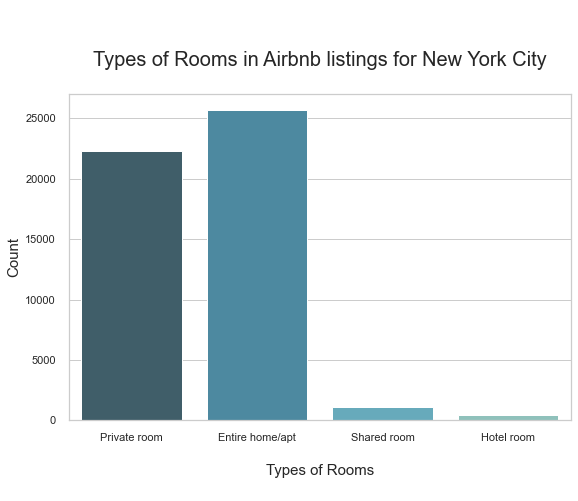

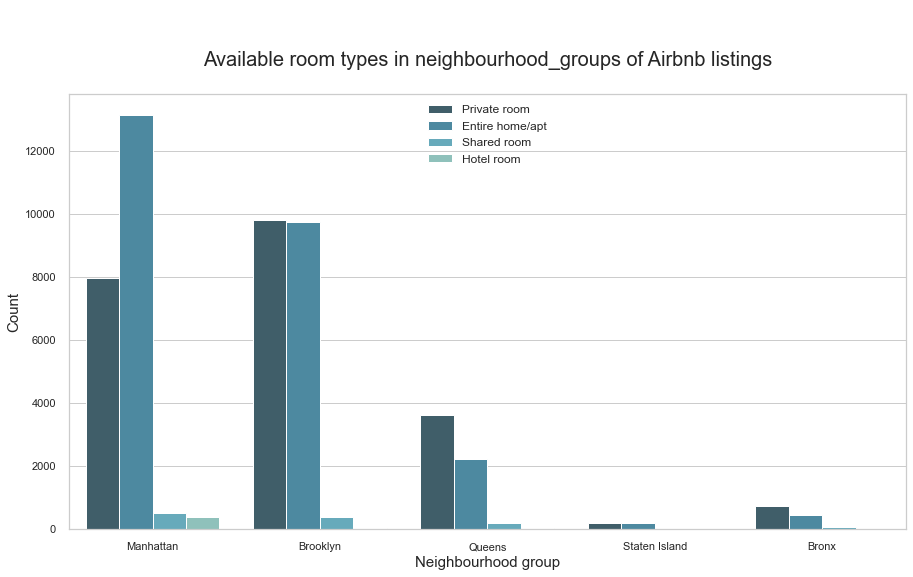

In [37]:
plt.figure(figsize=(9,6))
sns.countplot(df_listings['room_type'], palette="GnBu_d")
plt.title('\n\nTypes of Rooms in Airbnb listings for New York City\n', fontsize=20)
plt.xlabel('\nTypes of Rooms\n', fontsize='15')
plt.ylabel("Count", fontsize='15')
plt.show()
plt.figure(figsize=(15,8))
sns.countplot(data=df_listings, x='neighbourhood_group', hue='room_type', palette='GnBu_d')
plt.title('\n\nAvailable room types in neighbourhood_groups of Airbnb listings\n', fontsize=20)
plt.xlabel('Neighbourhood group', fontsize='15')
plt.ylabel("Count", fontsize='15')
plt.legend(frameon=False, fontsize=12)
plt.show()

From the above, we can see that we have few number of `Shared rooms` as usually the travelers and tourists prefer to have a space for them without any disturbances, therefore `Entire home/apt` & `Private rooms` are more popular and have more availability.<br>
<br>
We don't have much Airbnb listings in boroughs of `Staten Island` and `Bronx`, hence we will be having less numbers of rooms in all categories. Likewise we have more number of Airbnb listings in both `Manhattan` and `Brooklyn`, but the ratio of the rooms in each borough is almost the same.<br>

In [38]:
display(df_listings[['neighbourhood_group','room_type','id']].groupby(['neighbourhood_group','room_type']).count())

id
neighbourhood_group room_type             
Bronx               Entire home/apt    428
                    Private room       726
                    Shared room         44
Brooklyn            Entire home/apt   9728
                    Hotel room          34
                    Private room      9804
                    Shared room        365
Manhattan           Entire home/apt  13149
                    Hotel room         364
                    Private room      7957
                    Shared room        493
Queens              Entire home/apt   2229
                    Hotel room          33
                    Private room      3611
                    Shared room        195
Staten Island       Entire home/apt    182
                    Private room       181
                    Shared room          7

Let's visualize the room types in the map and verify whether the `'Manhattan'` and `'Brooklyn'` has more number of Entire home/apt and Private rooms.

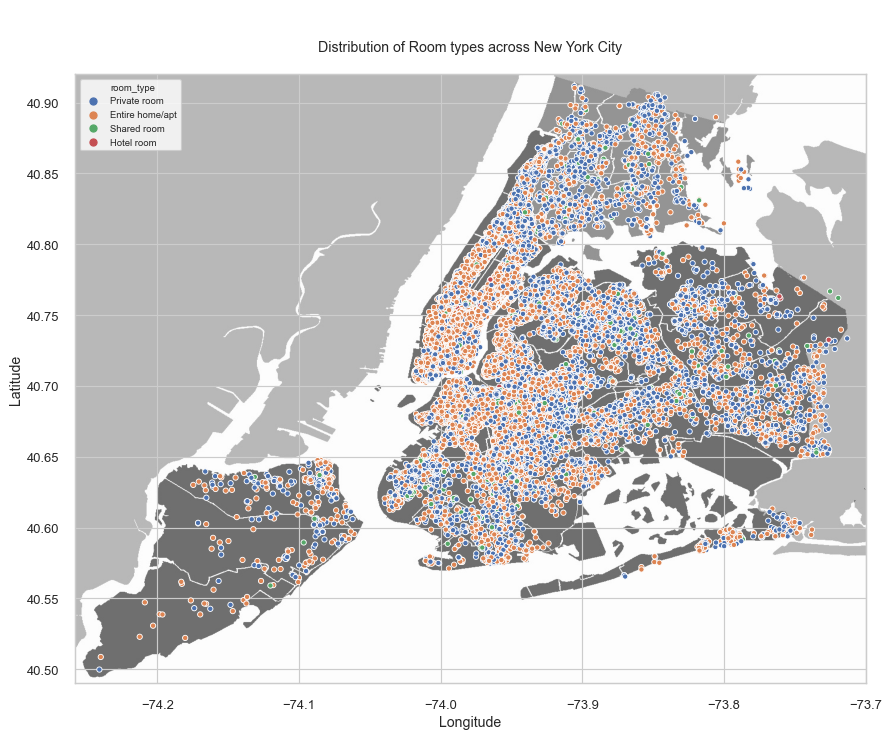

In [39]:
fig, ax = plt.subplots(figsize=(12,12),dpi=85)
img=plt.imread('NYC.png', 0)# importing the Background image
coordenates_to_extent = [-74.258, -73.7, 40.49, 40.92]
ax.imshow(img, zorder=0, extent=coordenates_to_extent)
nymap = sns.scatterplot(x='longitude', y='latitude', hue='room_type',s=20, ax=ax, data=df_listings)
nymap.set(xlabel='Longitude', ylabel='Latitude', title='\n\nDistribution of Room types across New York City\n')
ax.grid(True)
plt.legend(fontsize=8, loc='upper left')
plt.show()

From the above spatial analysis we can see that the `Manhattan` has more number of `Entire home/apt` (orange points) compared with `Private rooms` (blue points) and `Brooklyn` has more number of `Private Rooms` than `Entire home/apt`.

Text(0.5, 1.1, 'Housing disparity by apartment type and county')

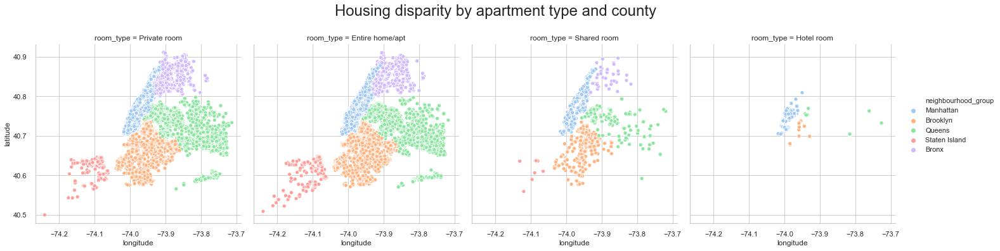

In [40]:
viz = sns.relplot(x='longitude', y='latitude', 
                    hue='neighbourhood_group', 
                    data=df_listings,palette="pastel",
                    col='room_type')
viz.fig.suptitle("Housing disparity by apartment type and county", fontsize=24, y=1.1)

### Price Distribution for Room Types

In [41]:
df_expensive=df_listings[df_listings.price>600]
df_normal=df_listings[df_listings.price<600]

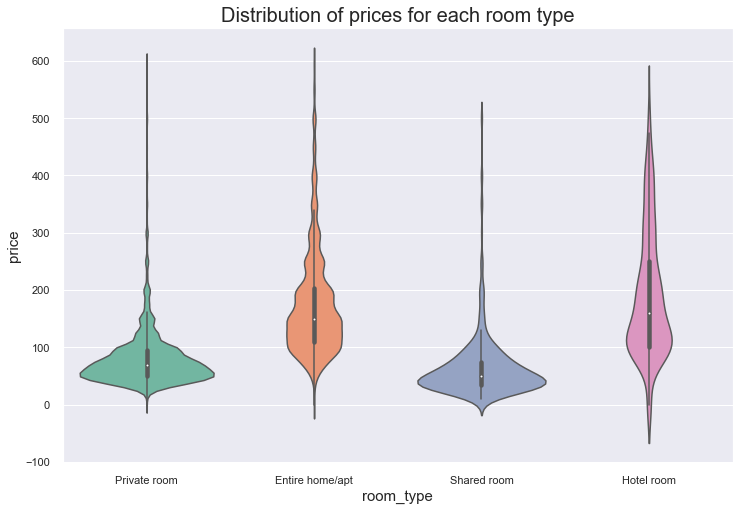

In [42]:
sns.set(rc={'figure.figsize':(12,8),"axes.titlesize":20,"axes.labelsize":15})
visual3=sns.violinplot(data=df_normal, x='room_type', y='price', palette='Set2')
visual3.set_title('Distribution of prices for each room type')
plt.show()

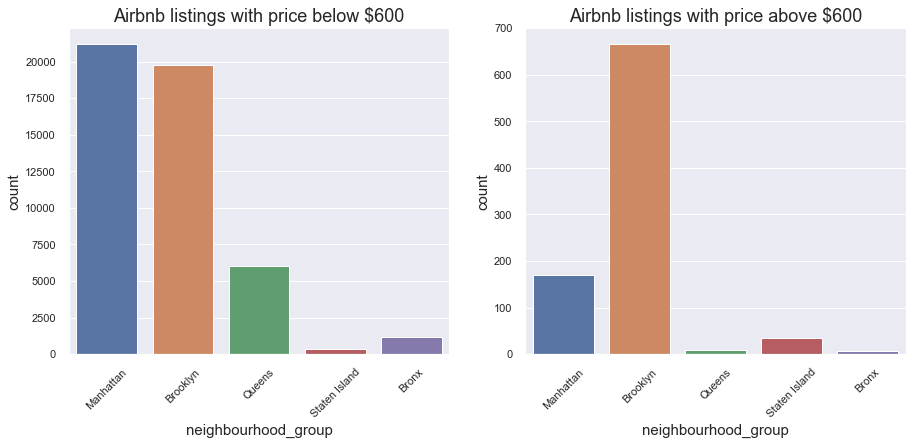

In [43]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
sns.set(style="whitegrid")
bp1 = sns.countplot(df_listings[df_listings['price']<600]['neighbourhood_group'], ax=ax1)
bp2 = sns.countplot(df_listings[df_listings['price']>600]['neighbourhood_group'], ax=ax2)

bp1.set_xticklabels(bp1.get_xticklabels(), rotation=45)
bp1.set_title("Airbnb listings with price below $600", fontsize='18')
bp2.set_xticklabels(bp1.get_xticklabels(), rotation=45)
plt.title("Airbnb listings with price above $600", fontsize='18')
plt.show()

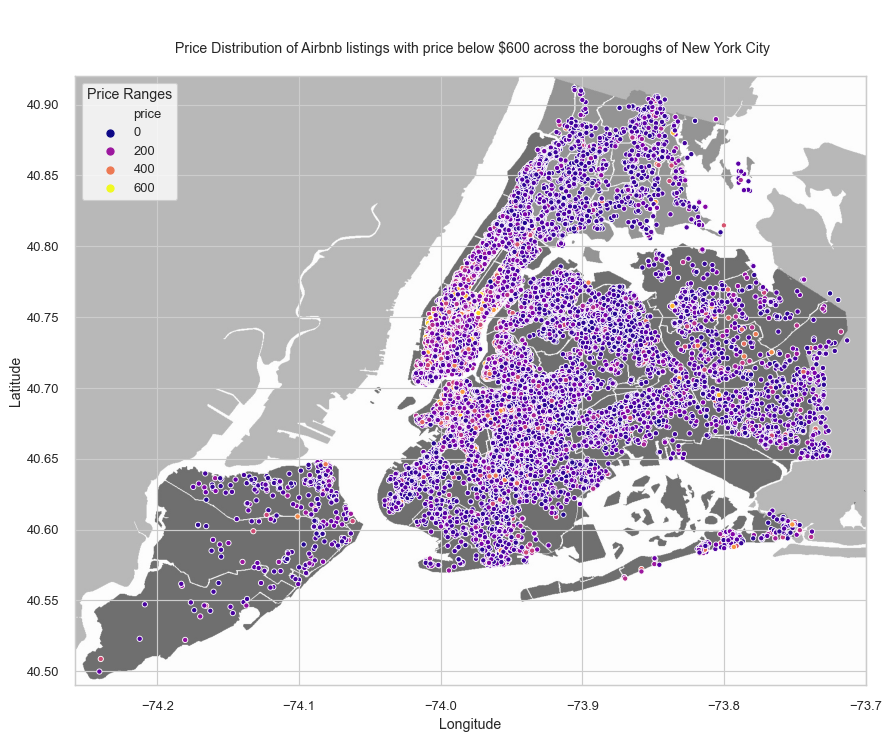

In [44]:
fig, ax = plt.subplots(figsize=(12,12),dpi =85)
img=plt.imread('NYC.png', 0)# importing the Background image
coordenates_to_extent = [-74.258, -73.7, 40.49, 40.92]
ax.imshow(img, zorder=0, extent=coordenates_to_extent)
nymap = sns.scatterplot(x=df_listings[df_listings['price']<600]['longitude'], y=df_listings[df_listings['price']<600]['latitude'], 
                        hue=df_listings[df_listings['price']<600]['price'] ,s=20, ax=ax, data=df_listings, palette='plasma')
nymap.set(xlabel='Longitude', ylabel='Latitude', title='\n\n Price Distribution of Airbnb listings with price below $600 across the boroughs of New York City\n')
ax.grid(True)
plt.legend(title='Price Ranges',loc='upper left')
plt.show()

More than 80% of Airbnb listings in New York City which price is below $600 are located in boroughs of `Manhattan`
and `Brooklyn`.

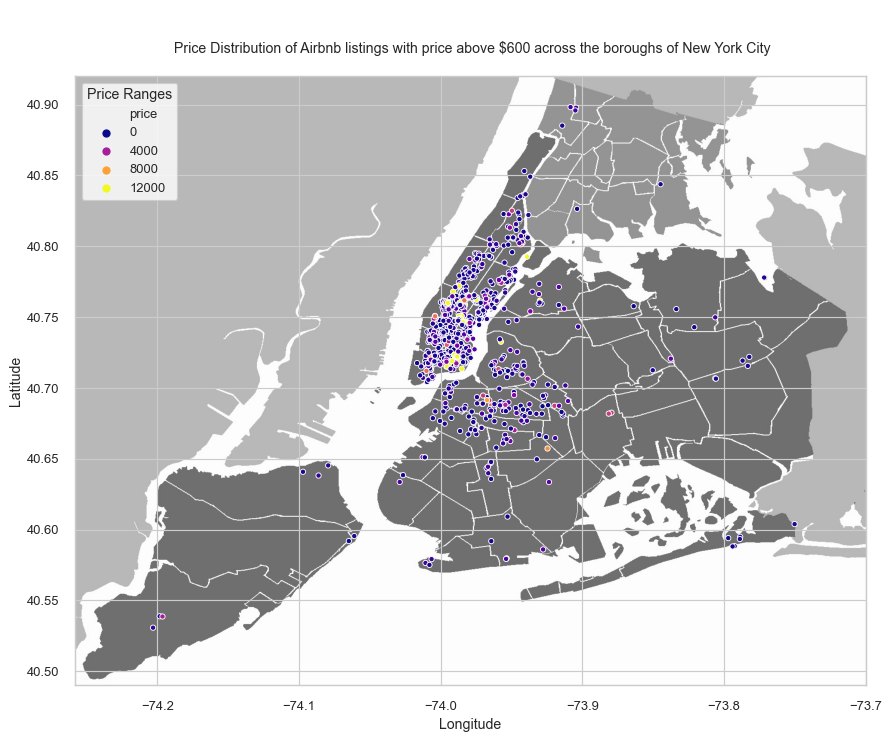

In [45]:
fig, ax = plt.subplots(figsize=(12,12),dpi =85)
img=plt.imread('NYC.png', 0)# importing the Background image
coordenates_to_extent = [-74.258, -73.7, 40.49, 40.92]
ax.imshow(img, zorder=0, extent=coordenates_to_extent)
nymap = sns.scatterplot(x=df_listings[df_listings['price']>600]['longitude'], y=df_listings[df_listings['price']>600]['latitude'], 
                        hue=df_listings[df_listings['price']>600]['price'] ,s=20, ax=ax, data=df_listings, palette='plasma')
nymap.set(xlabel='Longitude', ylabel='Latitude', title='\n\n Price Distribution of Airbnb listings with price above $600 across the boroughs of New York City\n')
ax.grid(True)
plt.legend(title='Price Ranges',loc='upper left')
plt.show()

Almost three-quarters of Airbnb listings in New York City which price is above $600 are located in borough of `Manhattan`.

### Availability of the rooms

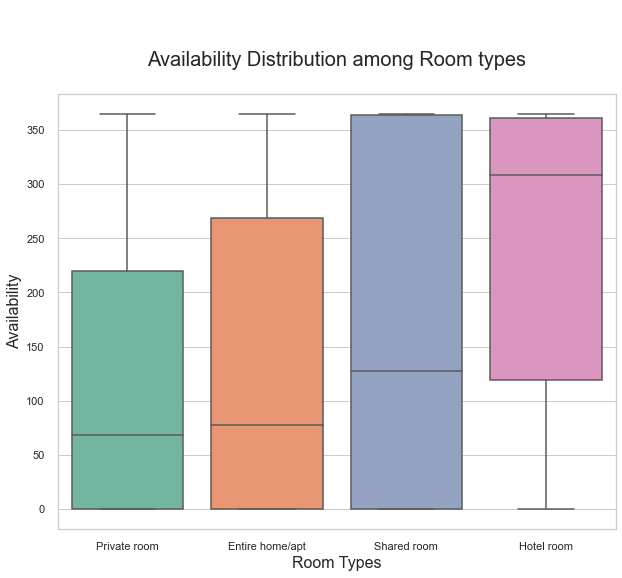

In [46]:
plt.figure(figsize=(10,8))
sns.boxplot(x='room_type',y='availability_365',data=df_listings,palette='Set2')
plt.xlabel('Room Types',fontsize=16)
plt.ylabel('Availability',fontsize=16)
plt.title('\n\nAvailability Distribution among Room types\n',fontsize=20)
plt.show()

From the above we can see that there is less availability in `Private rooms` and more availability in `hotel rooms`.<br>

Let's see how many rooms are available in each type in each neighbourhoods with average availability of each rooms.

In [47]:
a=pd.DataFrame(df_listings[['neighbourhood_group','room_type','id']]
               .groupby(['neighbourhood_group','room_type']).count())
a.rename(columns={'id':'Number of Rooms'},inplace=True)
b=pd.DataFrame(df_listings[['neighbourhood_group','room_type','availability_365']]
               .groupby(['neighbourhood_group','room_type']).mean())
b.rename(columns={'availability_365':'Average availability'},inplace=True)
c=pd.concat([a,b['Average availability']],axis=1)
display(c)

Number of Rooms  Average availability
neighbourhood_group room_type                                             
Bronx               Entire home/apt              428            174.425234
                    Private room                 726            177.351240
                    Shared room                   44            166.181818
Brooklyn            Entire home/apt             9728            114.500000
                    Hotel room                    34            254.852941
                    Private room                9804            107.328947
                    Shared room                  365            177.197260
Manhattan           Entire home/apt            13149            132.445509
                    Hotel room                   364            233.851648
                    Private room                7957            114.698379
                    Shared room                  493            162.099391
Queens              Entire home/apt             2229            147.831314
                    Hotel room                    33            322.333333
                    Private room                3611            153.680421
                    Shared room                  195            189.815385
Staten Island       Entire home/apt              182            192.296703
                    Private room                 181            198.524862
                    Shared room                    7            197.000000

### Availability of the same rooms based on `neighbourhood_groups` (boroughs)

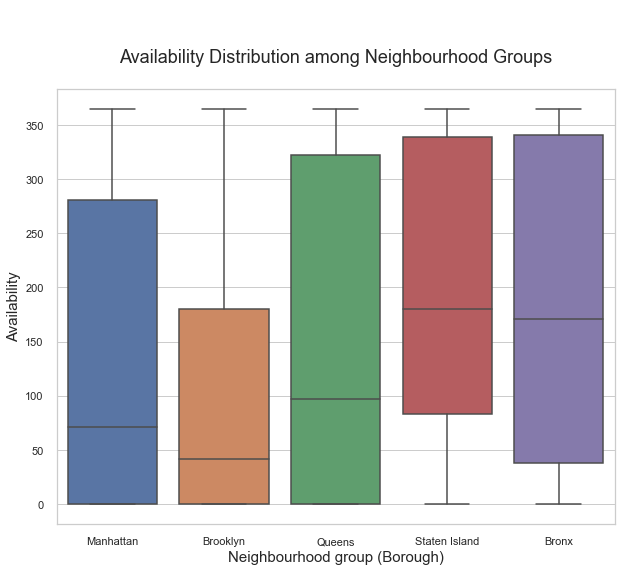

In [48]:
plt.figure(figsize=(10,8))
sns.boxplot(x='neighbourhood_group',y='availability_365',data=df_listings)
plt.xlabel('Neighbourhood group (Borough)',fontsize=15)
plt.ylabel('Availability',fontsize=15)
plt.title('\n\nAvailability Distribution among Neighbourhood Groups\n',fontsize=18)
plt.show()

From the above we can see that there are less availability in `Brooklyn` and `Manhattan` and there are more availability in `Staten Island` and `Bronx`.

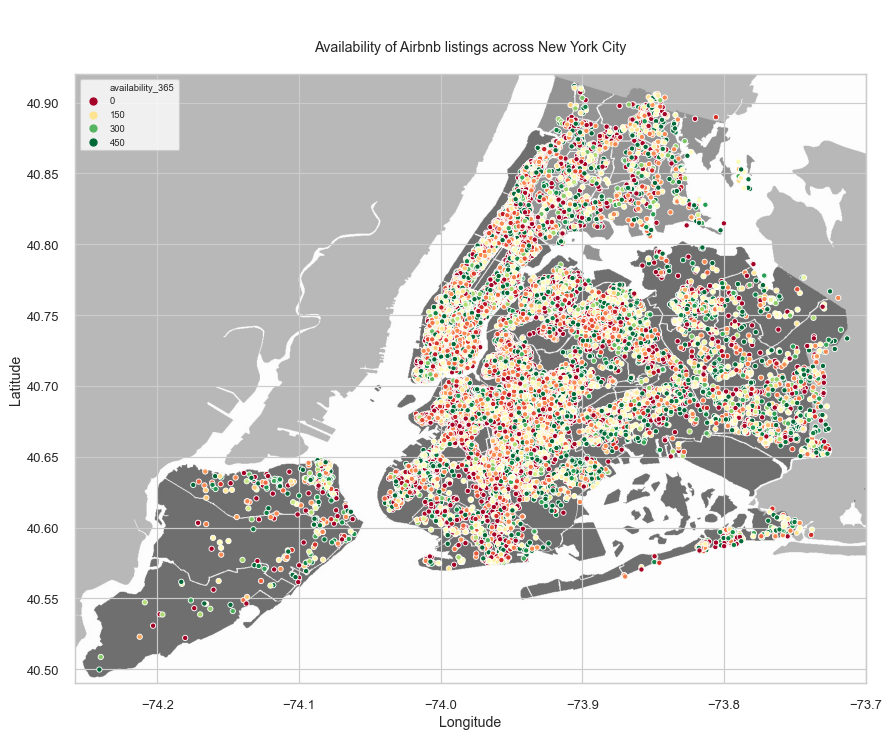

In [49]:
fig, ax = plt.subplots(figsize=(12,12),dpi=85)
img=plt.imread('NYC.png', 0)# importing the Background image
coordenates_to_extent = [-74.258, -73.7, 40.49, 40.92]
ax.imshow(img, zorder=0, extent=coordenates_to_extent)
nymap = sns.scatterplot(x='longitude', y='latitude', hue='availability_365',s=20, ax=ax, data=df_listings,palette='RdYlGn')
nymap.set(xlabel='Longitude', ylabel='Latitude', title='\n\nAvailability of Airbnb listings across New York City\n')
ax.grid(True)
plt.legend(fontsize=8, loc='upper left')
plt.show()

In the above plot, Red dots represents less availability of rooms (throughout a year) and Green dots represents more availability.  <br>     

We can notice that the boroughs like `Brooklyn` and `Manhattan` are having less availability of rooms due to its popularity and on the other hand the boroughs `Staten Island` and `Bronx` have more availability of rooms as because its less popular than the above two boroughs.

In [50]:
print("Percentage of Airbnb listings not available in New York      : ",round(len(df_listings[df_listings.availability_365 == 0])/df_listings.shape[0]*100,2),"%")
print("Percentage of Airbnb listings not available in Manhattan     : ",round(len(df_manhattan[df_manhattan.availability_365 == 0])/df_manhattan.shape[0]*100,2),"%")
print("Percentage of Airbnb listings not available in Brooklyn      : ",round(len(df_brooklyn[df_brooklyn.availability_365 == 0])/df_brooklyn.shape[0]*100,2),"%")
print("Percentage of Airbnb listings not available in Queens        : ",round(len(df_queens[df_queens.availability_365 == 0])/df_queens.shape[0]*100,2),"%")
print("Percentage of Airbnb listings not available in Staten Island : ",round(len(df_staten_island[df_staten_island.availability_365 == 0])/df_staten_island.shape[0]*100,2),"%")
print("Percentage of Airbnb listings not available in Bronx         : ",round(len(df_bronx[df_bronx.availability_365 == 0])/df_bronx.shape[0]*100,2),"%")

Percentage of Airbnb listings not available in New York      :  40.65 %
Percentage of Airbnb listings not available in Manhattan     :  41.68 %
Percentage of Airbnb listings not available in Brooklyn      :  45.1 %
Percentage of Airbnb listings not available in Queens        :  27.87 %
Percentage of Airbnb listings not available in Staten Island :  14.05 %
Percentage of Airbnb listings not available in Bronx         :  20.7 %


### The average number of minimum nights to rent an Airbnb in New York City

In [51]:
# checking the average for minimum_nights
print('Average minimum_nights                  :',  df_listings.minimum_nights.mean())
print('Average minimum_nights in Manhattan     :',  df_manhattan.minimum_nights.mean())
print('Average minimum_nights in Brooklyn      :',  df_brooklyn.minimum_nights.mean())
print('Average minimum_nights in Queens        :',  df_queens.minimum_nights.mean())
print('Average minimum_nights in Staten Island :',  df_staten_island.minimum_nights.mean())
print('Average minimum_nights in Bronx         :',  df_bronx.minimum_nights.mean())

Average minimum_nights                  : 8.191540480516858
Average minimum_nights in Manhattan     : 9.951828074488914
Average minimum_nights in Brooklyn      : 7.068235412171993
Average minimum_nights in Queens        : 6.285761371127225
Average minimum_nights in Staten Island : 4.3432432432432435
Average minimum_nights in Bronx         : 5.44991652754591


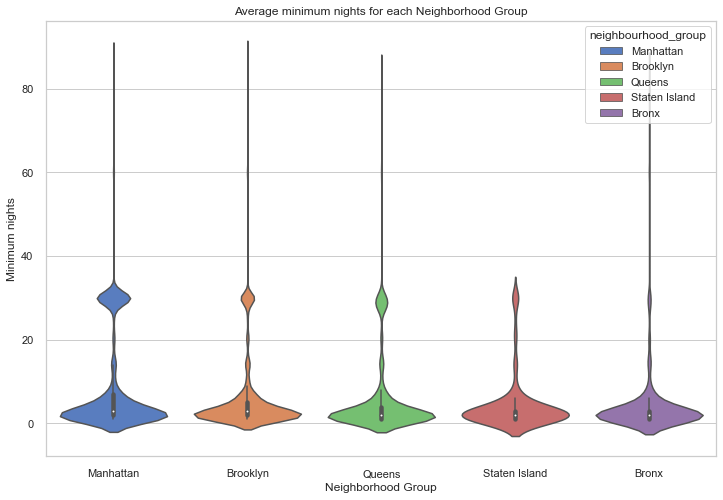

,Average-Price
neighbourhood_group,
Bronx,90.176127
Brooklyn,125.056194
Manhattan,218.855166
Queens,99.745056
Staten Island,116.908108


In [52]:
plt.figure(figsize=(12,8))
vplot=sns.violinplot( x="neighbourhood_group", y="minimum_nights",hue="neighbourhood_group", data=df_listings[df_listings['minimum_nights'] < 90], palette="muted", dodge=False)
vplot.set(xlabel='Neighborhood Group', ylabel='Minimum nights', title='Average minimum nights for each Neighborhood Group')
plt.show()
avgminights= pd.DataFrame((df_listings[['neighbourhood_group','minimum_nights']].groupby(['neighbourhood_group']).mean()))
avgminights.rename(columns={'price':'Average-Minimum nights'},inplace=True)
display(avgprice)

### Price per number of reviews

Text(0.5, 1.1, 'Price per number of reviews')

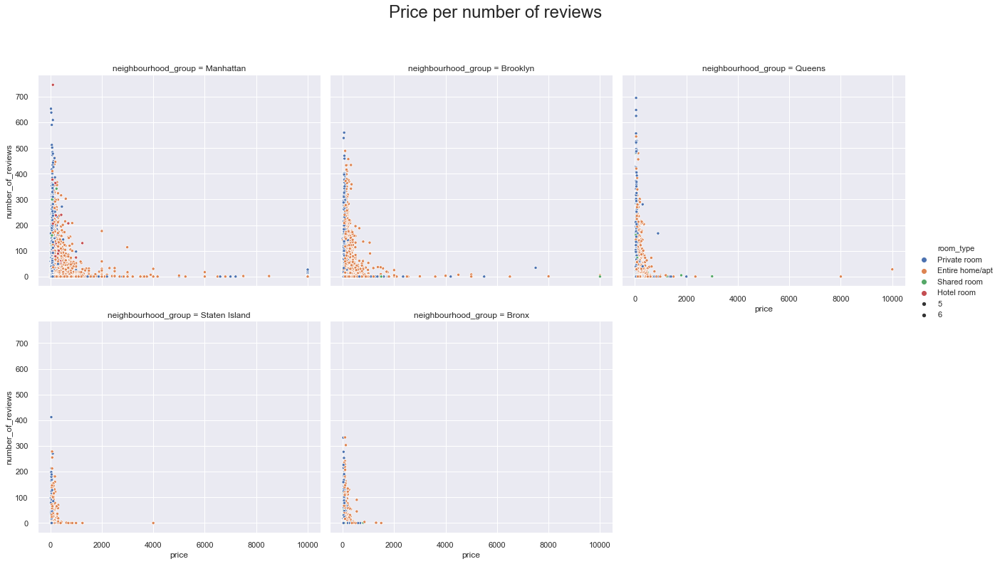

In [53]:
sns.set_style('darkgrid')
viz = sns.relplot(y='number_of_reviews', x='price', data=df_listings, hue="room_type", col="neighbourhood_group", col_wrap=3, size=6, aspect=1.2)
viz.fig.suptitle("Price per number of reviews", fontsize=24, y =1.1)

### Minimum nights Neighbourhood_group

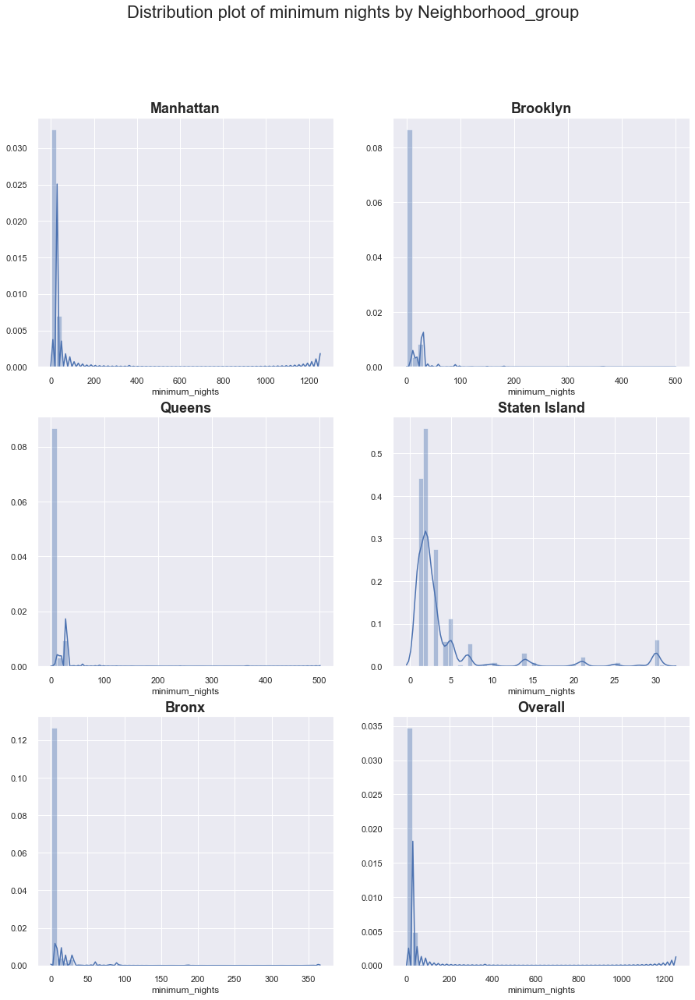

In [54]:
# Create a matrix of subplots, 2x3
fig, ax = plt.subplots(3, 2, figsize=(15,20))

# Create the distribution plots, set it to a variable for extraneous detailing later in the code
manhattan = sns.distplot(df_manhattan['minimum_nights'], ax=ax[0,0])
brooklyn = sns.distplot(df_brooklyn['minimum_nights'], ax=ax[0,1])
queens = sns.distplot(df_queens['minimum_nights'], ax=ax[1,0])
st = sns.distplot(df_staten_island['minimum_nights'], ax=ax[1,1])
bronx = sns.distplot(df_bronx['minimum_nights'], ax=ax[2,0])
overall = sns.distplot(df_listings['minimum_nights'], ax=ax[2,1])

# Extraineous detailing, such as setting the title and making the fontsize bigger
fig.suptitle('Distribution plot of minimum nights by Neighborhood_group', fontsize='22')
manhattan.set_title("Manhattan", weight='bold').set_fontsize('18')
brooklyn.set_title("Brooklyn", weight='bold').set_fontsize('18')
queens.set_title("Queens", weight='bold').set_fontsize('18')
st.set_title("Staten Island", weight='bold').set_fontsize('18')
bronx.set_title("Bronx", weight='bold').set_fontsize('18')
overall.set_title("Overall", weight='bold').set_fontsize('18')
plt.show()

### Number of Reviews and Price Analysis

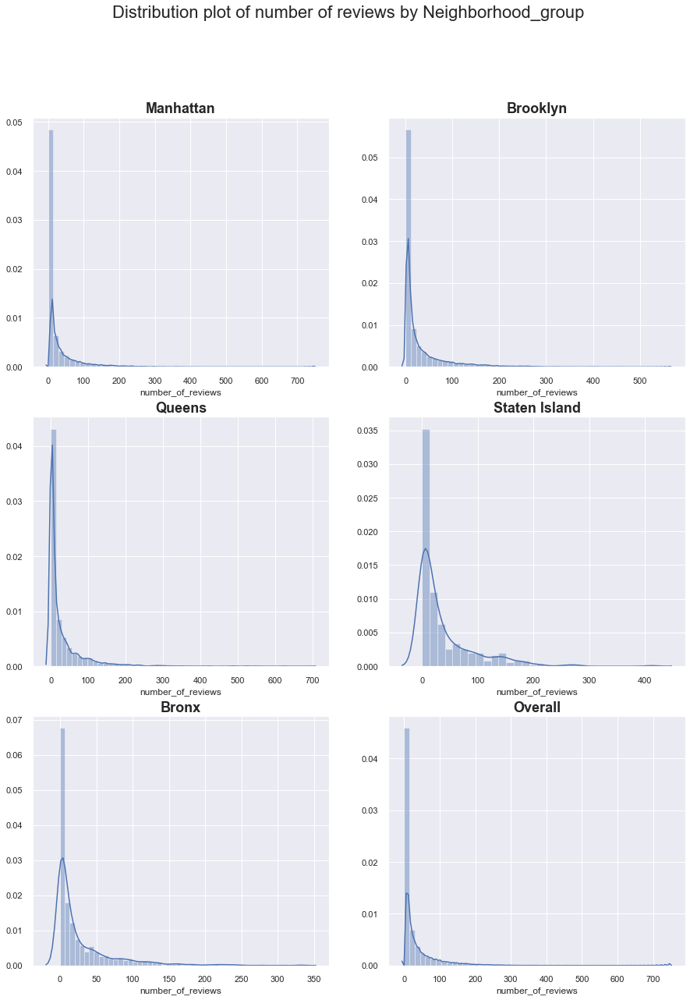

In [55]:
# Create a matrix of subplots, 2x3
fig, ax = plt.subplots(3, 2, figsize=(15,20))

# Create the distribution plots, set it to a variable for extraneous detailing later in the code
manhattan = sns.distplot(df_manhattan['number_of_reviews'], ax=ax[0,0])
bronx = sns.distplot(df_brooklyn['number_of_reviews'], ax=ax[0,1])
queens = sns.distplot(df_queens['number_of_reviews'], ax=ax[1,0])
st = sns.distplot(df_staten_island['number_of_reviews'], ax=ax[1,1])
brooklyn = sns.distplot(df_bronx['number_of_reviews'], ax=ax[2,0])
overall = sns.distplot(df_listings['number_of_reviews'], ax=ax[2,1])

# Extraineous detailing, such as setting the title and making the fontsize bigger
fig.suptitle('Distribution plot of number of reviews by Neighborhood_group', fontsize='22')
manhattan.set_title("Manhattan", weight='bold').set_fontsize('18')
bronx.set_title("Brooklyn", weight='bold').set_fontsize('18')
queens.set_title("Queens", weight='bold').set_fontsize('18')
st.set_title("Staten Island", weight='bold').set_fontsize('18')
brooklyn.set_title("Bronx", weight='bold').set_fontsize('18')
overall.set_title("Overall", weight='bold').set_fontsize('18')
plt.show()

In [56]:
# Grab the latitude and longitude of each listing into the locations list
location = []
for idx, row in df_listings.iterrows():
    location.append([row['latitude'], row['longitude'], 2])

# Create the NYC map using the Map module from the ipyleaflet library
nyc_map = Map(center=(40.75,-74.01), zoom=10)
nyc_map

heatMap = Heatmap(
    locations = location,
    radius =8
)

# Add the heatmap layer onto the map
nyc_map.add_layer(heatMap);
nyc_map

Map(center=[40.75, -74.01], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_…

In [57]:
df_listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49530 entries, 0 to 49529
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              49530 non-null  int64  
 1   name                            49512 non-null  object 
 2   host_id                         49530 non-null  int64  
 3   host_name                       49524 non-null  object 
 4   neighbourhood_group             49530 non-null  object 
 5   neighbourhood                   49530 non-null  object 
 6   latitude                        49530 non-null  float64
 7   longitude                       49530 non-null  float64
 8   room_type                       49530 non-null  object 
 9   price                           49530 non-null  int64  
 10  minimum_nights                  49530 non-null  int64  
 11  number_of_reviews               49530 non-null  int64  
 12  last_review                     

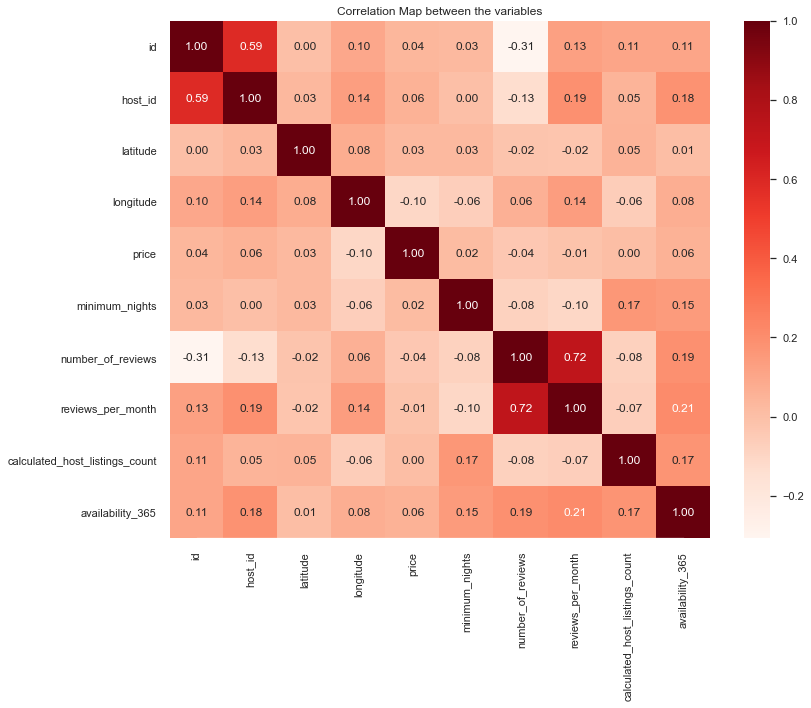

In [58]:
f, ax = plt.subplots(figsize=(12,10))
sns.heatmap(df_listings.corr(), annot=True, cmap=plt.cm.Reds, fmt=".2f")
ax.set(title='Correlation Map between the variables')
ax.xaxis.grid(False)
sns.despine(left=True,trim=True)
plt.tight_layout()
plt.show()

Most of the variables aren't really correlated, but we can learn some more by analyzing their correlation with each other.   
The heatmap is a very powerful tool, and it can show us many things. In our case, it's important to point out:<br>
    
- <b>Observations on price:</b><br>  
    
    - `Latitude` is the most correlated variable with `price`, which emphasizes one of the most important concepts of real estate: "Location matters". However, this is a slight indication of higher prices located in the northern parts of the city. Manhattan, which is the most expensive borough of New York City, is located to the north side of the city.
    - `Longitude` seems to be negatively correlated with `price`, meaning that one can expect higher prices as position in NYC moves to the Western parts of the city, emphasizing again to the importance of location.
    - 'price' is also positively correlated with `availability_365` showing the fact that some Airbnb rental places are rented by hosts who list other properties, increasing the number of `minimum_night`.     
    - `price` is negalively correlated with `number_of_reviews` and `reviews_per_ month`, indicating that it is possible that the prior reviews could depress the prices to some extent.<br>

- <b>Other interesting observations:</b><br>    
    
    - `calculated_host_listings_count` is positively correlated with `minimum_nights` and `availability_365` indicating that hosts who list more than one property, may think more strategic rather than opportunisitic about their rentals. That may attempt to maximize the amount of time a single renter stays at their property to minimize turnover cost. They also tend to maximize the amount of time the property is being rented.

### Exploratory Data Analysis Conclusions

This was a simple analysis on a summarized dataset made available by Airbnb on New York City. Our analysis can help us get to some coclusions:
- The closer you are to Midtown, and the Lower Manhattan Area, the more expensive it gets.
- The average price for an Airbnb rented space in New York City is $ 162.7 per night.
- The percentage of Airbnb listings not available in New York City is 40.6%. 
- The average minimum number of nights you need to get an Airbnb listing in New York City is 8.2.

# Chapter 3. Data Wrangling & Pre-Processing

### How many attributes (variables) and entries are there in our dataset? What are the types of the variables?

Since this is a summarized version of the data, we don't have as many variables as Airbnb actually collects.\
For a more complete version of this dataset, visit Inside Airbnb.

In [59]:
# identifying the volume of the data in the DataFrame
print("Variables:\t {}".format(df_listings.shape[1]))
print("Entries:\t {}\n".format(df_listings.shape[0]))

# identifying the types of the variables
display(df_listings.dtypes)

Variables:	 16
Entries:	 49530



id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [60]:
ng_list = df_listings['neighbourhood_group'].unique()
print(ng_list)

['Manhattan' 'Brooklyn' 'Queens' 'Staten Island' 'Bronx']


In [61]:
len(ng_list)

5

In [62]:
n_list = df_listings['neighbourhood'].unique()
print(n_list)

['Washington Heights' 'Midtown' 'Clinton Hill' 'Murray Hill'
 'Bedford-Stuyvesant' 'Sunset Park' "Hell's Kitchen" 'Upper West Side'
 'Chinatown' 'West Village' 'South Slope' 'Williamsburg' 'East Harlem'
 'Fort Greene' 'Inwood' 'East Village' 'Harlem' 'Bushwick' 'Flatbush'
 'Lower East Side' 'Prospect-Lefferts Gardens' 'Long Island City'
 'Chelsea' 'Greenpoint' 'Kips Bay' 'Nolita' 'Upper East Side' 'Red Hook'
 'Prospect Heights' 'Park Slope' 'Woodside' 'Brooklyn Heights'
 'Carroll Gardens' 'Gowanus' 'Flatlands' 'Cobble Hill' 'Flushing'
 'Boerum Hill' 'Sunnyside' 'St. George' 'Tribeca' 'Highbridge' 'NoHo'
 'Ridgewood' 'Morningside Heights' 'Jamaica' 'Middle Village'
 'Ditmars Steinway' 'Flatiron District' 'Windsor Terrace'
 'Roosevelt Island' 'SoHo' 'Greenwich Village' 'Little Italy'
 'Tompkinsville' 'Gramercy' 'Astoria' 'Kensington' 'Clason Point'
 'Eastchester' 'Crown Heights' 'Kingsbridge' 'Queens Village'
 'Rockaway Beach' 'Forest Hills' 'East Flatbush' 'Woodlawn'
 'University Height

In [63]:
len(n_list)

222

### What's the percentage of missing values in the dataset?

In [64]:
display(pd.concat([df_listings.isnull().sum().sort_values(ascending =False),((df_listings.isnull().sum() / len(df_listings))*100).sort_values(ascending = False)],axis = 1,keys = ['Total','Percent %']))

,Total,Percent %
reviews_per_month,11319,22.852816
last_review,11319,22.852816
name,18,0.036342
host_name,6,0.012114
availability_365,0,0.000000
calculated_host_listings_count,0,0.000000
number_of_reviews,0,0.000000
minimum_nights,0,0.000000
price,0,0.000000
room_type,0,0.000000


From the above we can see that the features `last_review` and `reviews_per_month` are missing about 23% of the data, hence we will be replacing null values in their columns with '0' in the dataset.<br>

We will also be dropping the features `id`, `name`, `host_id` and `host_name` as they possess insignificant relationship to the target variable `price` and also these are textual data. Hence we will be dropping these features while modelling but for Exploratory Data Analysis (EDA) we will make use of it to understand the dataset better. <br>
    
Finally, we will examine if we have data with `price` equals to '0' and we will be dropping the zero prices from the dataset.<br> 

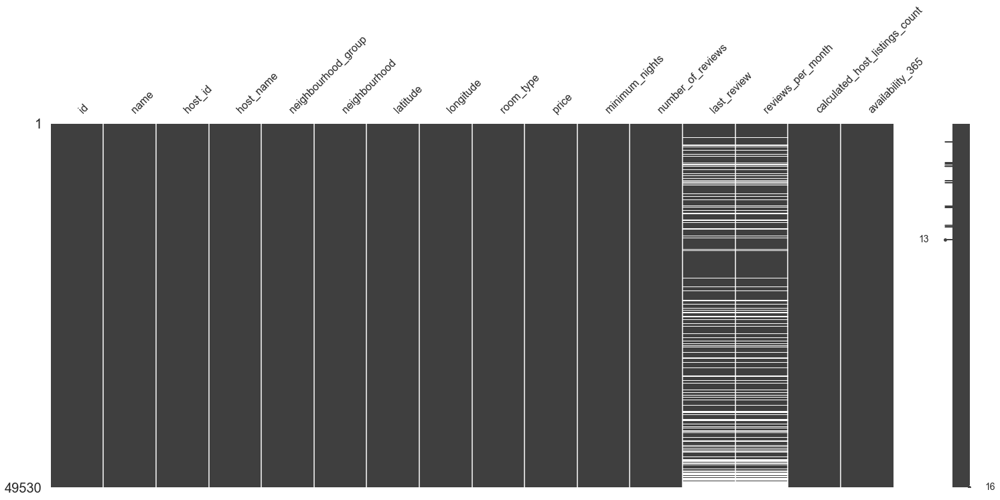

In [65]:
ms.matrix(df_listings)

We use a library to better visualize the missing values and the correlation between them to better know if they have type MCAR, MCR, MNAR. 

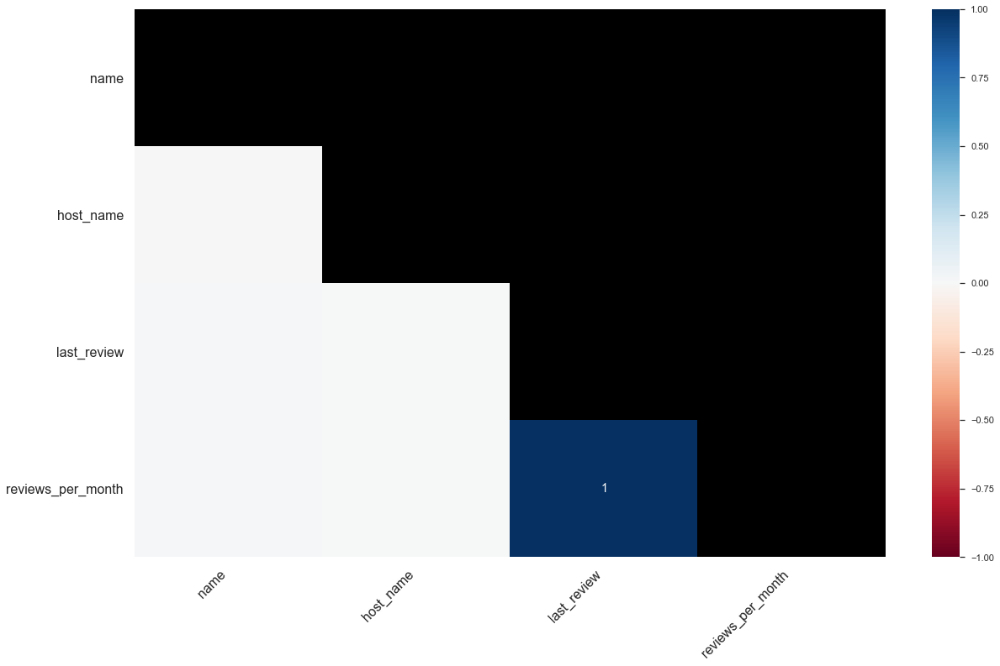

In [66]:
ms.heatmap(df_listings)

There is a correlation between two columns "last_review" and "reviews_per_months" which is normal.</br>

In [67]:
#filling the NaN values with 0 for 'reviews_per_month' variable
df_listings['reviews_per_month'].fillna(0,inplace=True)

In [68]:
#filling the NaN values with 0 for 'last_review' variable
df_listings['last_review'].fillna(0,inplace=True)

In [69]:
df_clean = df_listings.drop(['id','name','host_id','host_name'],axis=1)

In [70]:
# Checking the shape of the dataset after dropping the NaN values
df_clean.shape

(49530, 12)

In [71]:
# for the rest of the variables we will just drop the NaN entries
df_clean.dropna(inplace=True)

In [72]:
# examine if we have data with price equals to zero
df_clean[df_clean['price']==0].count()

neighbourhood_group               26
neighbourhood                     26
latitude                          26
longitude                         26
room_type                         26
price                             26
minimum_nights                    26
number_of_reviews                 26
last_review                       26
reviews_per_month                 26
calculated_host_listings_count    26
availability_365                  26
dtype: int64

In [73]:
# drop the zero price from data
df_clean = df_clean[df_clean['price']!=0]

In [74]:
# Checking the shape of the dataset after dropping the data with zero price
df_clean.shape

(49504, 12)

In [75]:
df_clean.head()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,Manhattan,Washington Heights,40.85722,-73.93790,Private room,100,1,1,2008-09-22,0.01,1,365
1,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,3,48,2019-11-04,0.37,2,335
2,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,322,2020-06-07,4.64,1,276
3,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,78,2019-10-13,0.58,1,0
4,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,29,50,2019-12-02,0.37,1,365


In [76]:
df_clean.isnull().sum()

neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
last_review                       0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

In [77]:
# Convert the datetime information into a numerical attribute 
# by extracting the number of days since the last review (comparing to the current day)
df_clean['last_review'] = pd.to_datetime(df_clean['last_review'])
today = pd.to_datetime('today')
df_clean['days_since_last_review'] = today - df_clean['last_review']
df_clean['days_since_last_review'] = df_clean['days_since_last_review'].dt.days
df_clean.drop(['last_review'], axis=1, inplace=True)

In [78]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49504 entries, 0 to 49529
Data columns (total 12 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   neighbourhood_group             49504 non-null  object 
 1   neighbourhood                   49504 non-null  object 
 2   latitude                        49504 non-null  float64
 3   longitude                       49504 non-null  float64
 4   room_type                       49504 non-null  object 
 5   price                           49504 non-null  int64  
 6   minimum_nights                  49504 non-null  int64  
 7   number_of_reviews               49504 non-null  int64  
 8   reviews_per_month               49504 non-null  float64
 9   calculated_host_listings_count  49504 non-null  int64  
 10  availability_365                49504 non-null  int64  
 11  days_since_last_review          49504 non-null  int64  
dtypes: float64(3), int64(6), object(

### Which is the relationship between Numerical (continuous) variables and the target variable?

In [79]:
#identifying insignificant Features
def coefpval(x,y):
    x=x[x.corr().columns]
    ls=[]
    for i in range(x.shape[1]):
        ls.append(stats.pearsonr(x.iloc[:,i], y))
    copv=pd.DataFrame(ls,index=x.columns,columns= ['Pearson-Coeff','P-Value'])
    copv['P-Ind'] = pd.cut(copv['P-Value'], bins =[0, 0.001, 0.05,0.1, 1.0], labels=['Strong','Moderate','Weak','Insignificant'], include_lowest=True )
    copv['C-Ind'] = pd.cut(copv['Pearson-Coeff'], bins =[-1.0,0, 1.0], labels=['Negative','Positive'], include_lowest=True )
    
    return copv

# Function of multi-Correlation
def multicorrelation(data, threshold=0.80):
    col_corr = set()  # Set of all the names of deleted columns
    corr_matrix = data.corr()
    
    print('  \n    Correlation with more than :',threshold)
    print('\n\nCorr Value',"\t",'Fearture1', "\t\t\t\t", 'Feature 2')
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (abs(corr_matrix.iloc[i, j]) >= threshold) and (corr_matrix.columns[j] not in col_corr):
                print(f'{corr_matrix.iloc[i, j].round(5):<{16}} {corr_matrix.columns[i]:{39}} {corr_matrix.columns[j]:{40}}')
                     
    print('\n\n The above mentioned correlations only are present in the given Dataset')

In [80]:
x= df_clean.dropna().drop('price',axis=1)
y= df_clean.dropna()['price']

In [81]:
display(coefpval(x,y))

,Pearson-Coeff,P-Value,P-Ind,C-Ind
latitude,0.027656,7.539657e-10,Strong,Positive
longitude,-0.100169,1.419651e-110,Strong,Negative
minimum_nights,0.015939,3.904913e-04,Strong,Positive
number_of_reviews,-0.035733,1.825600e-15,Strong,Negative
reviews_per_month,-0.027681,7.281707e-10,Strong,Negative
calculated_host_listings_count,0.004707,2.949542e-01,Insignificant,Positive
availability_365,0.055743,2.250904e-35,Strong,Positive
days_since_last_review,0.058312,1.491663e-38,Strong,Positive


From the above results we can see that the `calculated_host_listings_count` has an insignificant relationship with the Target variable price. <br>

In [82]:
df_clean.drop(['calculated_host_listings_count'],axis=1,inplace=True)

In [83]:
multicorrelation(df_clean,threshold=0.5)

  
    Correlation with more than : 0.5


Corr Value 	 Fearture1 				 Feature 2
0.7467           reviews_per_month                       number_of_reviews                       


 The above mentioned correlations only are present in the given Dataset


The correlation between `reviews_per_month` and `number_of_reviews` is bigger than 0.7, hence we will remove one of them (`reviews_per_month`)

In [84]:
df_clean.drop(['reviews_per_month'],axis=1,inplace=True)

In [85]:
# Checking the shape of the dataset after dropping the NaN values
df_clean.shape

(49504, 10)

<Figure size 6000x4000 with 0 Axes>

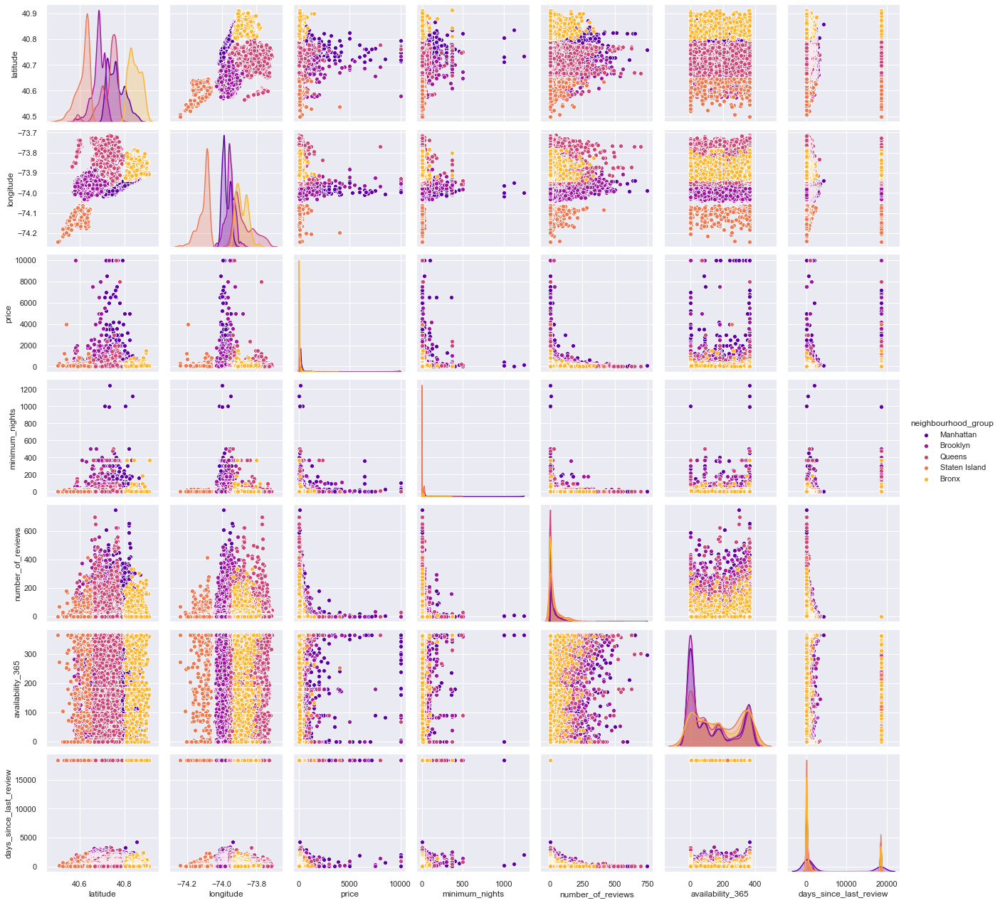

In [86]:
plt.figure(dpi=500)
sns.pairplot(df_clean,hue='neighbourhood_group',palette='plasma')

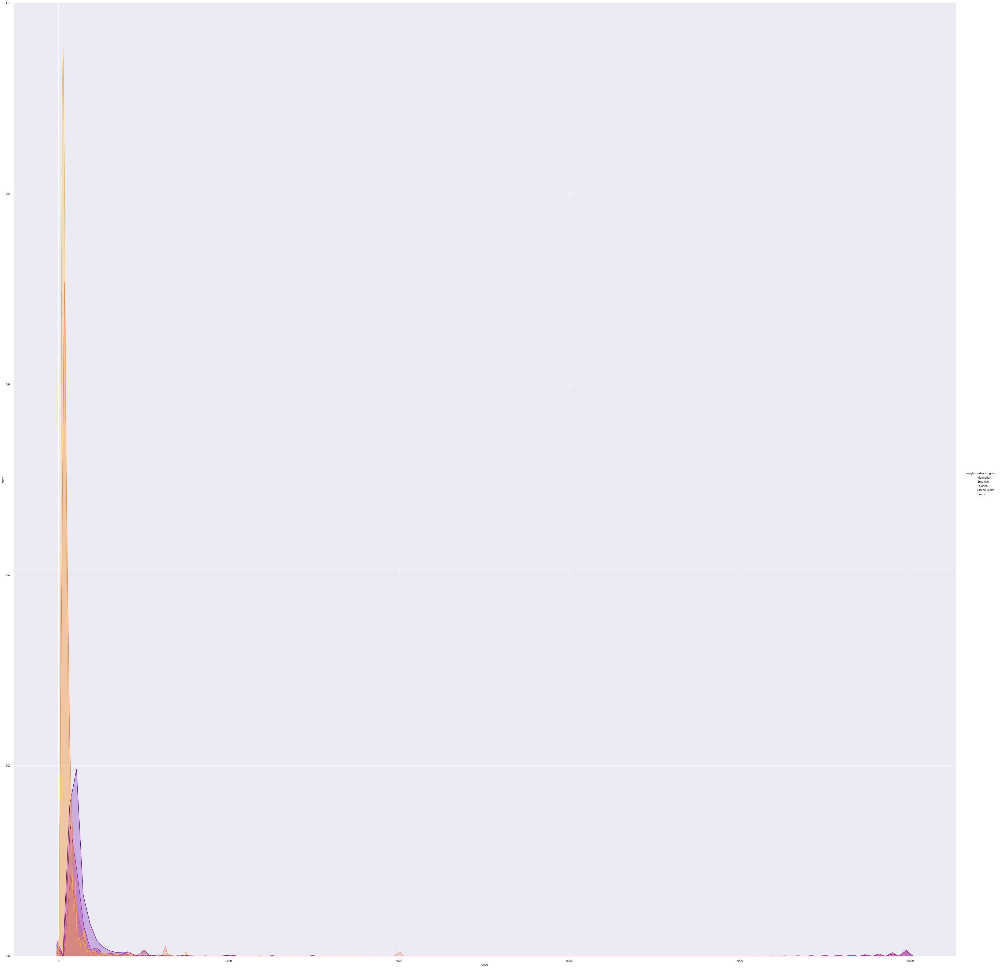

In [87]:
sns.pairplot(x_vars='price',y_vars='price',data=df_clean,hue='neighbourhood_group',palette='plasma',size =50)

From the above plots we can see that the `price` distribution (target variable) is heavily skewed towards right (positive)<br>
and the `neighbourhood_group` variable is not separating the price distribution well as it overlaps on each other.<br>
We observe the same through violin plot when we have tried to get know about the average price of rent based on neighborhood_group. 

Now, we will explore about the `neighbourhood_group` and `neighbourhood` to understand the dataset.

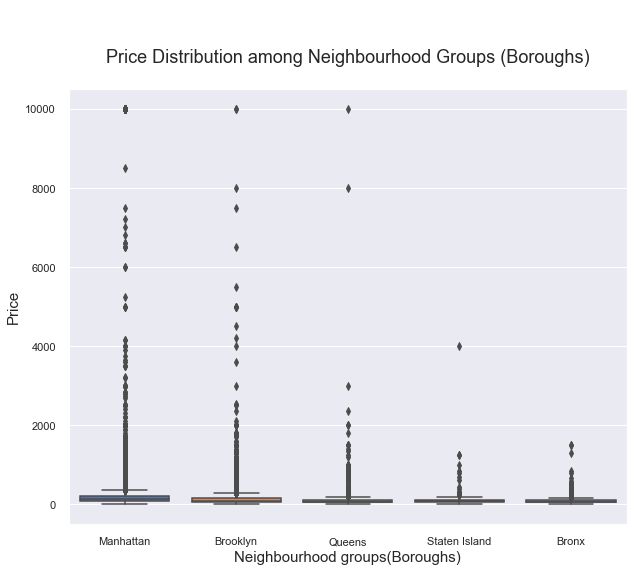

In [88]:
plt.figure(figsize=(10,8))
sns.boxplot(x='neighbourhood_group',y='price',data=df_clean)
plt.xlabel('Neighbourhood groups(Boroughs)',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.title('\n\nPrice Distribution among Neighbourhood Groups (Boroughs)\n',fontsize=18)
plt.show()

From the above we can see that there is a lot of outliers in the price variable, let's check its distribution.

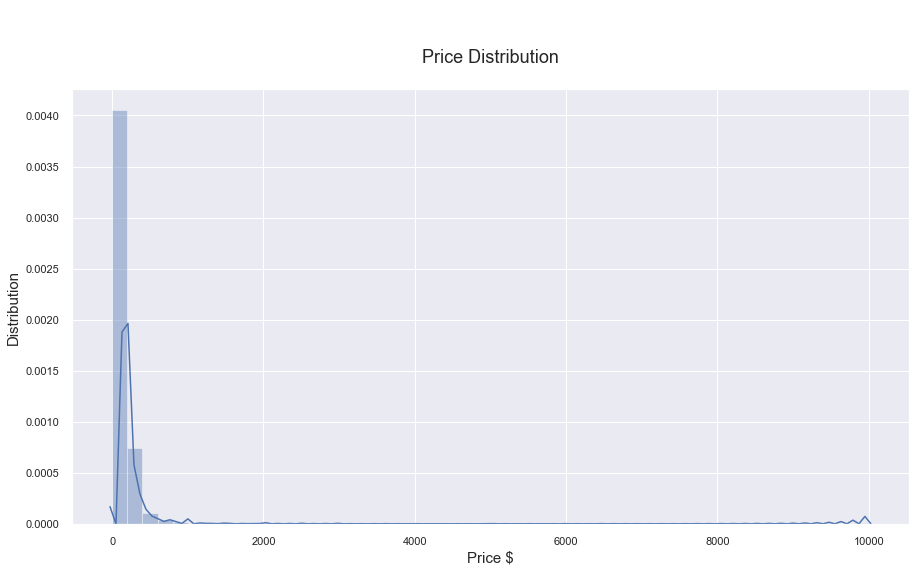

In [89]:
plt.figure(figsize=(15,8))
sns.distplot(df_listings['price'])
plt.xlabel('Price $',fontsize=15)
plt.ylabel('Distribution',fontsize=15)
plt.title('\n\nPrice Distribution\n',fontsize=18)
plt.show()

From the above we can see that the price variable is heavily skewed towards right (which needs to be normalized). <br>     
Let's check whether the number of reviews affect the price of Airbnb listings and check for any kind of relationship

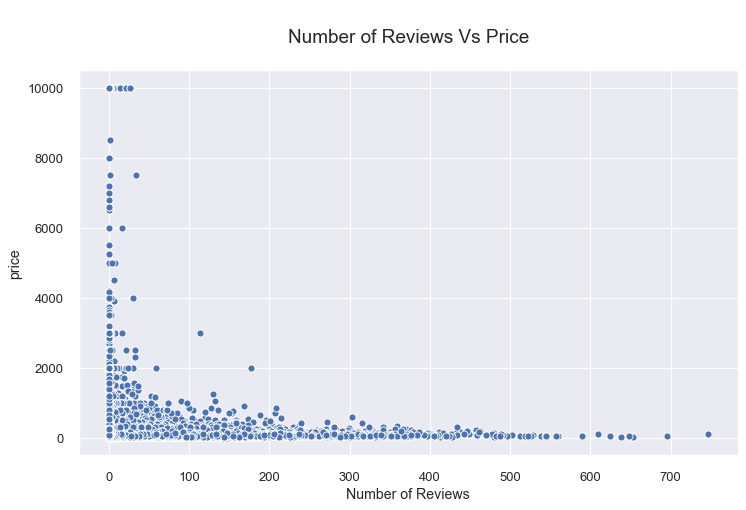

In [90]:
plt.figure(figsize=(10,6),dpi=85)
sns.scatterplot(x='number_of_reviews',y='price',data=df_listings)
plt.xlabel('Number of Reviews',fontsize=12)
plt.ylabel('price',fontsize=12)
plt.title('\nNumber of Reviews Vs Price\n',fontsize=16)
plt.show()

As most of our Airbnb locations have 0 reviews because they stay for minimum number of days but sometimes longer stay ends up with good reviews(its not guaranteed), thus we will be neglecting Number of reviews as it is not a good predictor of Price.

### Examine the statistical distribution of the data

To help us understand the distribution of the data, let's plot some histograms:

In [91]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49504 entries, 0 to 49529
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   neighbourhood_group     49504 non-null  object 
 1   neighbourhood           49504 non-null  object 
 2   latitude                49504 non-null  float64
 3   longitude               49504 non-null  float64
 4   room_type               49504 non-null  object 
 5   price                   49504 non-null  int64  
 6   minimum_nights          49504 non-null  int64  
 7   number_of_reviews       49504 non-null  int64  
 8   availability_365        49504 non-null  int64  
 9   days_since_last_review  49504 non-null  int64  
dtypes: float64(2), int64(5), object(3)
memory usage: 5.4+ MB


In [92]:
df_clean.head()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,availability_365,days_since_last_review
0,Manhattan,Washington Heights,40.85722,-73.93790,Private room,100,1,1,365,4315
1,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,3,48,335,255
2,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,322,276,39
3,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,78,0,277
4,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,29,50,365,227


### Histograms with the outliers

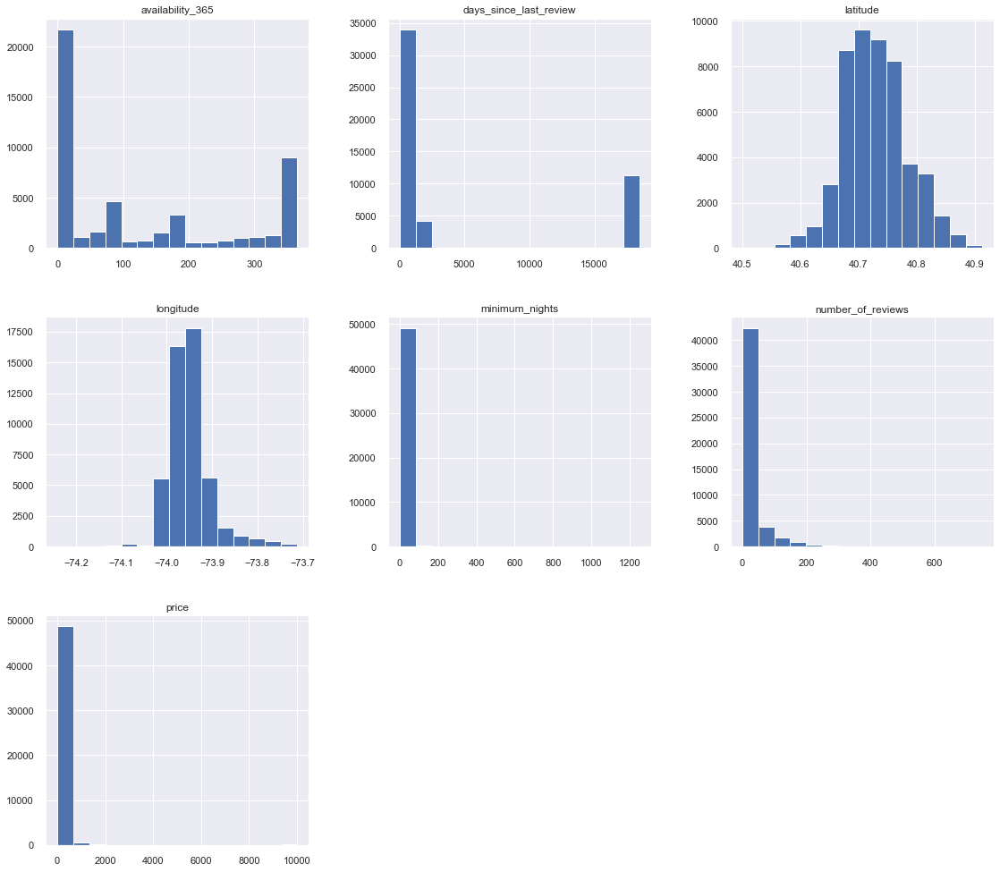

In [93]:
# plot an histogram of numerical variables
df_clean.hist(bins=15, figsize=(19,17));
sns.set()

### Examine if they are any outliers

We can see in the histograms above that the variables `days_since_last_review`, `minimum_nights`, `number_of_reviews` and `price` have outliers.

To better understand this data, let's do the following:
- Statistical summary of the variables using describe()
- Plot boxplots for the variables

In [94]:
# Statistical summary of the variables
df_clean[['availability_365','days_since_last_review','latitude','longitude','minimum_nights','number_of_reviews','price']].describe()

,availability_365,days_since_last_review,latitude,longitude,minimum_nights,number_of_reviews,price
count,49504.000000,49504.000000,49504.000000,49504.000000,49504.000000,49504.000000,49504.000000
mean,126.689621,4566.217700,40.729238,-73.951033,8.191257,23.870314,162.729295
std,142.380712,7569.010477,0.054684,0.047553,21.966500,48.246649,419.405845
min,0.000000,37.000000,40.499790,-74.240840,1.000000,0.000000,10.000000
25%,0.000000,150.000000,40.689810,-73.983360,2.000000,1.000000,68.000000
50%,79.000000,341.000000,40.723840,-73.955350,3.000000,5.000000,101.000000
75%,267.000000,1734.000000,40.762790,-73.934280,6.000000,23.000000,175.000000
max,365.000000,18459.000000,40.911690,-73.712990,1250.000000,746.000000,10000.000000


<b>Looking at this summary, we can come to some conclusions:</b><br>
- The variable `minimum_nights` at its max is way over the real limit (365 days).
- The 75% values of all of the analyzed variables are a lot lower than the max for each variable.

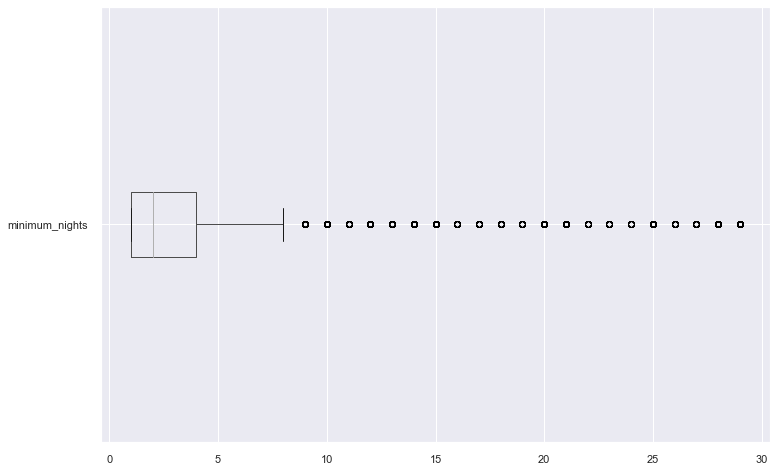

minimum nights: entries over 30:
826 entries
1.6686%


In [95]:
# boxplot for minimum_nights
fig, ax = plt.subplots()
df_clean.loc[df_clean['minimum_nights'] < 30].boxplot(['minimum_nights'], vert=False, ax=ax)
plt.show()

# check entries over 4 for reviews_per_month
print("minimum nights: entries over 30:")
print("{} entries".format(len(df_clean[df_listings.minimum_nights > 30])))
print("{:.4f}%".format((len(df_clean[df_listings.minimum_nights > 30]) / df_clean.shape[0])*100))

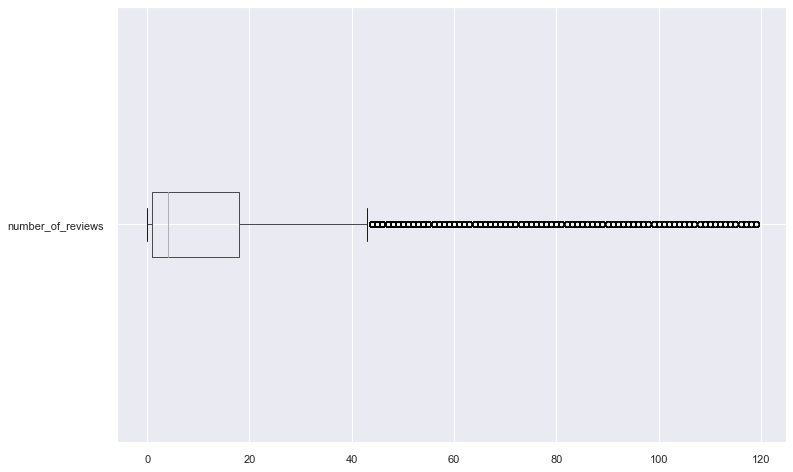

number_of_reviews: entries over 120:
2444 entries
4.9370%


In [96]:
# boxplot for number_of_reviews
fig, ax = plt.subplots()
df_clean.loc[df_clean["number_of_reviews"] < 120].boxplot(['number_of_reviews'], vert=False, ax=ax)
plt.show()

# check entries over 80 for number_of_reviews
print("number_of_reviews: entries over 120:")
print("{} entries".format(len(df_clean[df_clean.number_of_reviews > 120])))
print("{:.4f}%".format((len(df_clean[df_clean.number_of_reviews > 120]) / df_clean.shape[0])*100))

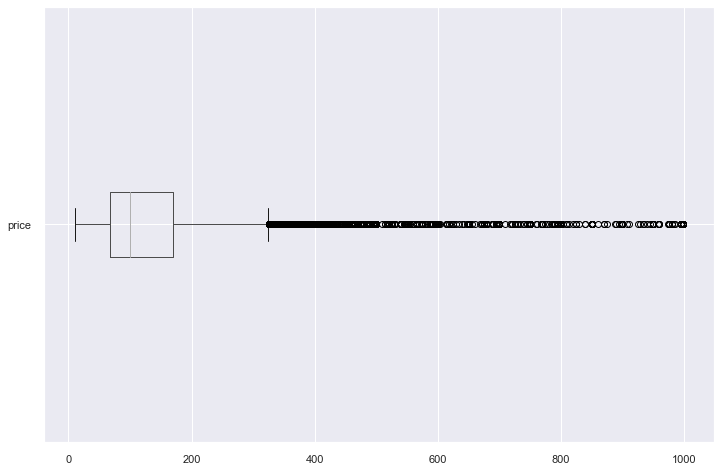

price: entries over 1000:
328 entries
0.6626%


In [97]:
# boxplot for price
fig, ax = plt.subplots()
df_clean.loc[df_clean['price'] < 1000].boxplot(['price'], vert=False, ax=ax)
plt.show()

# check entries over price over 1000
print("price: entries over 1000:")
print("{} entries".format(len(df_clean[df_clean.price > 1000])))
print("{:.4f}%".format((len(df_clean[df_clean.price > 1000]) / df_clean.shape[0])*100))

### Histograms without the outliers

Now that we have identified the outliers in our variables, let's clean the dataframe and plot histograms again.

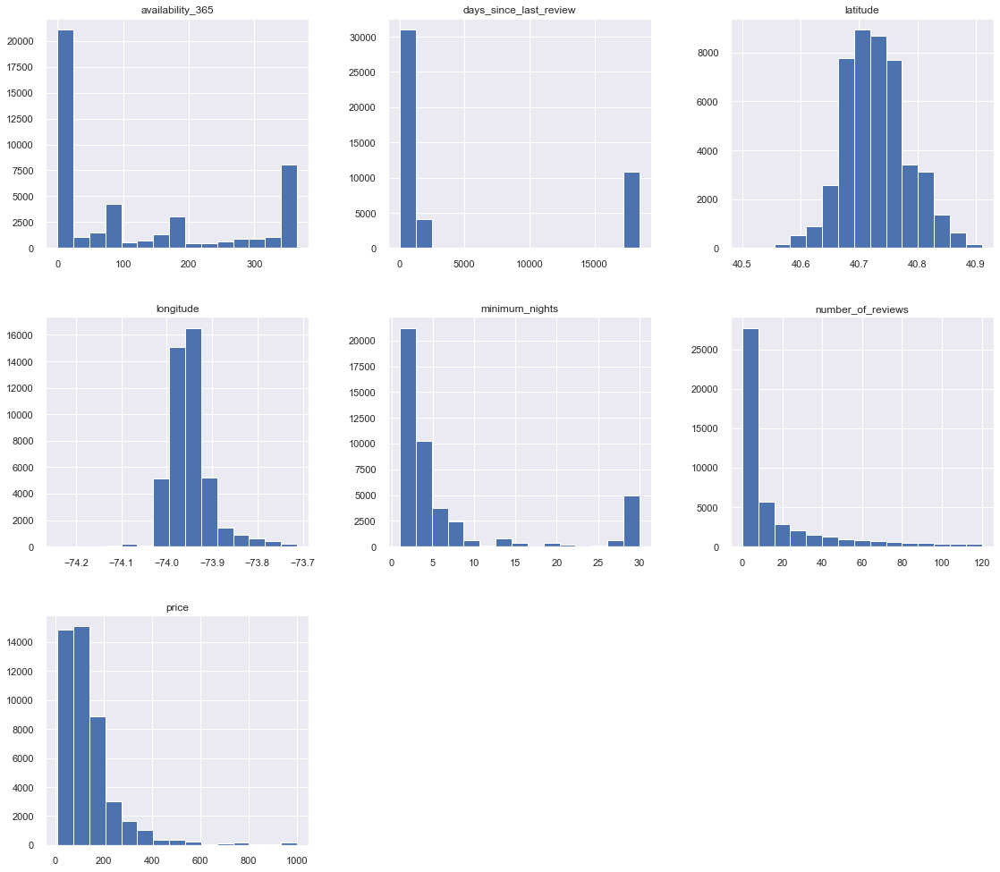

In [98]:
# removing the outliers from the DataFrame, creating a new DataFrame
df_clean = df_clean.copy()
df_clean.drop(df_clean[df_clean.minimum_nights > 30].index, axis=0, inplace=True)
df_clean.drop(df_clean[df_clean.number_of_reviews > 120].index, axis=0, inplace=True)
df_clean.drop(df_clean[df_clean.price > 1000].index, axis=0, inplace=True)

# plotting histograms for numerical values
df_clean.hist(bins=15, figsize=(19,17));
sns.set()

In [99]:
df_clean.shape

(45959, 10)

### Which is the correlation between the variables?

Correlation means there is a relationship between two things. For us, that means there is a relationship or similarity between two variables.<br>
This relationship can be measured, and the coefficient of correlation will ascertain its intensity. To identify the correlations between the variables we're interested in, let's:<br>
- Create a Correlation Matrix
- Create a heatmap from the matrix, using the seaborn library

In [100]:
# Creating a correlation matrix
corr = df_clean.corr()

# Showing the correlation matrix
display(corr)

,latitude,longitude,price,minimum_nights,number_of_reviews,availability_365,days_since_last_review
latitude,1.000000,0.076806,0.056381,0.052652,-0.025089,0.009602,0.031128
longitude,0.076806,1.000000,-0.245043,-0.110875,0.078559,0.081535,-0.059128
price,0.056381,-0.245043,1.000000,0.015337,-0.039040,0.096113,0.073034
minimum_nights,0.052652,-0.110875,0.015337,1.000000,-0.147489,0.271158,0.201483
number_of_reviews,-0.025089,0.078559,-0.039040,-0.147489,1.000000,0.171028,-0.363453
availability_365,0.009602,0.081535,0.096113,0.271158,0.171028,1.000000,-0.025338
days_since_last_review,0.031128,-0.059128,0.073034,0.201483,-0.363453,-0.025338,1.000000


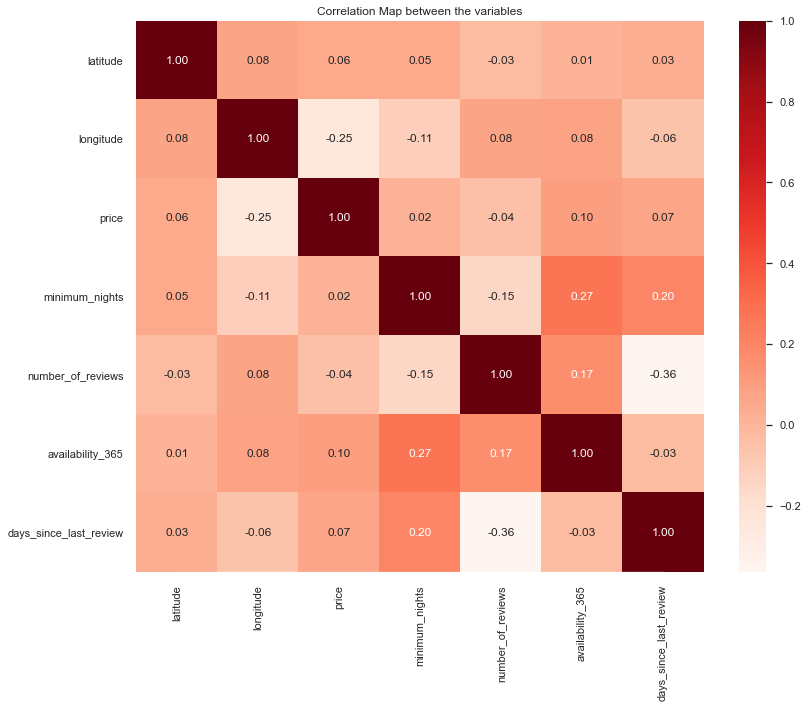

In [101]:
f, ax = plt.subplots(figsize=(12,10))
sns.heatmap(df_clean.corr(), annot=True, cmap=plt.cm.Reds, fmt=".2f")
ax.set(title='Correlation Map between the variables')
ax.xaxis.grid(False)
sns.despine(left=True,trim=True)
plt.tight_layout()
plt.show()

We can see from the above graph that currently there are no strong features that are correlated to price.

### Multicollinearity

Multicollinearity will help to measure the relationship between explanatory variables in multiple regression. If there is multicollinearity occurs, these highly related input variables should be eliminated from the model.

In this repository, multicollinearity will be control with Eigen vector values results.

In [102]:
#Eigen vector of a correlation matrix.
multicollinearity, V=np.linalg.eig(corr)
multicollinearity

array([1.56691604, 0.53590458, 0.61890302, 0.80228138, 1.01537533,
       1.17855226, 1.2820674 ])

None one of the eigenvalues of the correlation matrix is close to zero. It means that there is no multicollinearity exists in the data.

# Chapter 4. ETL & Feature Engineering

In [103]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45959 entries, 0 to 49529
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   neighbourhood_group     45959 non-null  object 
 1   neighbourhood           45959 non-null  object 
 2   latitude                45959 non-null  float64
 3   longitude               45959 non-null  float64
 4   room_type               45959 non-null  object 
 5   price                   45959 non-null  int64  
 6   minimum_nights          45959 non-null  int64  
 7   number_of_reviews       45959 non-null  int64  
 8   availability_365        45959 non-null  int64  
 9   days_since_last_review  45959 non-null  int64  
dtypes: float64(2), int64(5), object(3)
memory usage: 3.9+ MB


As we can see that there are 3 categorical variables which needs to be one-hot encoded first for regression analysis as the model wont take any categorical values.<br>

1. `neighbourhood_group` contains only 5 unique values hence it can be one-hot encoded from 0 to 4.                            
2. `neighbourhood` contains 222 unique values hence it cannot be transformed into one-hot encoding as it will create 221 more columns, but we don't have a choice because if we just transformed it into numerical values(without one-hot encoding) the reggression model will consider that a unit increase/decrease in neighbourhood will leads to some amount of increase/decrease in price, which is not a case here as these variable is categorical in nature.
3. `room_type` has only 4 unique values hence it can be one-hot encoded from 0 to 3.   

In [104]:
stations = pd.read_csv("Stations.csv")
stations.head()

,Station ID,Complex ID,GTFS Stop ID,Division,Line,Stop Name,Borough,Daytime Routes,Structure,GTFS Latitude,GTFS Longitude,North Direction Label,South Direction Label
0,1,1,R01,BMT,Astoria,Astoria - Ditmars Blvd,Q,N W,Elevated,40.775036,-73.912034,NaN,Manhattan
1,2,2,R03,BMT,Astoria,Astoria Blvd,Q,N W,Elevated,40.770258,-73.917843,Ditmars Blvd,Manhattan
2,3,3,R04,BMT,Astoria,30 Av,Q,N W,Elevated,40.766779,-73.921479,Astoria - Ditmars Blvd,Manhattan
3,4,4,R05,BMT,Astoria,Broadway,Q,N W,Elevated,40.761820,-73.925508,Astoria - Ditmars Blvd,Manhattan
4,5,5,R06,BMT,Astoria,36 Av,Q,N W,Elevated,40.756804,-73.929575,Astoria - Ditmars Blvd,Manhattan


In [105]:
print('There are ' + str(len(stations['Station ID'].unique())) + ' unique stations in our transit data set.')

There are 493 unique stations in our transit data set.


No handles with labels found to put in legend.


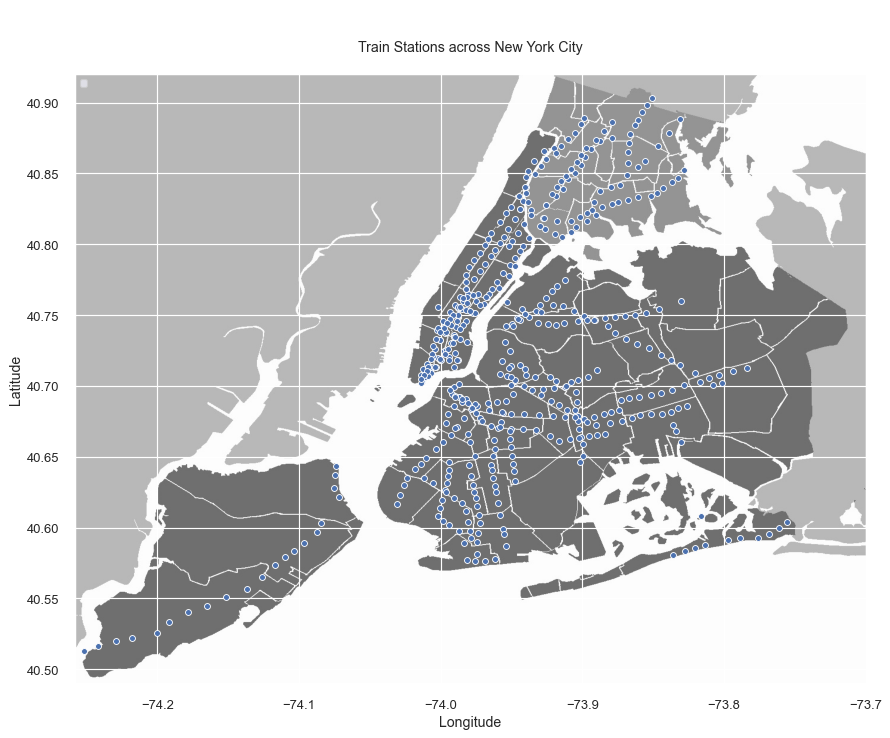

In [106]:
fig, ax = plt.subplots(figsize=(12,12),dpi=85)
img=plt.imread('NYC.png', 0)# importing the Background image
coordenates_to_extent = [-74.258, -73.7, 40.49, 40.92]
ax.imshow(img, zorder=0, extent=coordenates_to_extent)
nymap = sns.scatterplot(x='GTFS Longitude', y='GTFS Latitude', s=25, ax=ax, data=stations)
nymap.set(xlabel='Longitude', ylabel='Latitude', title='\n\nTrain Stations across New York City\n')
ax.grid(True)
plt.legend(fontsize=8, loc='upper left')
plt.show()

In [107]:
def nearest_distance(nb, transit):
  """
  The following function calculates the distance 
  of each Airbnb property to the nearest Subway Station
  """
  pass
  nb_lat, nb_long = nb[['latitude','longitude']]
  min_distance = 9999.00
  for stn_lat, stn_lng in zip(stations['GTFS Latitude'],stations['GTFS Longitude']):
    distance = geodesic((nb_lat,nb_long),(stn_lat,stn_lng)).km
    if distance < min_distance:
      min_distance = distance 
  return min_distance

In [106]:
df_clean['distance_to_station'] = df_clean.apply(nearest_distance, axis=1, transit = stations)

In [108]:
df_clean.to_csv(r'df_clean(1).csv')

In [111]:
df_clean.head()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,availability_365,price_level,days_since_last_review,distance_to_station
0,Manhattan,Washington Heights,40.85722,-73.93790,Private room,100,1,1,365,Reasonable Cost,4307,0.372054
1,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,3,48,335,Medium Cost,247,0.094983
2,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,78,0,Medium Cost,269,0.426808
3,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,29,50,365,Reasonable Cost,219,0.368138
4,Brooklyn,Sunset Park,40.66120,-73.99423,Entire home/apt,253,14,1,358,Medium Cost,2379,0.338463


We decided to add another feature to our original file which is the distance from the nearest subway train station, believing that it plays a decisive role in the price of Airbnb rental spaces. 

The subway system is the main public transportation system in New York City. The New York City Subway is one of the world's oldest public transit systems, one of the most-used and the one with the most stations. The New York City Subway is the largest rapid transit system in the world by number of stations, with 472 stations in operation (424 if stations connected by transfers are counted as single stations). The system typically operates 24/7 service, every day of the year, barring emergencies and disasters, though some routers may operate only part-time. By annual ridership, the New York Subway is the busiest rapid transit system in the Western world, as well as the ninth-busiest rapid transit rail system in the world. In 2017, the subway delivered over 1.7 billion rides, averaging approximately 5.6 million daily rides on weekdays and a combined 5.7 million rides each weekend. The system is also one of the world's longest containing 394 km of routes.

For each Airbnb listing ID file, we go through each subway stop and calculate its distance from each subway stop. Then, we store the minimum distance value in a 'distance to station' array, so that we can keep track of the minimum distance to the subway for each Airbnb listing ID. Because this exercise is computationally expensive, we choose to export our data table to a new .csv file.

Text(0, 0.5, 'Price')

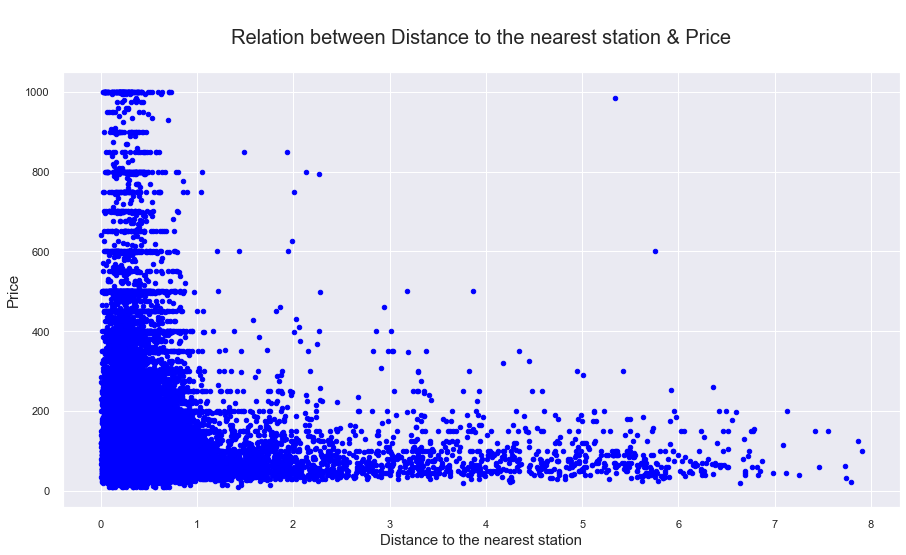

In [112]:
df_clean.plot.scatter(x="distance_to_station", y="price", figsize=(15,8), c='blue')
plt.title('\nRelation between Distance to the nearest station & Price\n', fontsize=20)
plt.xlabel('Distance to the nearest station', fontsize=15)
plt.ylabel('Price', fontsize=15)

### Skewness / Kurtosis

In [113]:
df1 = df_clean

In [114]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45959 entries, 0 to 45958
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   neighbourhood_group     45959 non-null  object 
 1   neighbourhood           45959 non-null  object 
 2   latitude                45959 non-null  float64
 3   longitude               45959 non-null  float64
 4   room_type               45959 non-null  object 
 5   price                   45959 non-null  int64  
 6   minimum_nights          45959 non-null  int64  
 7   number_of_reviews       45959 non-null  int64  
 8   availability_365        45959 non-null  int64  
 9   price_level             45959 non-null  object 
 10  days_since_last_review  45959 non-null  int64  
 11  distance_to_station     45959 non-null  float64
dtypes: float64(3), int64(5), object(4)
memory usage: 4.2+ MB


Now let's check the skewness for the important variables alone and normalize it.

<b>Skewness</b>

1. If the skewness is between -0.5 and 0.5, the data are fairly symmetrical.
2. If the skewness is between -1 and -0.5 (negatively skewed) or between 0.5 and 1 (positively skewed), the data are moderately skewed.
3. If the skewness is less than -1 (negatively skewed) or greater than 1 (positively skewed), the data are highly skewed.<br>

<b>Kurtosis</b>
1. Mesokurtic: This distribution has kurtosis statistic similar to that of the normal distribution. It means that the extreme values of the distribution are similar to that of a normal distribution characteristic. This definition is used so that the standard normal distribution has a kurtosis of three.
2. Leptokurtic (Kurtosis > 3): Distribution is longer, tails are fatter. Peak is higher and sharper than Mesokurtic, which means that data are heavy-tailed or profusion of outliers.
3. Platykurtic: (Kurtosis < 3): Distribution is shorter, tails are thinner than the normal distribution. The peak is lower and broader than Mesokurtic, which means that data are light-tailed or lack of outliers.

In [115]:
df1[['availability_365','days_since_last_review','distance_to_station','minimum_nights','number_of_reviews','price']].skew()

availability_365          0.741381
days_since_last_review    1.239384
distance_to_station       5.992169
minimum_nights            1.869446
number_of_reviews         2.189368
price                     3.165180
dtype: float64

In [116]:
df1[['availability_365','days_since_last_review','distance_to_station','minimum_nights','number_of_reviews','price']].kurtosis()

availability_365          -1.063932
days_since_last_review    -0.447322
distance_to_station       44.523554
minimum_nights             1.885093
number_of_reviews          4.385984
price                     14.730596
dtype: float64

### Distribution plots of features before normalization using logarithmic transformation.

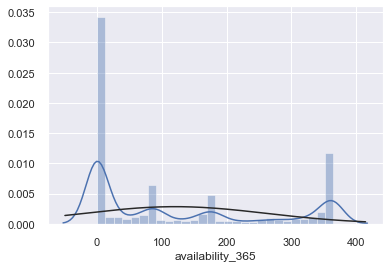

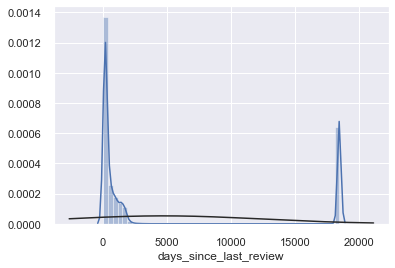

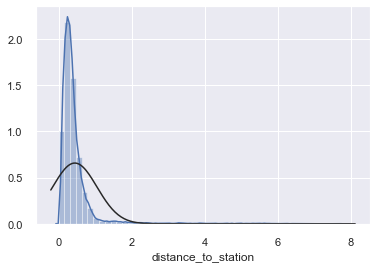

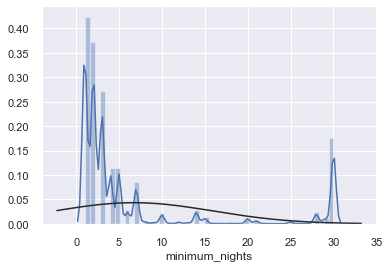

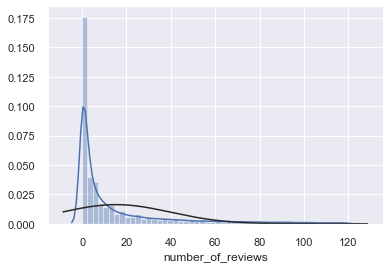

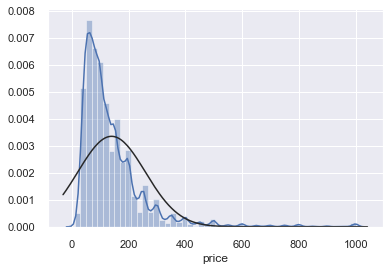

In [117]:
from scipy.stats import norm
import statsmodels.api as sm
import scipy.stats as stats

for col in ['availability_365','days_since_last_review','distance_to_station','minimum_nights','number_of_reviews','price']:
    fig = plt.figure(figsize = (6,4))
    sns.distplot(df1[col], fit=norm);
    plt.xlabel(col)
    plt.show()

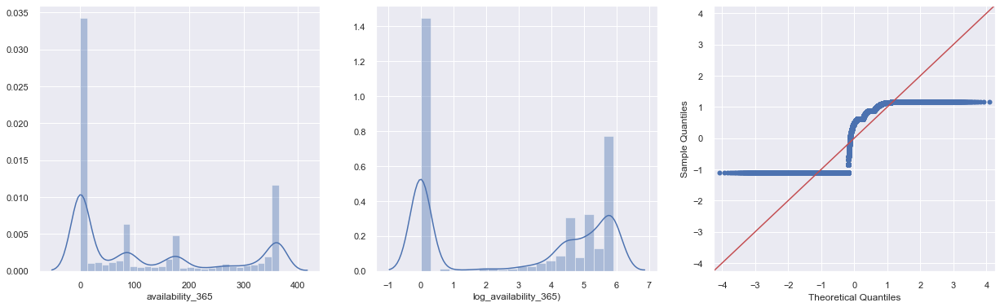

In [118]:
# Analyze the 'availability_365'
fig, axes = plt.subplots(1,3, figsize=(21,6))
sns.distplot(df1['availability_365'], ax=axes[0])
# Use np.lop1p function
sns.distplot(np.log1p(df1['availability_365']), ax=axes[1])
axes[1].set_xlabel('log_availability_365)')
sm.qqplot(np.log1p(df1['availability_365']), # data
          stats.norm, #normalized distribution
          fit=True, # Try to fit
          line='45',
          ax=axes[2]);

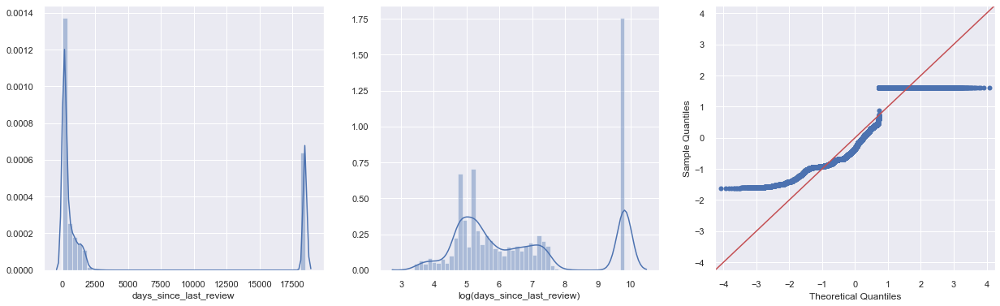

In [119]:
# Analyze the 'days_since_last_review'
fig, axes = plt.subplots(1,3, figsize=(21,6))
sns.distplot(df1['days_since_last_review'], ax=axes[0])
# Use np.lop1p function
sns.distplot(np.log1p(df1['days_since_last_review']), ax=axes[1])
axes[1].set_xlabel('log(days_since_last_review)')
sm.qqplot(np.log1p(df1['days_since_last_review']), # data
          stats.norm, #normalized distribution
          fit=True, # Try to fit
          line='45',
          ax=axes[2]);

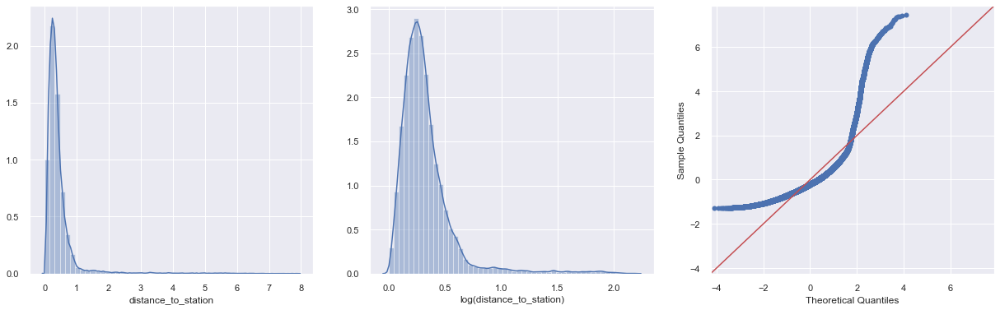

In [120]:
# Analyze the 'distance_to_station'
fig, axes = plt.subplots(1,3, figsize=(21,6))
sns.distplot(df1['distance_to_station'], ax=axes[0])
# Use np.lop1p function
sns.distplot(np.log1p(df1['distance_to_station']), ax=axes[1])
axes[1].set_xlabel('log(distance_to_station)')
sm.qqplot(np.log1p(df1['distance_to_station']), # data
          stats.norm, #normalized distribution
          fit=True, # Try to fit
          line='45',
          ax=axes[2]);

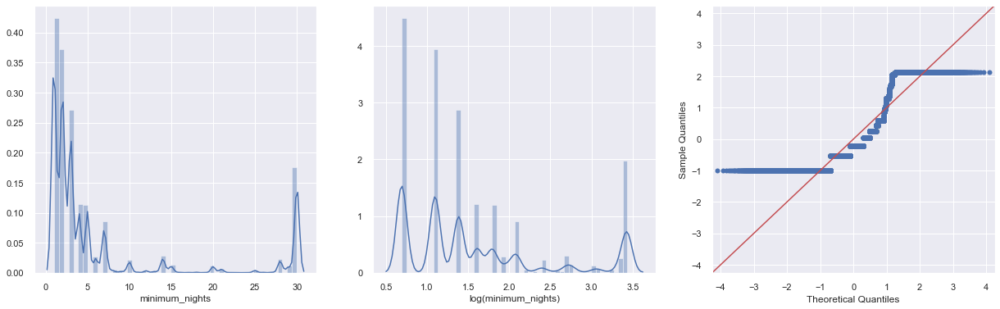

In [121]:
# Analyze the 'minimum_night'
fig, axes = plt.subplots(1,3, figsize=(21,6))
sns.distplot(df1['minimum_nights'], ax=axes[0])
# Use np.lop1p function
sns.distplot(np.log1p(df1['minimum_nights']), ax=axes[1])
axes[1].set_xlabel('log(minimum_nights)')
sm.qqplot(np.log1p(df1['minimum_nights']), # data
          stats.norm, #normalized distribution
          fit=True, # Try to fit
          line='45',
          ax=axes[2]);

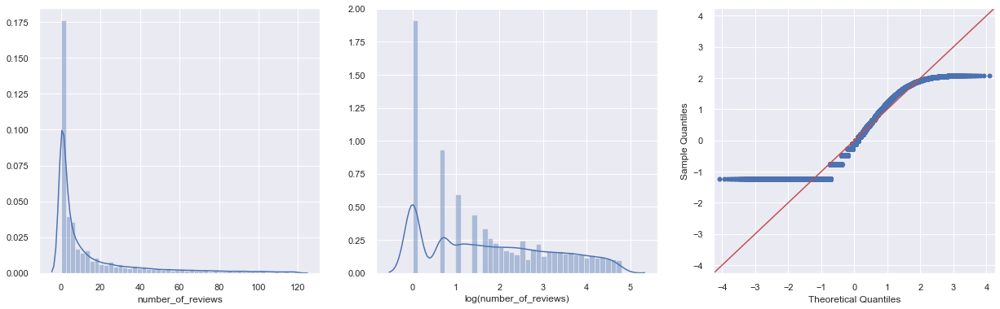

In [122]:
# Analyze the 'number_of_reviews'
fig, axes = plt.subplots(1,3, figsize=(21,6))
sns.distplot(df1['number_of_reviews'], ax=axes[0])
# Use np.lop1p function
sns.distplot(np.log1p(df1['number_of_reviews']), ax=axes[1])
axes[1].set_xlabel('log(number_of_reviews)')
sm.qqplot(np.log1p(df1['number_of_reviews']), # data
          stats.norm, #normalized distribution
          fit=True, # Try to fit
          line='45',
          ax=axes[2]);

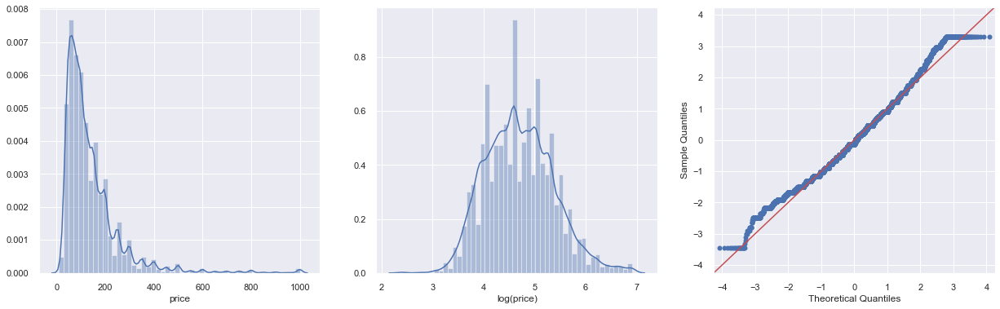

In [123]:
# Analyze the 'price'
fig, axes = plt.subplots(1,3, figsize=(21,6))
sns.distplot(df1['price'], ax=axes[0])
# Use np.lop1p function
sns.distplot(np.log1p(df1['price']), ax=axes[1])
axes[1].set_xlabel('log(price)')
sm.qqplot(np.log1p(df1['price']), # data
          stats.norm, #normalized distribution
          fit=True, # Try to fit
          line='45',
          ax=axes[2]);

In [124]:
# Applying log transformation
df1['log_availability_365'] = np.log1p(df1['availability_365'])
df1['log_days_since_last_review'] = np.log1p(df1['days_since_last_review'])
df1['log_distance_to_station'] = np.log1p(df1['distance_to_station'])
df1['log_minimum_nights'] = np.log1p(df1['minimum_nights'])
df1['log_number_of_reviews'] = np.log1p(df1['number_of_reviews'])
df1['log_price'] = np.log1p(df1['price'])

### Distribution plots of features after normalization using logrithmic transformation.

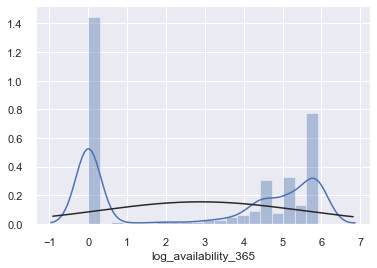

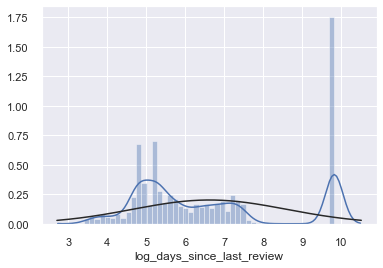

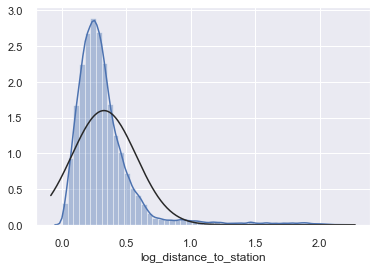

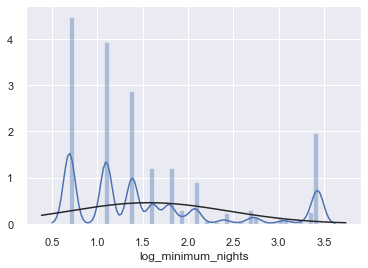

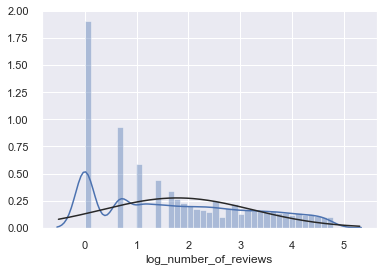

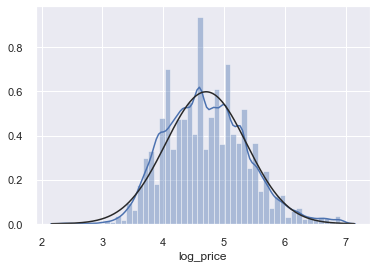

In [125]:
for col in ['log_availability_365','log_days_since_last_review','log_distance_to_station','log_minimum_nights','log_number_of_reviews','log_price']:
    fig = plt.figure(figsize = (6,4))
    sns.distplot(df1[col], fit=norm);
    plt.xlabel(col)
    plt.show()

To deal with the outliers we will be using robust scaler (after the test train split) as it will nullify the effect of it.

In [126]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45959 entries, 0 to 45958
Data columns (total 18 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   neighbourhood_group         45959 non-null  object 
 1   neighbourhood               45959 non-null  object 
 2   latitude                    45959 non-null  float64
 3   longitude                   45959 non-null  float64
 4   room_type                   45959 non-null  object 
 5   price                       45959 non-null  int64  
 6   minimum_nights              45959 non-null  int64  
 7   number_of_reviews           45959 non-null  int64  
 8   availability_365            45959 non-null  int64  
 9   price_level                 45959 non-null  object 
 10  days_since_last_review      45959 non-null  int64  
 11  distance_to_station         45959 non-null  float64
 12  log_availability_365        45959 non-null  float64
 13  log_days_since_last_review  459

# Chapter 5. Data Partitioning

In [127]:
import sklearn as sk
import xgboost as xgb
import lightgbm as lgb

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso, LassoCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import RobustScaler

In [128]:
df = df1.drop(['availability_365','days_since_last_review','distance_to_station','minimum_nights','number_of_reviews','price','price_level'], axis=1)

In [129]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45959 entries, 0 to 45958
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   neighbourhood_group         45959 non-null  object 
 1   neighbourhood               45959 non-null  object 
 2   latitude                    45959 non-null  float64
 3   longitude                   45959 non-null  float64
 4   room_type                   45959 non-null  object 
 5   log_availability_365        45959 non-null  float64
 6   log_days_since_last_review  45959 non-null  float64
 7   log_distance_to_station     45959 non-null  float64
 8   log_minimum_nights          45959 non-null  float64
 9   log_number_of_reviews       45959 non-null  float64
 10  log_price                   45959 non-null  float64
dtypes: float64(8), object(3)
memory usage: 3.9+ MB


As we can see, there are 3 categorical variables which needs to be one-hot encoded first for regression analysis as the model won't take any categorical values.<br>

1. `neighbourhood_group` contains only 5 unique values hence it can be one-hot encoded from 0 to 4.<br>                            
2. `neighbourhood` contains 222 unique values hence it cannot be transformed into one-hot encoding as it will create 222 more columns, but we don't have a choice because if we just transformed it into numerical values (without one-hot encoding) the reggression model will consider that a unit increase/decrease in neighbourhood will leads to some amount of increase/decrease in price, which is not a case here as these variable is categorical in nature.<br>

3. `room_type` has only 3 unique values hence it can be one-hot encoded from 0 to 2<br>

In [130]:
df_neighbourhood_group = pd.get_dummies(df['neighbourhood_group'])
df_neighbourhood = pd.get_dummies(df['neighbourhood'])
df_room = pd.get_dummies(df['room_type'])
df_combined = pd.concat([df, df_neighbourhood_group, df_neighbourhood, df_room],axis = 1)

In [131]:
df_combined.drop(['neighbourhood_group','neighbourhood','room_type'], axis=1, inplace = True)

In [132]:
df_combined.shape

(45959, 238)

In [133]:
X=df_combined.drop(['log_price'],axis=1)
y=df_combined['log_price']

In [134]:
print(X.shape,y.shape)

(45959, 237) (45959,)


In [135]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=10)

In [136]:
print(X_train.shape,y_train.shape)

(34469, 237) (34469,)


In [137]:
print(X_test.shape,y_test.shape)

(11490, 237) (11490,)


### Feature Scaling

There are various methods of scaling such as MinMaxScaling, StandardScaler, Normalizer, MaxAbsScaler and RobustScaler.<br>
In our project we will be using RobustScaler as we need to nullify the effect of outliers even after logrithmic transformation. 

In [138]:
from sklearn.preprocessing import RobustScaler
scale= RobustScaler()
X_train_sc=scale.fit_transform(X_train)
X_test_sc=scale.transform(X_test)

In [139]:
print(X_train_sc.shape,X_test_sc.shape)

(34469, 237) (11490, 237)


In [140]:
X.head()

,latitude,longitude,log_availability_365,log_days_since_last_review,log_distance_to_station,log_minimum_nights,log_number_of_reviews,Bronx,Brooklyn,Manhattan,...,Willowbrook,Windsor Terrace,Woodhaven,Woodlawn,Woodrow,Woodside,Entire home/apt,Hotel room,Private room,Shared room
0,40.85722,-73.93790,5.902633,8.368229,0.316309,0.693147,0.693147,0,0,1,...,0,0,0,0,0,0,0,0,1,0
1,40.75362,-73.98377,5.817111,5.513429,0.090739,1.386294,3.891820,0,0,1,...,0,0,0,0,0,0,1,0,0,0
2,40.74767,-73.97500,0.000000,5.598422,0.355440,1.386294,4.369448,0,0,1,...,0,0,0,0,0,0,1,0,0,0
3,40.68688,-73.95596,5.902633,5.393628,0.313451,3.401197,3.931826,0,1,0,...,0,0,0,0,0,0,0,0,1,0
4,40.66120,-73.99423,5.883322,7.774856,0.291522,2.708050,0.693147,0,1,0,...,0,0,0,0,0,0,1,0,0,0


In [141]:
print(X_train_sc.shape,X_test_sc.shape)

(34469, 237) (11490, 237)


# Chapter 6. Data Modelling

### Model Evaluation strategy (Metrics Selection) :

Mean Absolute Error (MAE) and Root mean squared error (RMSE) are two of the most common metrics used to measure accuracy for continuous variables.</br>

<b>Mean Absolute Error (MAE):</b> MAE measures the average magnitude of the errors in a set of predictions, without considering their direction. It’s the average over the test sample of the absolute differences between prediction and actual observation where all individual differences have equal weight.</br>

<b>Root mean squared error (RMSE):</b> RMSE is a quadratic scoring rule that also measures the average magnitude of the error. It’s the square root of the average of squared differences between prediction and actual observation.</br>

<b>Comparison</b>
- <b>Similarities:</b> Both MAE and RMSE express average model prediction error in units of the variable of interest. Both metrics can range from 0 to ∞ and are indifferent to the direction of errors. They are negatively-oriented scores, which means lower values are better.
- <b>Differences:</b> Taking the square root of the average squared errors has some interesting implications for RMSE. Since the errors are squared before they are averaged, the RMSE gives a relatively high weight to large errors. RMSE does not necessarily increase with the variance of the errors. RMSE increases with the variance of the frequency distribution of error magnitudes.

<b>R2 score:</b>
The R2 score also known as the coefficient of determination measures the amount of variance of the predictive model. 

<b>Training Error:</b> Training error is the error that we get when we run the trained model back on the training data. Remember that this data has already been used to train the model and this necessarily doesn't mean that the model once trained will accurately perform when applied back on the training data itself.

<b>Test Error:</b> Test error is the error that we get when we run the trained model on a set of data that it has previously never been exposed to. This data is often used to measure the accuracy of the model before it is shipped to production.



## BASELINE MODELS

The three baseline models are Linear Regression, Ridge Regression, and Lasso Regression. We score each baseline model on both R^2 and MAE (median absolute error) to evaluate them, and average the scores from 5-fold cross validation.

## Model 1. Linear Regression

Since our target variable, the rental price, is a continuous variable, we consider this problem as a supervised regression problem instead of classification. Thus, the baseline model is the default linear regression.

In [162]:
# linear regression
linear_model=LinearRegression(fit_intercept=True)
linear_model.fit(X_train_sc,y_train)
y_pred_linear=linear_model.predict(X_test_sc)
score=100.0 * linear_model.score(X_test_sc,y_test)
print(f'Linear Regression Model score = {score:5.2f}%')

Linear Regression Model score = 55.39%


In [163]:
y_train_linear = linear_model.predict(X_train_sc)
y_pred_linear = linear_model.predict(X_test_sc)
training_error = mean_squared_error(y_train, y_train_linear)
mse = mean_squared_error(y_test, y_pred_linear)
print(f'Training MSE   = {training_error:4.2%}')
print(f'Testing MSE    = {mse:4.2%}')

Training MSE   = 20.17%
Testing MSE    = 19.53%


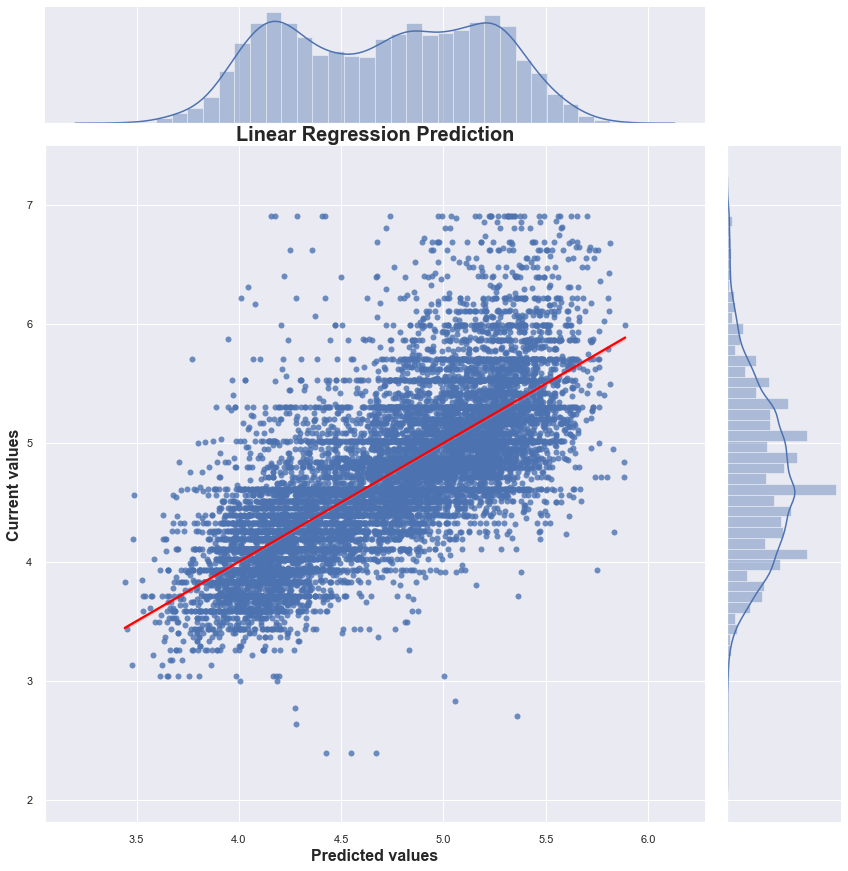

In [164]:
# Visualization predictions vs test log_price
sns.jointplot(y_pred_linear,y_test,kind='reg',height=12,joint_kws={'line_kws':{'color':'red'}})
plt.xlabel('Predicted values',fontsize=16,weight='bold')
plt.ylabel('Current values', fontsize=16,weight='bold')
plt.title('Linear Regression Prediction',fontsize=20, weight='bold')
plt.show()

In [165]:
# Display of actual values with predicted values in test data
error_linear = pd.DataFrame({
        'Actual values': np.array(np.exp(y_test)).flatten(),
        'Predicted values': np.round(np.exp(y_pred_linear).flatten()),
        'Difference (%)': 100 * np.round((np.exp(y_pred_linear)-np.array(np.exp(y_test)))/np.exp(y_pred_linear),2)})
error_linear.head(10)

,Actual values,Predicted values,Difference (%)
0,171.0,209.0,18.0
1,46.0,56.0,18.0
2,421.0,157.0,-168.0
3,81.0,101.0,20.0
4,141.0,183.0,23.0
5,46.0,69.0,33.0
6,101.0,115.0,12.0
7,126.0,130.0,3.0
8,117.0,128.0,9.0
9,143.0,179.0,20.0


In [166]:
y_train_linear=linear_model.predict(X_train_sc)
y_pred_linear=linear_model.predict(X_test_sc)
linear_best_results = pd.DataFrame({'model':['Linear Regression'],
                                    'MAE': [mean_absolute_error(y_test, y_pred_linear)],
                                    'RMSE': [np.sqrt(mean_squared_error(y_test, y_pred_linear))], 
                                    'Training R2 Score': [r2_score(y_train, y_train_linear)],                                    
                                    'Training Error': [mean_squared_error(y_train, y_train_linear)],
                                    'Test R2 Score': [r2_score(y_test, y_pred_linear)],
                                    'Test Error': [mean_squared_error(y_test, y_pred_linear)]})
pd.options.display.float_format = '{:.2%}'.format
linear_best_results

,model,MAE,RMSE,Training R2 Score,Training Error,Test R2 Score,Test Error
0,Linear Regression,33.12%,44.19%,54.91%,20.17%,55.39%,19.53%


## Model 2. Ridge Regression


However, a clearly linear regression is always too oversimplified for reality problem because it assumes the covariates and response variables to have linear relationship which may not suit our problem. To improve this, we also use another linear model, the Ridge Regression model with sklearn.linear_model.Ridge. This solves a regression model where the loss function is the linear least squares function and regularization is given by the l2-norm. To find the optimal parameters and avoid overfitting, we also compare the performance of model with alphas=[0.001,0.01,0.1,1,10] as well as cross validation by RidgeCV.

In Ridge regression, the cost function is altered by adding a penalty equivalent to square of the magnitude of the coefficients. So Ridge regression puts constraint on the coefficients. The penalty term (lambda) regularizes the coefficients such that if the coefficients take large values the optimization function is penalized. So, Ridge regression shrinks the coefficients and it helps to reduce the model complexity and multi-collinearity.

In [167]:
# Run the model before tuning the hyperparameter
ridge_model = Ridge()
ridge_model.fit(X_train_sc, y_train)
y_pred_ridge = ridge_model.predict(X_test_sc)
print('Score = {:.2%}'.format(ridge_model.score(X_test_sc,y_test)))

Score = 55.45%


In [168]:
# Setup the hyperparameter grid
parameter_space = {
    "alpha": [0.001,0.01,0.1,1,10],
    "fit_intercept": [True, False],
    "solver": ['svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga'],
}

ridge_cv = GridSearchCV(Ridge(random_state=10), parameter_space, n_jobs=-1, cv=5)

ridge_cv.fit(X_train_sc, y_train)
print("Best parameters:")
print(ridge_cv.best_params_)

Best parameters:
{'alpha': 10, 'fit_intercept': True, 'solver': 'cholesky'}


From this analysis we can see, a medium alpha value is best, indicating that a considerable penalty term should be included to reduce the over-fitting issue of the model.

Ridge Regreesion using the hyperparameter above.

In [169]:
ridge_model_best = Ridge(random_state=10, **ridge_cv.best_params_)
ridge_model_best.fit(X_train_sc, y_train)
y_pred_ridge = ridge_model_best.predict(X_test_sc)
ridge_mae = mean_absolute_error(y_test, y_pred_ridge)
print('Score = {:.2%}'.format(ridge_model_best.score(X_test_sc,y_test)))

Score = 55.44%


In [170]:
y_train_ridge = ridge_model_best.predict(X_train_sc)
y_pred_ridge = ridge_model_best.predict(X_test_sc)
ridge_best_results = pd.DataFrame({'model':['Ridge Regression'],
                                   'MAE': [mean_absolute_error(y_test, y_pred_ridge)],
                                   'RMSE': [np.sqrt(mean_squared_error(y_test, y_pred_ridge))],   
                                   'Training R2 Score': [r2_score(y_train, y_train_ridge)],                                   
                                   'Training Error': [mean_squared_error(y_train, y_train_ridge)],
                                   'Test R2 Score': [r2_score(y_test, y_pred_ridge)],
                                   'Test Error': [mean_squared_error(y_test, y_pred_ridge)]})
pd.options.display.float_format = '{:.2%}'.format
ridge_best_results

,model,MAE,RMSE,Training R2 Score,Training Error,Test R2 Score,Test Error
0,Ridge Regression,33.12%,44.17%,54.69%,20.27%,55.44%,19.51%


However, from the result showed above, there are very small difference between the scores of the linear model. Therefore, we decide to make no change to the model.

## Model 3. Lasso Regression

In [171]:
# try to figure out the best alpha value of lasso
lassocv=LassoCV(eps=0.00001, n_alphas=100, alphas=None)
lassocv.fit(X_train_sc,y_train)
# the penalty term chosen by the CV
lassocv.alpha_

2.3853771377184763e-05

Lasso Regression using the hyperparameter above, which is small, indicating no need for adding the penalty term.

In [172]:
# lasso regression can exclude useless variable from models, good when there are lots of bad variables  
lasso_model_best=Lasso(alpha=lassocv.alpha_)
lasso_model_best.fit(X_train_sc,y_train)
lasso_score=lasso_model_best.score(X_test_sc,y_test)
lasso_coef=lasso_model_best.coef_
print('Score = {:.2%}'.format(lasso_model_best.score(X_test_sc,y_test)))

Score = 55.47%


In [173]:
y_train_lasso= lasso_model_best.predict(X_train_sc)
y_pred_lasso= lasso_model_best.predict(X_test_sc)
lasso_best_results = pd.DataFrame({'model':['Lasso Regression'],
                                   'MAE': [mean_absolute_error(y_test, y_pred_lasso)],
                                   'RMSE': [np.sqrt(mean_squared_error(y_test, y_pred_lasso))],  
                                   'Training R2 Score': [r2_score(y_train, y_train_lasso)],
                                   'Training Error': [mean_squared_error(y_train, y_train_lasso)],
                                   'Test R2 Score': [r2_score(y_test, y_pred_lasso)],
                                   'Test Error': [mean_squared_error(y_test, y_pred_lasso)]})
pd.options.display.float_format = '{:.2%}'.format
lasso_best_results

,model,MAE,RMSE,Training R2 Score,Training Error,Test R2 Score,Test Error
0,Lasso Regression,33.11%,44.15%,54.82%,20.21%,55.47%,19.49%


The results from the Lasso regression model are similar to the ones from Linear regression and Ridge regression.

## Comparison of baseline models

In [174]:
#combined scores of above model's best results
df_comparison = pd.concat([linear_best_results,ridge_best_results,lasso_best_results], axis=0, ignore_index=True)
df_comparison

,model,MAE,RMSE,Training R2 Score,Training Error,Test R2 Score,Test Error
0,Linear Regression,33.12%,44.19%,54.91%,20.17%,55.39%,19.53%
1,Ridge Regression,33.12%,44.17%,54.69%,20.27%,55.44%,19.51%
2,Lasso Regression,33.11%,44.15%,54.82%,20.21%,55.47%,19.49%


The results from the Lasso regression model are similar to the ones from Linear Regression model and Ridge Regression model. From the comparison table, we can see that Lasso Regression model based on selected features could explain approximately 55.5% of the variation of price. We must notice that the difference between the baseline models are barely visible.

Next, we will explore ensemble models.

## ENSEMBLE MODELS

## Model 4. Decision Tree Regression

In [175]:
# Decision Tree Regression (Default Parameters)
dtree_model = DecisionTreeRegressor(random_state=10)
dtree_model.fit(X_train_sc, y_train)
y_pred = dtree_model.predict(X_test)
print('Score = {:.2%}'.format(dtree_model.score(X_test_sc,y_test)))

Score = 18.84%


In [176]:
y_train_dtree = dtree_model.predict(X_train_sc)
y_pred_dtree = dtree_model.predict(X_test_sc)
training_error = mean_squared_error(y_train, y_train_dtree)
mse = mean_squared_error(y_test, y_pred_dtree)
print(f'Training MSE   = {training_error:4.2%}')
print(f'Testing MSE    = {mse:4.2%}')

Training MSE   = 0.00%
Testing MSE    = 35.52%


In [177]:
# Setup the hyperparameter grid
para_test1={'max_depth':range(4,16,2)}
dtree=GridSearchCV(DecisionTreeRegressor(random_state=10),param_grid=para_test1, cv=5,n_jobs=-1)
dtree.fit(X_train_sc, y_train)
dtree.best_params_, dtree.best_score_

({'max_depth': 8}, 0.5264021676585365)

In [178]:
# Best Decision Tree Regressor
dtree_model_best=DecisionTreeRegressor(random_state=10, max_depth=8)
dtree_model_best.fit(X_train_sc,y_train)
y_pred_best_dtree = dtree_model_best.predict(X_test_sc)
print('Score = {:.2%}'.format(dtree_model_best.score(X_test_sc,y_test)))

Score = 54.92%


In [179]:
y_train_dtree = dtree_model_best.predict(X_train_sc)
y_pred_dtree = dtree_model_best.predict(X_test_sc)
training_error = mean_squared_error(y_train, y_train_dtree)
mse = mean_squared_error(y_test, y_pred_dtree)
print(f'Training MSE   = {training_error:4.2%}')
print(f'Testing MSE    = {mse:4.2%}')

Training MSE   = 18.87%
Testing MSE    = 19.73%


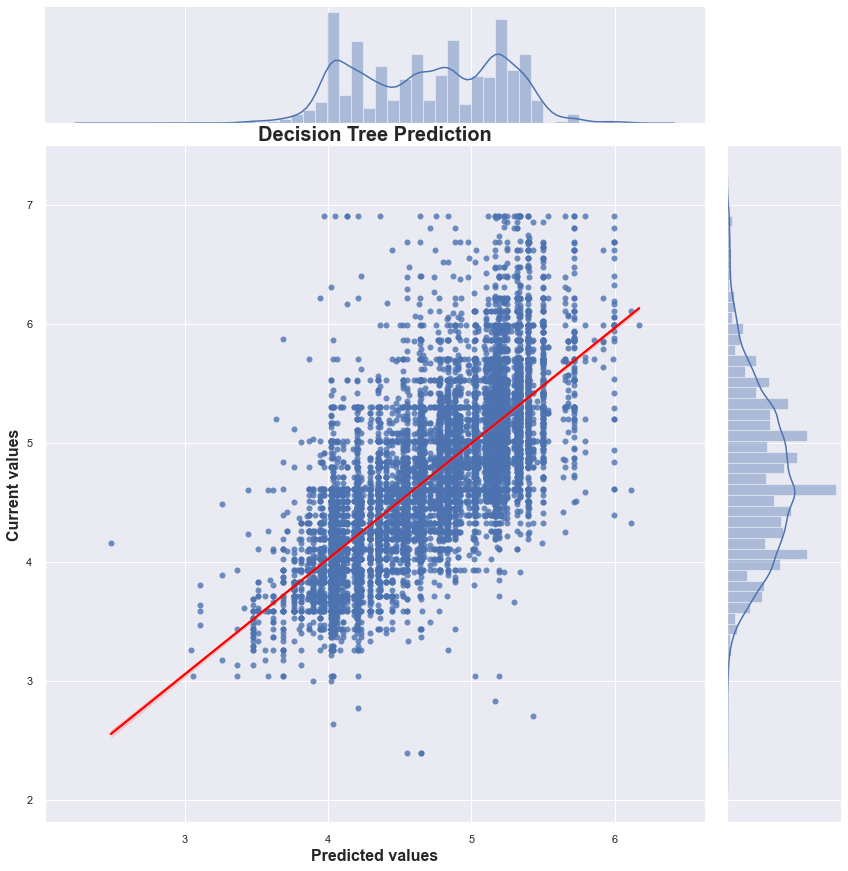

In [180]:
# Visualization predictions vs test log_price
sns.jointplot(y_pred_dtree,y_test,kind='reg',height=12,joint_kws={'line_kws':{'color':'red'}})
plt.xlabel('Predicted values',fontsize=16,weight='bold')
plt.ylabel('Current values', fontsize=16,weight='bold')
plt.title('Decision Tree Prediction',fontsize=20, weight='bold')
plt.show()

In [181]:
y_train_dtree = dtree_model_best.predict(X_train_sc)
y_pred_dtree = dtree_model_best.predict(X_test_sc)
dtree_best_results = pd.DataFrame({'model':['Decision Tree Regression'],
                                   'MAE': [mean_absolute_error(y_test, y_pred_dtree)],
                                   'RMSE': [np.sqrt(mean_squared_error(y_test, y_pred_dtree))],
                                   'Training R2 Score': [r2_score(y_train, y_train_dtree)],
                                   'Training Error': [mean_squared_error(y_train, y_train_dtree)],
                                   'Test R2 Score': [r2_score(y_test, y_pred_dtree)],                             
                                   'Test Error': [mean_squared_error(y_test, y_pred_dtree)]})
pd.options.display.float_format = '{:.2%}'.format
dtree_best_results

,model,MAE,RMSE,Training R2 Score,Training Error,Test R2 Score,Test Error
0,Decision Tree Regression,33.07%,44.42%,57.82%,18.87%,54.92%,19.73%


## Model 5. KNN Regression

In [182]:
# KNN Regression (Defalut Parameters)
knn_model=KNeighborsRegressor()
knn_model.fit(X_train_sc,y_train)
print('Score = {:.2%}'.format(knn_model.score(X_test_sc,y_test)))

Score = 52.15%


In [183]:
y_train_knn = knn_model.predict(X_train_sc)
y_pred_knn = knn_model.predict(X_test_sc)
training_error = mean_squared_error(y_train, y_train_knn)
mse = mean_squared_error(y_test, y_pred_knn)
print(f'Training MSE   = {training_error:4.2%}')
print(f'Testing MSE    = {mse:4.2%}')

Training MSE   = 14.61%
Testing MSE    = 20.95%


In [184]:
# Setup the hyperparameter grid
params = {'n_neighbors': range(15,25)}
knn_model=GridSearchCV(KNeighborsRegressor(), params, scoring='r2', cv=5)
knn_model.fit(X_train_sc, y_train)
knn_model.best_params_, knn_model.best_score_

({'n_neighbors': 22}, 0.5314748293859723)

In [185]:
# Best KNN Regressor
best_knn=KNeighborsRegressor(n_neighbors=22, n_jobs=-1)
best_knn.fit(X_train_sc,y_train)
y_pred_best_knn = best_knn.predict(X_test_sc)
print('Score = {:.2%}'.format(best_knn.score(X_test_sc,y_test)))

Score = 54.75%


In [186]:
y_train_knn = best_knn.predict(X_train_sc)
y_pred_knn = best_knn.predict(X_test_sc)
training_error = mean_squared_error(y_train, y_train_knn)
mse = mean_squared_error(y_test, y_pred_knn)
print(f'Training MSE   = {training_error:4.2%}')
print(f'Testing MSE    = {mse:4.2%}')

Training MSE   = 18.93%
Testing MSE    = 19.81%


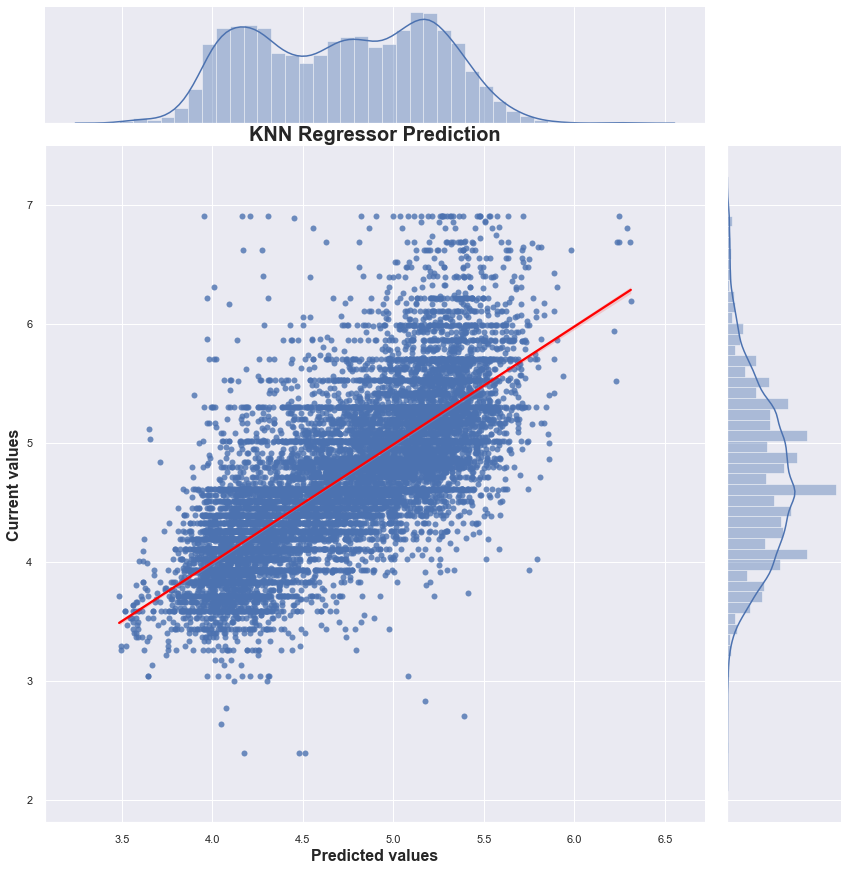

In [187]:
# Visualization predictions vs test log_price
sns.jointplot(y_pred_knn,y_test,kind='reg',height=12,joint_kws={'line_kws':{'color':'red'}})
plt.xlabel('Predicted values',fontsize=16,weight='bold')
plt.ylabel('Current values', fontsize=16,weight='bold')
plt.title('KNN Regressor Prediction',fontsize=20, weight='bold')
plt.show()

In [188]:
y_train_knn = best_knn.predict(X_train_sc)
y_pred_knn = best_knn.predict(X_test_sc)
knn_best_results = pd.DataFrame({'model':['KNN Regression'],
                                 'MAE': [mean_absolute_error(y_test, y_pred_knn)],
                                 'RMSE': [np.sqrt(mean_squared_error(y_test, y_pred_knn))],
                                 'Training R2 Score': [r2_score(y_train, y_train_knn)],
                                 'Training Error': [mean_squared_error(y_train, y_train_knn)],
                                 'Test R2 Score': [r2_score(y_test, y_pred_knn)],                             
                                 'Test Error': [mean_squared_error(y_test, y_pred_knn)]})
pd.options.display.float_format = '{:.2%}'.format
knn_best_results

,model,MAE,RMSE,Training R2 Score,Training Error,Test R2 Score,Test Error
0,KNN Regression,33.35%,44.50%,57.67%,18.93%,54.75%,19.81%


The KNN algorithm doesn't work well with high dimensional data. With large number of dimensions, it becomes difficult for the algorithm to calculate distance in each dimension. The KNN algorithm has a high prediction cost for large datasets. This is because in large datasets the cost of calculating distance between new point and each existing point becomes higher. Finally, the KNN algorithm doesn't work well with categorical features since it is difficult to find the distance between dimensions with categorical features.

## Model 6. Random Forest Regression

In [189]:
# Random Forest Regression (Defalut Parameters)
rf_model=RandomForestRegressor(random_state=10)
rf_model=rf_model.fit(X_train_sc,y_train)
print('Score = {:.2%}'.format(rf_model.score(X_test_sc,y_test)))

Score = 59.54%


In [190]:
y_train_rf = rf_model.predict(X_train_sc)
y_pred_rf = rf_model.predict(X_test_sc)
training_error = mean_squared_error(y_train, y_train_rf)
mse = mean_squared_error(y_test, y_pred_rf)
print(f'Training MSE   = {training_error:4.2%}')
print(f'Testing MSE    = {mse:4.2%}')

Training MSE   = 2.67%
Testing MSE    = 17.71%


The default Random Forest Regression Model gives a score of 59.54%. But notice Training MSE is significantly smaller than Testing MSE, which indicates that there is an over-fitting problem. To solve the over-fitting problem, we need to cut down features of less importance and apply cross-validation.

In [191]:
# Feature importance
df_fi = pd.DataFrame(zip(X, rf_model.feature_importances_),columns = ['Feature','Feature Importance'])
df_fi.sort_values(['Feature Importance'], ascending = False, inplace=True)
df_fi.reset_index(inplace = True,drop = True)
print("\nTop fifteen features by importance:")
df_fi.head(15)


Top fifteen features by importance:


,Feature,Feature Importance
0,Entire home/apt,36.85%
1,longitude,15.88%
2,latitude,12.54%
3,log_distance_to_station,7.40%
4,log_days_since_last_review,5.82%
5,log_availability_365,5.65%
6,log_minimum_nights,4.40%
7,log_number_of_reviews,3.85%
8,Midtown,0.91%
9,Manhattan,0.68%


In [192]:
# Select only the features that have importance above 0.01 (1,00%)
df_fi = df_fi[df_fi['Feature Importance'] > 0.01]
df_fi

,Feature,Feature Importance
0,Entire home/apt,36.85%
1,longitude,15.88%
2,latitude,12.54%
3,log_distance_to_station,7.40%
4,log_days_since_last_review,5.82%
5,log_availability_365,5.65%
6,log_minimum_nights,4.40%
7,log_number_of_reviews,3.85%


In [193]:
df_fi = X[['Entire home/apt','longitude','latitude','log_distance_to_station','log_days_since_last_review',
           'log_availability_365','log_minimum_nights','log_number_of_reviews']]

Our variable importance feature selection is taken from our Tuned Random Forest model. We calculated predictor importance as a measure of how that predictor compares to the most important predictor and use this ratio / percentage to quantify the importance of each predictor. We then sort and plot our predictors on a horizontal bar chart, highlighting the most important features at the top and the less important features at the bottom of the graph.

<b>Most Important Variables</b>
- <b>`Entire home/apt`:</b> This feature indicates that the type of the listing room type (entire home/apartment, Private room, Shared room and Hotel room). This is appealing to guests that prefer privacy and are willing to pay a premium for this feature. It makes sense that this would be one of the most important variables because two listings can have the same features and asthetics, but differ on price mainly due to the fact that an Entire home/apartment features one party as opposed to other room types that require the guest to share the space with others.

- <b>`longitude` & `latitude`:</b> This captures the location of the Airbnb listings. Certain neighborhoods and locations, due to their proximity to key attractions will have naturally more expensive properties than others, especially in Manhattan which is the most expensive borough in New York City.

- <b>`distance_to_station`:</b> As anticipated proximity to station to subway train and other transit hubs plays a big impact in pricing. The ease of transportation associated with living closer to a subway station is attached with a price premium.

- <b>`days_since_last_review` & `number_of_reviews`:</b> Reviews provide valuable insight as to how past guests have assessed the space that a prospective guest is staying in. The most recent and the more reviews there are, the more information there is for a prospective guest to make an informed decision.

- <b>`minimum_nights`:</b> The duration of the lease of the Airbnb property plays a decisive role in its rental price. The lower it is the duration, the higher will be its daily rental price.

- <b>`availability_365`:</b> This feature more broadly represents availability as a whole. This is potentially a feature that captures the supply aspect of the Airbnb listing. If there are a limited number of days for which the listing is available this supply factor may affect its rental price. 

In [194]:
df_fi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45959 entries, 0 to 45958
Data columns (total 8 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Entire home/apt             45959 non-null  uint8  
 1   longitude                   45959 non-null  float64
 2   latitude                    45959 non-null  float64
 3   log_distance_to_station     45959 non-null  float64
 4   log_days_since_last_review  45959 non-null  float64
 5   log_availability_365        45959 non-null  float64
 6   log_minimum_nights          45959 non-null  float64
 7   log_number_of_reviews       45959 non-null  float64
dtypes: float64(7), uint8(1)
memory usage: 2.5 MB


In [195]:
# Split and scale the new dataframe
X_train_fi,X_test_fi,y_train_fi,y_test_fi = train_test_split(df_fi,y,test_size=0.20,random_state = 10)

In [196]:
scale = RobustScaler()
X_train_fi=scale.fit_transform(X_train_fi)
X_test_fi=scale.transform(X_test_fi)

## Random Forest Regression with Cross-Validation

In [197]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start=400, stop=600, num=50)]
# Maximum number of depth levels in tree
max_depth = [int(x) for x in np.linspace(start=200, stop=400,num=20)]
# Minimum number of samples required to split a node
min_samples_split = [2,3,4,5,6]
# Minimum number of samples required at each leaf node
min_samples_leaf = [int(x) for x in np.linspace(start=10, stop=20,num=1)]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [400, 404, 408, 412, 416, 420, 424, 428, 432, 436, 440, 444, 448, 453, 457, 461, 465, 469, 473, 477, 481, 485, 489, 493, 497, 502, 506, 510, 514, 518, 522, 526, 530, 534, 538, 542, 546, 551, 555, 559, 563, 567, 571, 575, 579, 583, 587, 591, 595, 600], 'max_depth': [200, 210, 221, 231, 242, 252, 263, 273, 284, 294, 305, 315, 326, 336, 347, 357, 368, 378, 389, 400], 'min_samples_split': [2, 3, 4, 5, 6], 'min_samples_leaf': [10], 'bootstrap': [True, False]}


In [198]:
# Apply RandomizedSearchCV to search for the best parameters
rf_model_cv=RandomizedSearchCV(RandomForestRegressor(random_state=10), 
                               random_grid, cv=3, n_jobs=-1, scoring="r2", 
                               n_iter=10, random_state=10)
rf_model_cv.fit(X_train_fi,y_train_fi)
rf_model_cv.best_params_,rf_model_cv.best_score_

({'n_estimators': 559,
  'min_samples_split': 2,
  'min_samples_leaf': 10,
  'max_depth': 252,
  'bootstrap': True},
 0.5706006270484454)

In [199]:
# Best Random Forest model
rf_model_best=RandomForestRegressor(random_state=10,n_estimators = 559, min_samples_split = 2,
                                    min_samples_leaf = 10, max_depth = 252, bootstrap = True)
rf_model_best=rf_model_best.fit(X_train_fi,y_train_fi)
print('Score = {:.2%}'.format(rf_model_best.score(X_test_fi,y_test_fi)))

Score = 58.68%


In [200]:
y_train_rf = rf_model_best.predict(X_train_fi)
y_pred_rf= rf_model_best.predict(X_test_fi)
training_error = mean_squared_error(y_train_fi, y_train_rf)
mse = mean_squared_error(y_test_fi, y_pred_rf)
print(f'Training MSE   = {training_error:4.2%}')
print(f'Testing MSE    = {mse:4.2%}')

Training MSE   = 12.65%
Testing MSE    = 18.15%


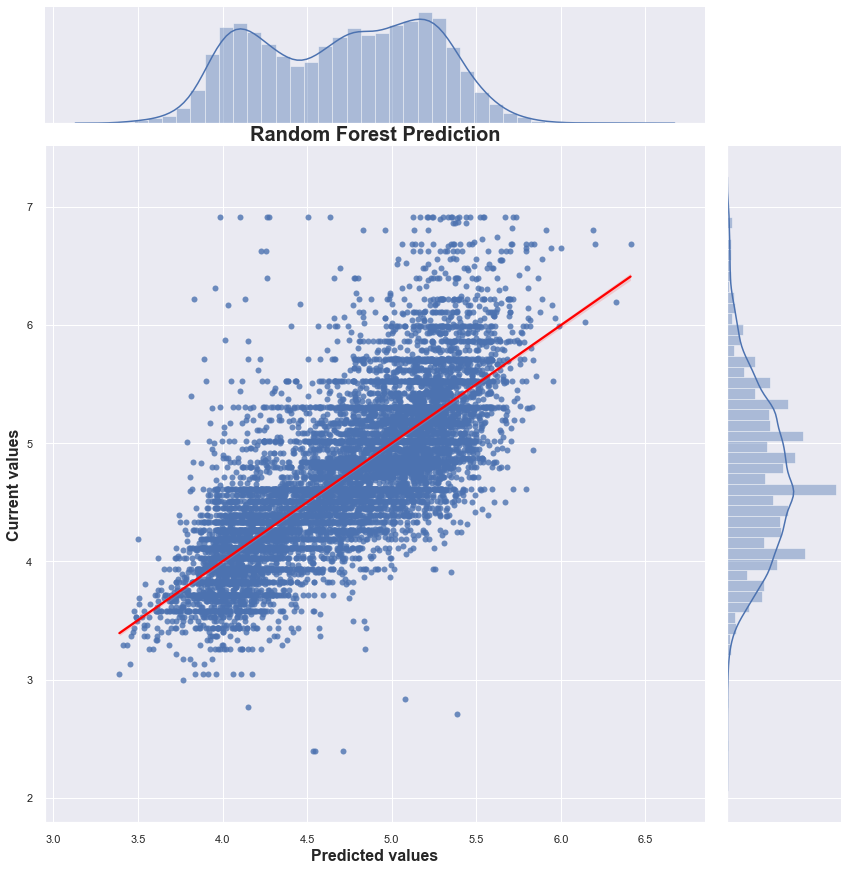

In [201]:
# Visualization predictions vs test log_price
sns.jointplot(y_pred_rf,y_test_fi,kind='reg',height=12,joint_kws={'line_kws':{'color':'red'}})
plt.xlabel('Predicted values',fontsize=16,weight='bold')
plt.ylabel('Current values', fontsize=16,weight='bold')
plt.title('Random Forest Prediction',fontsize=20, weight='bold')
plt.show()

In [202]:
y_train_rf = rf_model_best.predict(X_train_fi)
y_pred_rf = rf_model_best.predict(X_test_fi)
rf_best_results = pd.DataFrame({'model':['Random Forest Regression'],
                                'MAE': [mean_absolute_error(y_test_fi, y_pred_rf)],
                                'RMSE': [np.sqrt(mean_squared_error(y_test_fi, y_pred_rf))],
                                'Training R2 Score': [r2_score(y_train_fi, y_train_rf)],
                                'Training Error': [mean_squared_error(y_train_fi, y_train_rf)],
                                'Test R2 Score': [r2_score(y_test_fi, y_pred_rf)],                             
                                'Test Error': [mean_squared_error(y_test_fi, y_pred_rf)]})
pd.options.display.float_format = '{:.2%}'.format
rf_best_results

,model,MAE,RMSE,Training R2 Score,Training Error,Test R2 Score,Test Error
0,Random Forest Regression,31.64%,42.61%,71.66%,12.65%,58.68%,18.15%


## Model 7. Gradient Boosting Regression

In [203]:
# Default parameters
gb_model=GradientBoostingRegressor(random_state=10)
gb_model.fit(X_train_sc, y_train)
print('Score = {:.2%}'.format(gb_model.score(X_test_sc,y_test)))

Score = 57.67%


In [204]:
y_train_gb = gb_model.predict(X_train_sc)
y_pred_gb = gb_model.predict(X_test_sc)
training_error = mean_squared_error(y_train, y_train_gb)
mse = mean_squared_error(y_test, y_pred_gb)
print(f'Training MSE   = {training_error:4.2%}')
print(f'Testing MSE    = {mse:4.2%}')

Training MSE   = 19.04%
Testing MSE    = 18.53%


### Hyperparameter Tuning

In [205]:
# n_estimators
para_test1={'n_estimators':range(500,901,50)}
gb_model1=GridSearchCV(GradientBoostingRegressor(random_state=10),param_grid=para_test1,cv=5,n_jobs=-1)
gb_model1.fit(X_train_sc, y_train)
gb_model1.best_params_, gb_model1.best_score_

({'n_estimators': 850}, 0.5730370841501957)

In [206]:
# max_depth
para_test2={'max_depth':range(3,14,2)}
gb_model2=GridSearchCV(GradientBoostingRegressor(random_state=10,n_estimators=850),param_grid=para_test2,cv=5,n_jobs=-1)
gb_model2.fit(X_train_sc, y_train)
gb_model2.best_params_, gb_model2.best_score_

({'max_depth': 3}, 0.5730370841501957)

In [207]:
# min_samples_split
para_test3={'min_samples_split':range(50,151,10)}
gb_model3=GridSearchCV(GradientBoostingRegressor(random_state=10,n_estimators=850,max_depth=3),param_grid=para_test3,cv=5,n_jobs=-1)
gb_model3.fit(X_train_sc, y_train)
gb_model3.best_params_, gb_model3.best_score_

({'min_samples_split': 100}, 0.5735017474308869)

In [208]:
# min_samples_leaf
para_test4={'min_samples_leaf':range(10,101,10)}
gb_model4=GridSearchCV(GradientBoostingRegressor(random_state=10,n_estimators=850,
                                                 max_depth=3,min_samples_split = 100),
                                                 param_grid=para_test4,cv=5,n_jobs=-1)
gb_model4.fit(X_train_sc, y_train)
gb_model4.best_params_, gb_model4.best_score_

({'min_samples_leaf': 40}, 0.575096836952336)

In [209]:
# learning_rate
para_test5={'learning_rate':[0.01,0.03,0.05,0.07,0.09]}
gb_model5=GridSearchCV(GradientBoostingRegressor(random_state=10,n_estimators=850,
                                                 max_depth=3,min_samples_split = 100,min_samples_leaf = 40),
                                                 param_grid=para_test5,cv=5,n_jobs=-1)
gb_model5.fit(X_train_sc, y_train)
gb_model5.best_params_, gb_model5.best_score_

({'learning_rate': 0.09}, 0.574726619340613)

In [210]:
# Best GradientBoostingRegressor
best_gb=GradientBoostingRegressor(random_state=10,n_estimators=850,max_depth=3,
                                  min_samples_split=100,min_samples_leaf=50,learning_rate=0.09)
best_gb.fit(X_train_sc,y_train)
y_pred_gb = best_gb.predict(X_test_sc)
print('Score = {:.2%}'.format(best_gb.score(X_test_sc,y_test)))

Score = 58.94%


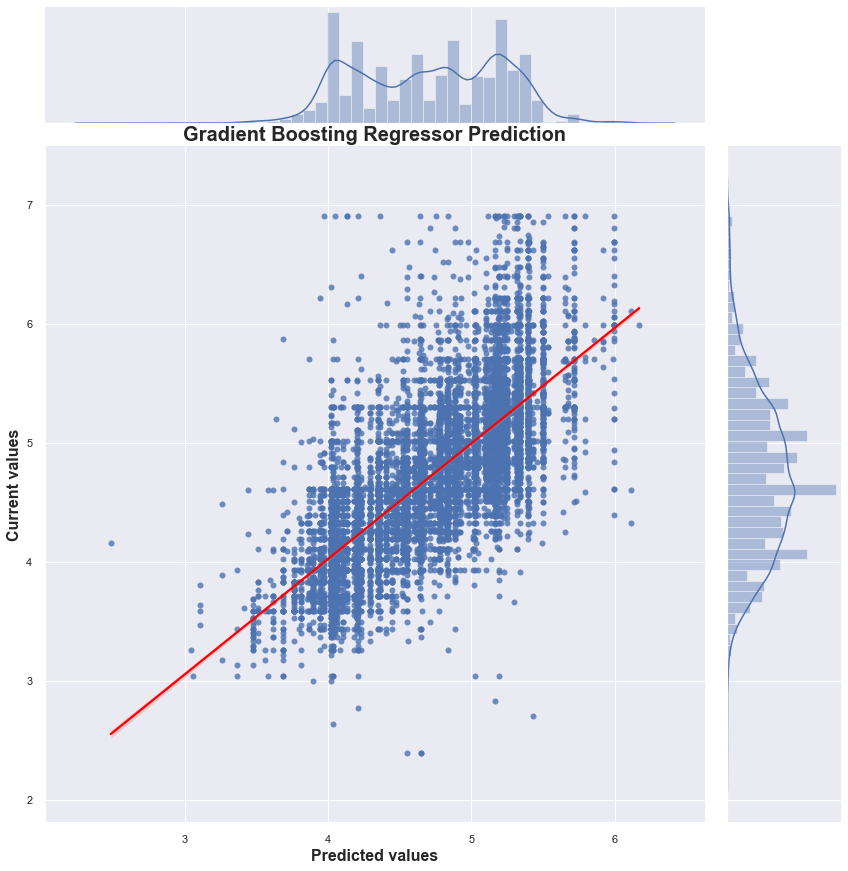

In [211]:
# Visualization predictions vs test log_price
sns.jointplot(y_pred_dtree,y_test,kind='reg',height=12,joint_kws={'line_kws':{'color':'red'}})
plt.xlabel('Predicted values',fontsize=16,weight='bold')
plt.ylabel('Current values', fontsize=16,weight='bold')
plt.title('Gradient Boosting Regressor Prediction',fontsize=20, weight='bold')
plt.show()

In [212]:
y_train_gb = best_gb.predict(X_train_sc)
y_pred_gb = best_gb.predict(X_test_sc)
gb_best_results = pd.DataFrame({'model':['Gradient Booster Regression'],
                                 'MAE': [mean_absolute_error(y_test, y_pred_gb)],
                                 'RMSE': [np.sqrt(mean_squared_error(y_test, y_pred_gb))],
                                 'Training R2 Score': [r2_score(y_train, y_train_gb)],
                                 'Training Error': [mean_squared_error(y_train, y_train_gb)],
                                 'Test R2 Score': [r2_score(y_test, y_pred_gb)],                             
                                 'Test Error': [mean_squared_error(y_test, y_pred_gb)]})
pd.options.display.float_format = '{:.2%}'.format
gb_best_results

,model,MAE,RMSE,Training R2 Score,Training Error,Test R2 Score,Test Error
0,Gradient Booster Regression,31.70%,42.39%,61.25%,17.33%,58.94%,17.97%


After tuning the hyperparameters, the prediction score has improved to 70.48%, the best score so far. It seems boosting method has better performance in predicting complex non-linear relationships. But notice the difference between testing error and training error has increased, the model could have an underlying over-fitting problem.

## Model 8. XGBoost Regression

In [213]:
xgb_model = XGBRegressor(random_state=10)
xgb_model.fit(X_train_sc, y_train)
y_pred = xgb_model.predict(X_test_sc)
print('Score = {:.2%}'.format(xgb_model.score(X_test_sc,y_test)))

Score = 58.92%


In [214]:
y_train_xgb=xgb_model.predict(X_train_sc)
y_pred_xgb=xgb_model.predict(X_test_sc)
training_error = mean_squared_error(y_train, y_train_xgb)
mse = mean_squared_error(y_test, y_pred_xgb)
print(f'Training MSE   = {training_error:4.2%}')
print(f'Testing MSE    = {mse:4.2%}')

Training MSE   = 14.36%
Testing MSE    = 17.98%


### Hyperparameters Tuning

In [215]:
# n_estimators
para_test1={'n_estimators': [50, 100, 150, 200, 250, 300]}
xgb_model1=GridSearchCV(XGBRegressor(random_state=10),param_grid=para_test1,scoring='r2',cv=5,n_jobs=-1)
xgb_model1.fit(X_train_sc, y_train)
xgb_model1.best_params_, xgb_model1.best_score_

({'n_estimators': 50}, 0.5726971293956975)

In [216]:
# max_depth
para_test2={'max_depth': [5, 6, 7, 8, 9]}
xgb_model2=GridSearchCV(XGBRegressor(random_state=10, n_estimators=50),param_grid=para_test2,scoring='r2',cv=5,n_jobs=-1)
xgb_model2.fit(X_train_sc, y_train)
xgb_model2.best_params_, xgb_model2.best_score_

({'max_depth': 6}, 0.5726971293956975)

In [217]:
# min_child_weight
para_test3={'min_child_weight': [10, 20, 30, 40, 50]}
xgb_model3=GridSearchCV(XGBRegressor(random_state=10, n_estimators=50, max_depth=6),
                        param_grid=para_test3,scoring='r2',cv=5,n_jobs=-1)
xgb_model3.fit(X_train_sc, y_train)
xgb_model3.best_params_, xgb_model3.best_score_

({'min_child_weight': 40}, 0.5738643701161796)

In [218]:
# gamma
para_test4={'gamma': [0.01, 0.05, 0.1, 0.2]}
xgb_model4=GridSearchCV(XGBRegressor(random_state=10, n_estimators=50, max_depth=7, min_child_weight=40),
                        param_grid=para_test4,scoring='r2',cv=5,n_jobs=-1)
xgb_model4.fit(X_train_sc, y_train)
xgb_model4.best_params_, xgb_model4.best_score_

({'gamma': 0.1}, 0.5739457874967633)

In [219]:
# subsample
para_test5={'subsample': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0]}
xgb_model5=GridSearchCV(XGBRegressor(random_state=10, n_estimators=50, max_depth=7, min_child_weight=40, gamma=0.1),
                        param_grid=para_test5,scoring='r2',cv=5,n_jobs=-1)
xgb_model5.fit(X_train_sc, y_train)
xgb_model5.best_params_, xgb_model5.best_score_

({'subsample': 1.0}, 0.5739457874967633)

In [220]:
# colsample bytree
para_test6={'colsample_bytree': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0]}
xgb_model6=GridSearchCV(XGBRegressor(random_state=10, n_estimators=50, max_depth=7, min_child_weight=40, gamma=0.01,
                        subsample=1.0), param_grid=para_test6,scoring='r2',cv=5,n_jobs=-1)
xgb_model6.fit(X_train_sc, y_train)
xgb_model6.best_params_, xgb_model6.best_score_

({'colsample_bytree': 0.7}, 0.5746814677271302)

In [221]:
# reg_alpha
para_test7={'reg_alpha': [1, 2, 3, 4, 5, 6, 7, 8, 9]}
xgb_model7=GridSearchCV(XGBRegressor(random_state=10, n_estimators=50, max_depth=7, min_child_weight=40, gamma=0.01,
                        subsample=1.0, colsample_bytree=0.7), param_grid=para_test7,scoring='r2',cv=5,n_jobs=-1)
xgb_model7.fit(X_train_sc, y_train)
xgb_model7.best_params_, xgb_model7.best_score_

({'reg_alpha': 4}, 0.576058196587339)

In [222]:
# reg_lambda
para_test8={'reg_lambda': [0, 0.01, 0.02, 0.03, 0.04, 0.05]}
xgb_model8=GridSearchCV(XGBRegressor(random_state=10, n_estimators=50, max_depth=7, min_child_weight=40, gamma=0.01,
                        subsample=1.0, colsample_bytree=1.0, reg_alpha=4), param_grid=para_test8,scoring='r2',cv=5,n_jobs=-1)
xgb_model8.fit(X_train_sc, y_train)
xgb_model8.best_params_, xgb_model8.best_score_

({'reg_lambda': 0}, 0.5755166167717912)

In [223]:
# learning_rate
para_test9={'learning_rate':[0.01,0.03,0.05,0.07,0.09]}
xgb_model9=GridSearchCV(XGBRegressor(random_state=10, n_estimators=50, max_depth=7, min_child_weight=40, gamma=0.01,
                        subsample=1.0, colsample_bytree=1.0, reg_alpha=4, reg_lambda=0.02), 
                        param_grid=para_test9,scoring='r2',cv=5,n_jobs=-1)
xgb_model9.fit(X_train_sc, y_train)
xgb_model9.best_params_, xgb_model9.best_score_

({'learning_rate': 0.09}, 0.5662066188252982)

In [224]:
# Best XGBoost Gradient Regressor
best_xgb=XGBRegressor(random_state=10, n_estimators=50, max_depth=7, min_child_weight=40, gamma=0.01,
                      subsample=1.0, colsample_bytree=1.0, reg_alpha=4, reg_lambda=0.02, learning_rate=0.09) 
best_xgb.fit(X_train_sc,y_train)
y_pred_xgb = best_xgb.predict(X_test_sc)
print('Score = {:.2%}'.format(best_xgb.score(X_test_sc,y_test)))

Score = 58.25%


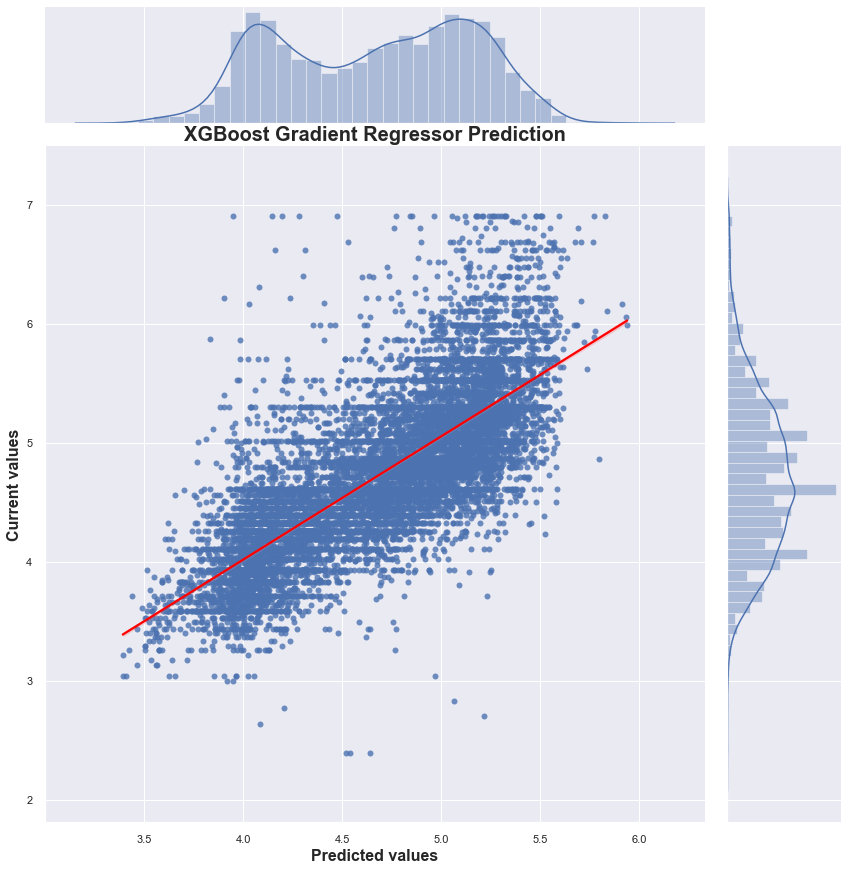

In [225]:
# Visualization predictions vs test log_price
sns.jointplot(y_pred_xgb,y_test,kind='reg',height=12,joint_kws={'line_kws':{'color':'red'}})
plt.xlabel('Predicted values',fontsize=16,weight='bold')
plt.ylabel('Current values', fontsize=16,weight='bold')
plt.title('XGBoost Gradient Regressor Prediction',fontsize=20, weight='bold')
plt.show()

In [226]:
y_train_xgb = best_xgb.predict(X_train_sc)
y_pred_xgb = best_xgb.predict(X_test_sc)
xgb_best_results = pd.DataFrame({'model':['XGBoost Gradient Regression'],
                                 'MAE': [mean_absolute_error(y_test, y_pred_xgb)],
                                 'RMSE': [np.sqrt(mean_squared_error(y_test, y_pred_xgb))],
                                 'Training R2 Score': [r2_score(y_train, y_train_xgb)],
                                 'Training Error': [mean_squared_error(y_train, y_train_xgb)],
                                 'Test R2 Score': [r2_score(y_test, y_pred_xgb)],                             
                                 'Test Error': [mean_squared_error(y_test, y_pred_xgb)]})
pd.options.display.float_format = '{:.2%}'.format
xgb_best_results

,model,MAE,RMSE,Training R2 Score,Training Error,Test R2 Score,Test Error
0,XGBoost Gradient Regression,31.58%,42.75%,59.04%,18.32%,58.25%,18.28%


## Model 9. Light GBM Regression

In [227]:
lgbm_model = LGBMRegressor()
lgbm_model.fit(X_train_sc, y_train)
y_pred = lgbm_model.predict(X_test_sc)
print('Score = {:.2%}'.format(lgbm_model.score(X_test_sc,y_test)))

Score = 59.32%


In [228]:
y_train_lgbm=lgbm_model.predict(X_train_sc)
y_pred_lgbm=lgbm_model.predict(X_test_sc)
training_error = mean_squared_error(y_train, y_train_lgbm)
mse = mean_squared_error(y_test, y_pred_lgbm)
print(f'Training MSE   = {training_error:4.2%}')
print(f'Testing MSE    = {mse:4.2%}')

Training MSE   = 17.00%
Testing MSE    = 17.80%


### Hyperparameters Tuning

In [229]:
# n_estimators
para_test1={'n_estimators':range(50,551,100)}
lgbm1=GridSearchCV(LGBMRegressor(random_state=10),param_grid=para_test1, cv=5,n_jobs=-1)
lgbm1.fit(X_train_sc, y_train)
lgbm1.best_params_, lgbm1.best_score_

({'n_estimators': 250}, 0.5791613062953436)

In [230]:
# max_depth
para_test2={'max_depth':range(4,16,2)}
lgbm2=GridSearchCV(LGBMRegressor(random_state=10,n_estimators=250),param_grid=para_test2, cv=5,n_jobs=-1)
lgbm2.fit(X_train_sc, y_train)
lgbm2.best_params_, lgbm2.best_score_

({'max_depth': 8}, 0.5799592738995891)

In [231]:
# num_leaves
para_test3={'num_leaves':range(10,51,5)}
lgbm3=GridSearchCV(LGBMRegressor(random_state=12,n_estimators=250,max_depth=8),
                                 param_grid=para_test3, cv=5,n_jobs=-1)
lgbm3.fit(X_train_sc, y_train)
lgbm3.best_params_, lgbm3.best_score_

({'num_leaves': 50}, 0.5799630358083064)

In [232]:
# learning_rate
para_test4={'learning_rate':[0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.10]}
lgbm4=GridSearchCV(LGBMRegressor(random_state=10,n_estimators=250,max_depth=8,num_leaves=50),
                                 param_grid=para_test4, cv=5,n_jobs=-1)
lgbm4.fit(X_train_sc, y_train)
lgbm4.best_params_, lgbm4.best_score_

({'learning_rate': 0.07}, 0.5805518212644435)

In [233]:
# Best Light GBMRegressor
best_lgbm=LGBMRegressor(random_state=10,n_estimators=150,max_depth=10,num_leaves=40,
                        learning_rate=0.08)
best_lgbm.fit(X_train_sc,y_train)
y_pred_lgbm = best_lgbm.predict(X_test_sc)
print('Score = {:.2%}'.format(best_lgbm.score(X_test_sc,y_test)))

Score = 59.61%


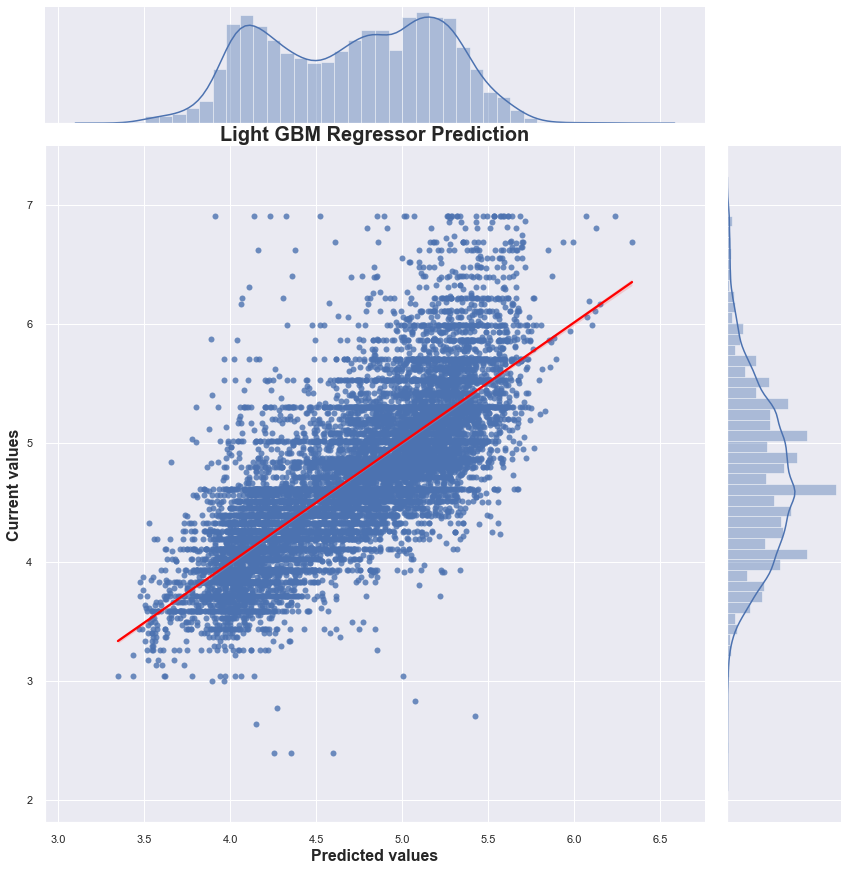

In [234]:
# Visualization predictions vs test log_price
sns.jointplot(y_pred_lgbm,y_test,kind='reg',height=12,joint_kws={'line_kws':{'color':'red'}})
plt.xlabel('Predicted values',fontsize=16,weight='bold')
plt.ylabel('Current values', fontsize=16,weight='bold')
plt.title('Light GBM Regressor Prediction',fontsize=20, weight='bold')
plt.show()

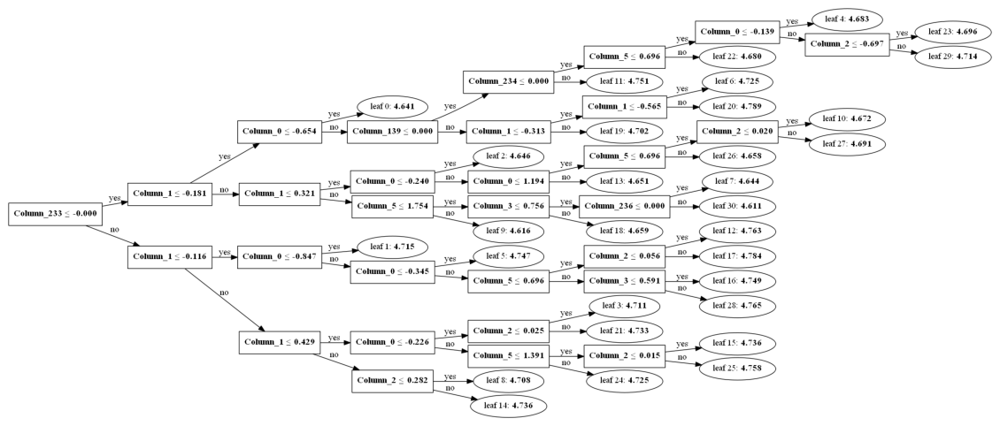

In [235]:
lgb.plot_tree(lgbm_model, figsize=(20, 20))

In [236]:
y_train_lgbm = best_lgbm.predict(X_train_sc)
y_pred_lgbm = best_lgbm.predict(X_test_sc)
lgbm_best_results = pd.DataFrame({'model':['Light GBM Regression'],
                                  'MAE': [mean_absolute_error(y_test, y_pred_lgbm)],
                                  'RMSE': [np.sqrt(mean_squared_error(y_test, y_pred_lgbm))],
                                  'Training R2 Score': [r2_score(y_train, y_train_lgbm)],
                                  'Training Error': [mean_squared_error(y_train, y_train_lgbm)],
                                  'Test R2 Score': [r2_score(y_test, y_pred_lgbm)],                             
                                  'Test Error': [mean_squared_error(y_test, y_pred_lgbm)]})
pd.options.display.float_format = '{:.2%}'.format
lgbm_best_results

,model,MAE,RMSE,Training R2 Score,Training Error,Test R2 Score,Test Error
0,Light GBM Regression,31.41%,42.05%,63.77%,16.21%,59.61%,17.68%


## Model 10. Artificial Neural Network (ANN by using Keras)

In [237]:
# Import `Sequential` from `keras.models`
import keras
from keras.models import Sequential

# Import `Dense` from `keras.layers`
from keras.layers import Dense

Using TensorFlow backend.


The optimizer and the loss are two arguments that are required if you want to compile the model.<br><br>
Some of the most popular optimization algorithms used are the Stochastic Gradient Descent (SGD), ADAM and RMSprop<br><br>
The choice for a loss function depends on the task that you have at hand:   <br>
- for example, In a regression problem, you’ll usually use the Mean Squared Error (MSE).  <br> 
- wil be using binary_crossentropy for the binary classification problem     <br>
- Lastly, with multi-class classification, you’ll make use of categorical_crossentropy.  <br><br>

In [238]:
X_train_sc.shape

(34469, 237)

In [239]:
# Import `Sequential` from `keras.models`
import keras
from keras.models import Sequential
# Import `Dense` from `keras.layers`
from keras.layers import Dense
# Initialize the constructor
ann_model = Sequential()
# Add one input layer and first hidden layer
ann_model.add(Dense(128, activation='sigmoid', kernel_initializer='normal',input_dim=237))

# Add second hidden layer 
ann_model.add(Dense(64, activation='sigmoid',kernel_initializer='normal'))

# Add an output layer 
ann_model.add(Dense(1, activation="linear"))

ann_model.compile(loss='mean_squared_error',optimizer='adadelta',metrics=['mse'])

ann_result=ann_model.fit(X_train_sc, y_train, epochs=50, batch_size=20, verbose=1, validation_split=0.25)

Train on 25851 samples, validate on 8618 samples
Epoch 1/50
25851/25851 [==============================] - 3s 123us/step - loss: 0.4938 - mse: 0.4938 - val_loss: 0.2267 - val_mse: 0.2267
Epoch 2/50
25851/25851 [==============================] - 3s 120us/step - loss: 0.2186 - mse: 0.2186 - val_loss: 0.2240 - val_mse: 0.2240
Epoch 3/50
25851/25851 [==============================] - 3s 115us/step - loss: 0.2140 - mse: 0.2140 - val_loss: 0.2144 - val_mse: 0.2144
Epoch 4/50
25851/25851 [==============================] - 3s 116us/step - loss: 0.2119 - mse: 0.2119 - val_loss: 0.2142 - val_mse: 0.2142
Epoch 5/50
25851/25851 [==============================] - 3s 118us/step - loss: 0.2106 - mse: 0.2106 - val_loss: 0.2362 - val_mse: 0.2362
Epoch 6/50
25851/25851 [==============================] - 3s 114us/step - loss: 0.2097 - mse: 0.2097 - val_loss: 0.2200 - val_mse: 0.2200
Epoch 7/50
25851/25851 [==============================] - 3s 115us/step - loss: 0.2088 - mse: 0.2088 - val_loss: 0.2322 - v

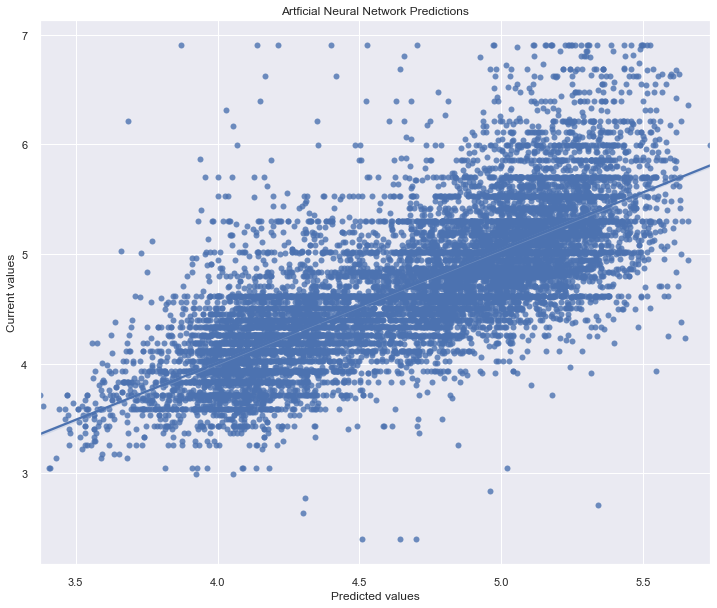

In [242]:
plt.figure(figsize=(12,10))
sns.regplot(y_pred_ann,y_test)
plt.xlabel('Predicted values')
plt.ylabel('Current values')
plt.title("Artficial Neural Network Predictions")
plt.show()

In [241]:
y_train_ann = ann_model.predict(X_train_sc)
y_pred_ann = ann_model.predict(X_test_sc)
ann_results = pd.DataFrame({'model':['Artificial Neural Network'],
                            'MAE': [mean_absolute_error(y_test, y_pred_ann)],
                            'RMSE': [np.sqrt(mean_squared_error(y_test, y_pred_ann))],
                            'Training R2 Score': [r2_score(y_train, y_train_ann)],
                            'Training Error': [mean_squared_error(y_train, y_train_ann)],
                            'Test R2 Score': [r2_score(y_test, y_pred_ann)],                             
                            'Test Error': [mean_squared_error(y_test, y_pred_ann)]})
pd.options.display.float_format = '{:.2%}'.format
ann_results

,model,MAE,RMSE,Training R2 Score,Training Error,Test R2 Score,Test Error
0,Artificial Neural Network,32.36%,43.65%,55.84%,19.75%,56.48%,19.05%


## Model 11. Unsupervised Model: K-Means Clustering

Now, we will try to find the optimal number of clusters to classify the dataset (to make a structure out of it) by using K Means algorithm.

In [142]:
df_listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49530 entries, 0 to 49529
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              49530 non-null  int64  
 1   name                            49512 non-null  object 
 2   host_id                         49530 non-null  int64  
 3   host_name                       49524 non-null  object 
 4   neighbourhood_group             49530 non-null  object 
 5   neighbourhood                   49530 non-null  object 
 6   latitude                        49530 non-null  float64
 7   longitude                       49530 non-null  float64
 8   room_type                       49530 non-null  object 
 9   price                           49530 non-null  int64  
 10  minimum_nights                  49530 non-null  int64  
 11  number_of_reviews               49530 non-null  int64  
 12  last_review                     

In [143]:
kdf=df_listings.drop(['id','name','host_id','host_name','number_of_reviews','last_review','last_review'],axis=1)

In [144]:
le=LabelEncoder()

In [145]:
kdf['neighbourhood_group']= le.fit_transform(kdf['neighbourhood_group'])
kdf['neighbourhood']= le.fit_transform(kdf['neighbourhood'])
kdf['room_type']= le.fit_transform(kdf['room_type'])

In [146]:
kdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49530 entries, 0 to 49529
Data columns (total 10 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   neighbourhood_group             49530 non-null  int32  
 1   neighbourhood                   49530 non-null  int32  
 2   latitude                        49530 non-null  float64
 3   longitude                       49530 non-null  float64
 4   room_type                       49530 non-null  int32  
 5   price                           49530 non-null  int64  
 6   minimum_nights                  49530 non-null  int64  
 7   reviews_per_month               49530 non-null  float64
 8   calculated_host_listings_count  49530 non-null  int64  
 9   availability_365                49530 non-null  int64  
dtypes: float64(3), int32(3), int64(4)
memory usage: 3.2 MB


Let's find the sutiable number of clusters by using K-means algorithm.

In [147]:
from sklearn.cluster import KMeans 
wcss=[]   #within cluster sum of squares
for k in range(1,11):
    kmc=KMeans(n_clusters=k,random_state=10)
    kmc.fit(kdf)
    wcss.append(kmc.inertia_)

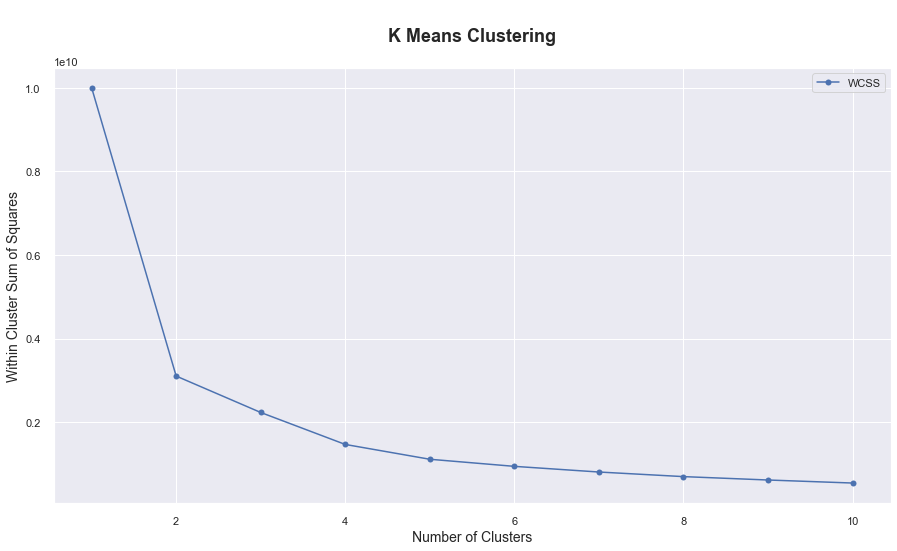

In [148]:
plt.figure(figsize=(15,8))
plt.plot(range(1,11),wcss, label='WCSS',marker='o')
plt.title('\nK Means Clustering\n',fontsize=18,weight='bold')
plt.legend(loc='top right')
plt.xlabel('Number of Clusters',fontsize=14)
plt.ylabel('Within Cluster Sum of Squares',fontsize=14)
plt.annotate("Optimal cluster",fontsize=16,xy=(5,1),xytext=(6.5, 1.5), arrowprops=dict(arrowstyle="-|>",connectionstyle="arc3",facecolor="red",edgecolor="red",linestyle='--',linewidth=2))
plt.show()

Training with the optimal cluster.

In [149]:
kmc=KMeans(n_clusters=5,random_state=10)
kmc.fit(kdf)
y_kmeans=kmc.fit_predict(kdf)

In [150]:
y_kmeans

array([2, 2, 2, ..., 0, 0, 2])

In [151]:
tot=pd.concat([kdf,pd.DataFrame(y_kmeans,columns=['y_kmeans'])],axis=1)

In [152]:
tot.head()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,reviews_per_month,calculated_host_listings_count,availability_365,y_kmeans
0,2,207,40.85722,-73.93790,2,100,1,0.01,1,365,2
1,2,128,40.75362,-73.98377,0,225,3,0.37,2,335,2
2,1,41,40.68514,-73.95976,0,89,1,4.64,1,276,2
3,2,138,40.74767,-73.97500,0,200,3,0.58,1,0,0
4,1,13,40.68688,-73.95596,2,60,29,0.37,1,365,2


In [153]:
tot['y_kmeans'].value_counts()

0    30717
2    16891
4     1717
3      127
1       78
Name: y_kmeans, dtype: int64

Let's visualize how the clusters has been created based on each features.

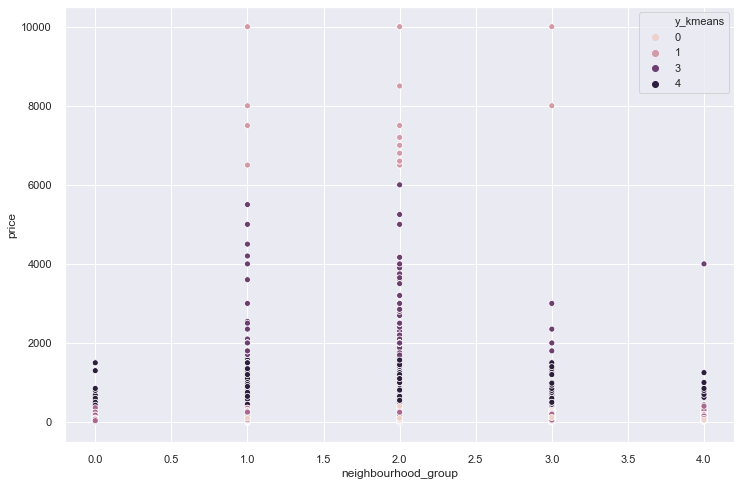

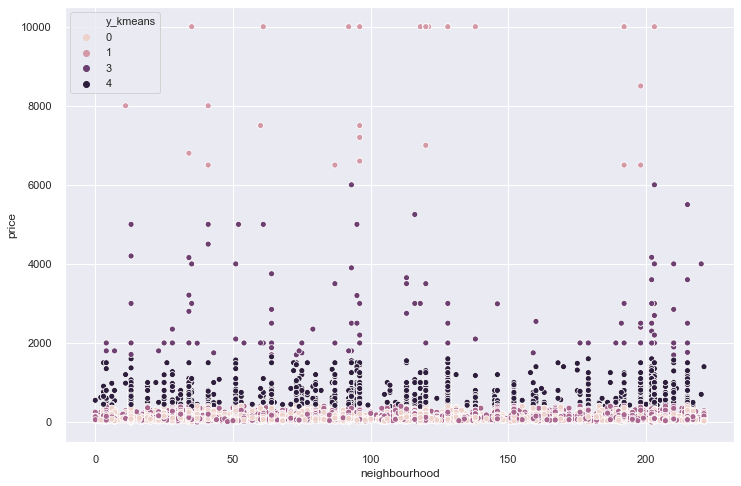

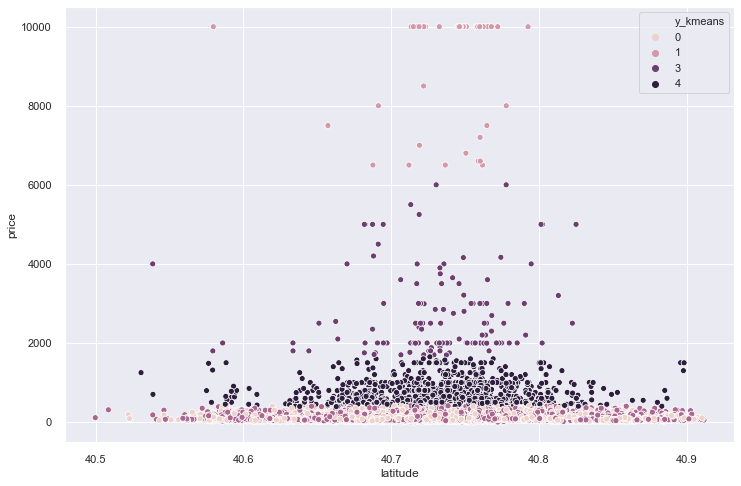

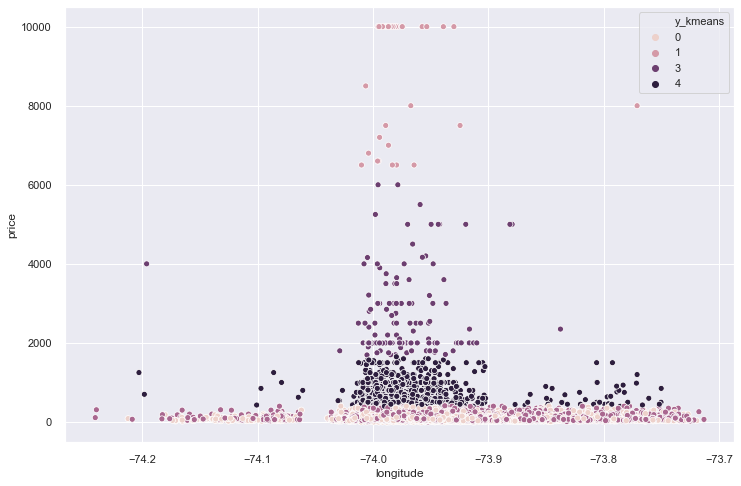

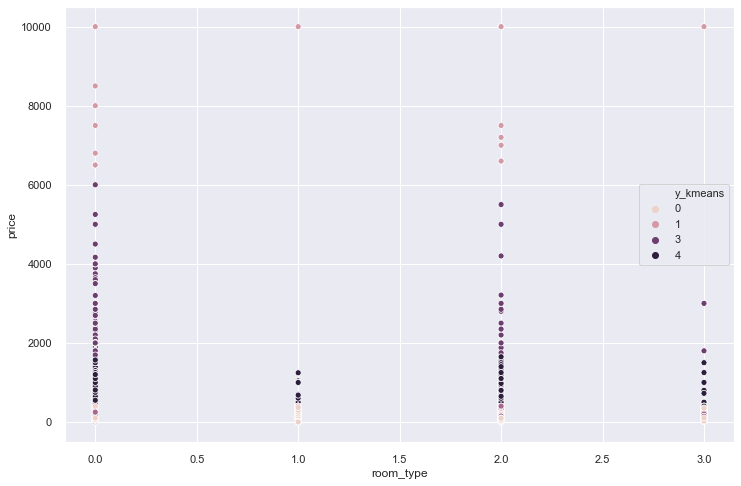

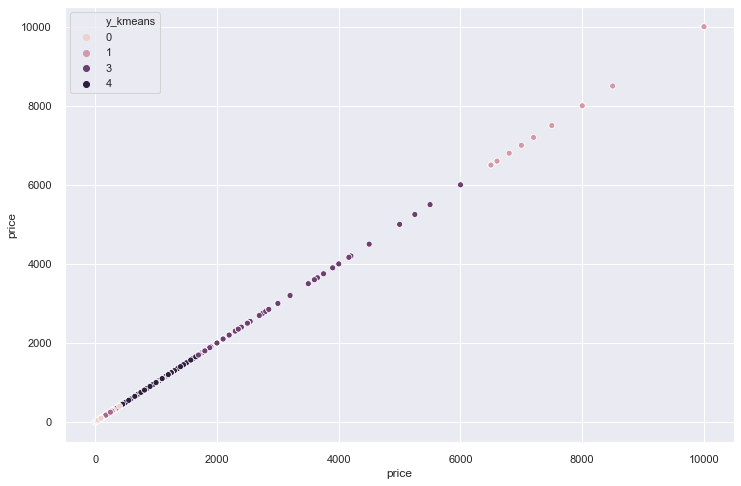

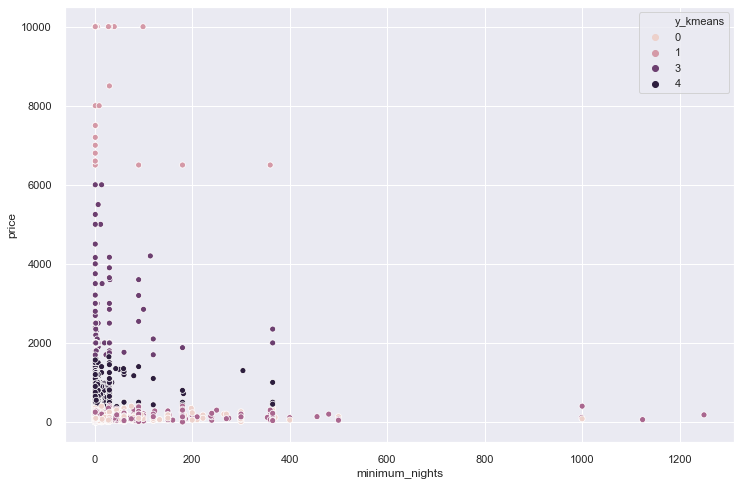

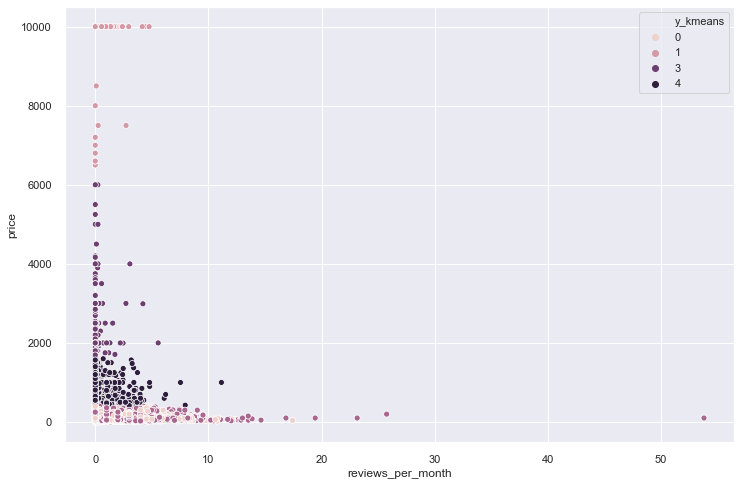

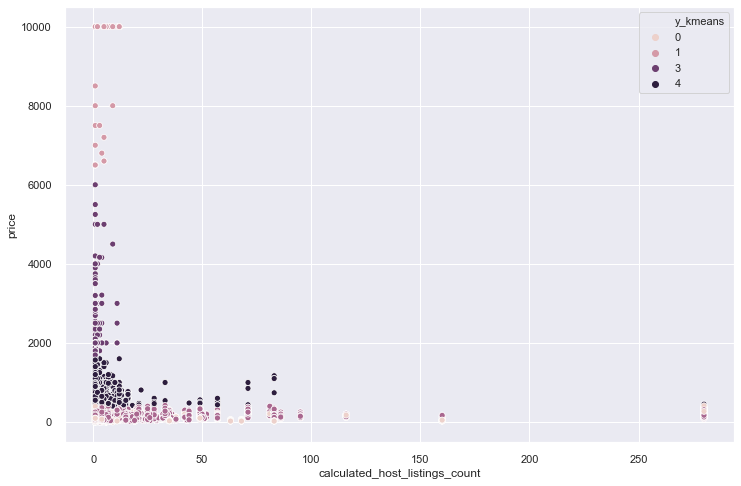

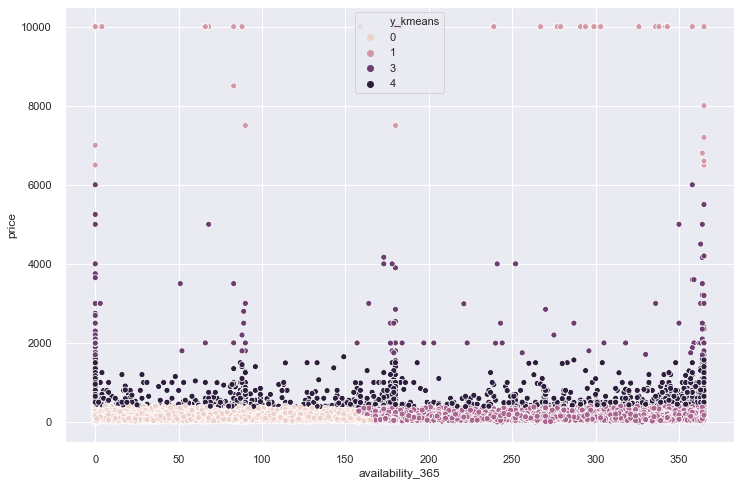

In [154]:
for col in kdf.columns:
    sns.scatterplot(tot[col],tot['price'],hue=tot['y_kmeans'])
    plt.show()

From the above we can see that we can see some clear boundaries for the clusters only for the `availability_365` and `price`.

In [155]:
tot['y_kmeans'].value_counts()

0    30717
2    16891
4     1717
3      127
1       78
Name: y_kmeans, dtype: int64

In [156]:
tot['y_kmeans']= tot['y_kmeans']+1  #changing from '0 to 4' to '1 to 5'

In [157]:
tot['y_kmeans'].value_counts()

1    30717
3    16891
5     1717
4      127
2       78
Name: y_kmeans, dtype: int64

In [158]:
tot['y_kmeans']= tot['y_kmeans'].astype('object')

In [159]:
tot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49530 entries, 0 to 49529
Data columns (total 11 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   neighbourhood_group             49530 non-null  int32  
 1   neighbourhood                   49530 non-null  int32  
 2   latitude                        49530 non-null  float64
 3   longitude                       49530 non-null  float64
 4   room_type                       49530 non-null  int32  
 5   price                           49530 non-null  int64  
 6   minimum_nights                  49530 non-null  int64  
 7   reviews_per_month               49530 non-null  float64
 8   calculated_host_listings_count  49530 non-null  int64  
 9   availability_365                49530 non-null  int64  
 10  y_kmeans                        49530 non-null  object 
dtypes: float64(3), int32(3), int64(4), object(1)
memory usage: 3.6+ MB


In [160]:
tot['y_kmeans'].value_counts()

1    30717
3    16891
5     1717
4      127
2       78
Name: y_kmeans, dtype: int64

<Figure size 1080x576 with 0 Axes>

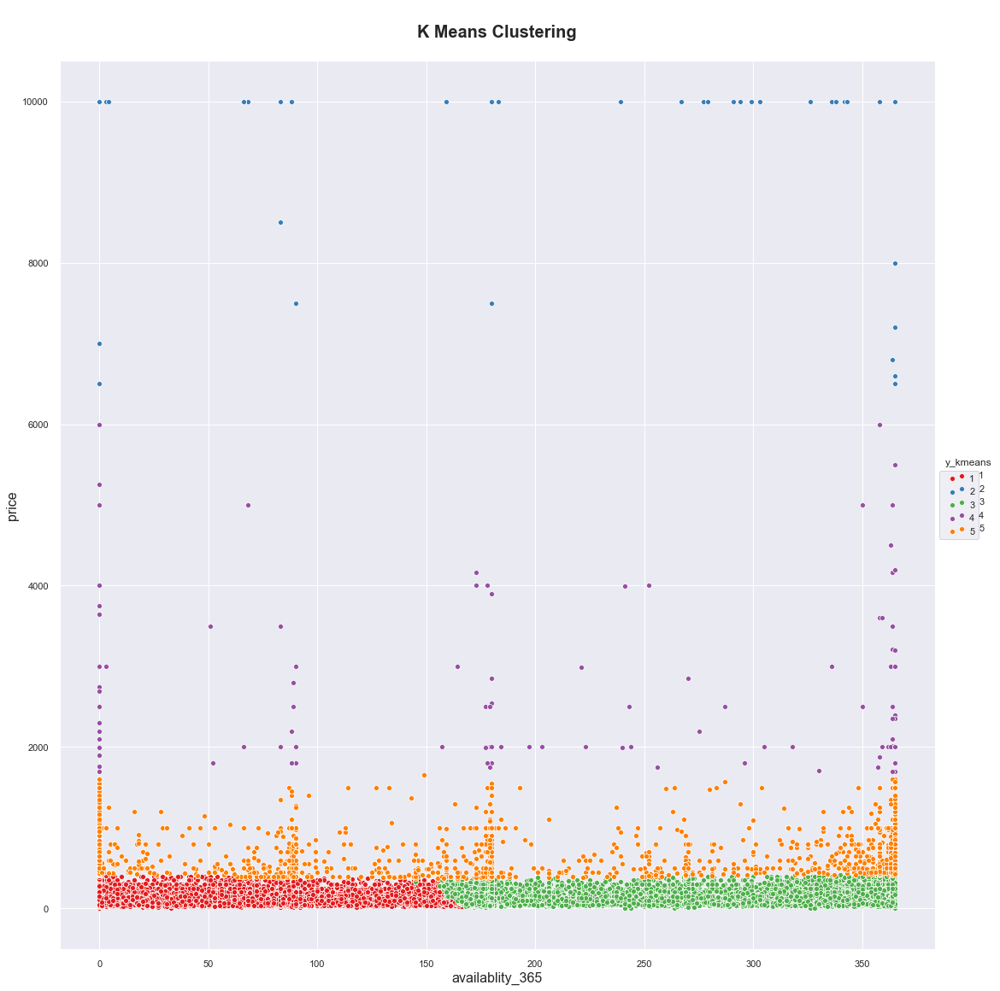

In [160]:
plt.figure(figsize=(15,8))
sns.pairplot(x_vars='availability_365',y_vars='price',hue='y_kmeans',data=tot,palette='Set1',size=15)
plt.title('\nK Means Clustering\n',fontsize=20,weight='bold')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.xlabel('availablity_365',fontsize=16)
plt.ylabel('price',fontsize=16)
plt.show()

Examining the plot we can see that the :<br><br>

• Cluster 1 (RED) includes 30717 Airbnb listings having availability less than 160 days and price ranges from 0 to 400 dollars.<br>

• Cluster 2 (BLUE) includes 78 Airbnb listings having all the availability and price ranges from 6000 to 10000 dollars.<br>
    
• Cluster 3 (GREEN) includes 16891 Airbnb listings having availability more than 160 days and price ranges from 0 to 400 dollars.<br> 
    
• Cluster 4 (PURPLE) includes 127 Airbnb listings having all the availability  and price ranges from 1600 to 5000 dollars.<br>
    
• Cluster 5 (ORANGE) includes 1717 Airbnb listings having all the availability and price ranges from 400 to 1600 dollars.<br> 

In [161]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
display(tot.groupby(['y_kmeans']).describe().transpose())

y_kmeans                                         1             2  \
neighbourhood_group            count  30717.000000     78.000000   
                               mean       1.646938      1.961538   
                               std        0.718345      0.299016   
                               min        0.000000      1.000000   
                               25%        1.000000      2.000000   
                               50%        2.000000      2.000000   
                               75%        2.000000      2.000000   
                               max        4.000000      3.000000   
neighbourhood                  count  30717.000000     78.000000   
                               mean     108.648631    125.038462   
                               std       70.236169     41.206620   
                               min        0.000000     11.000000   
                               25%       51.000000    120.000000   
                               50%       95.000000    128.000000   
                               75%      183.000000    128.000000   
                               max      221.000000    203.000000   
latitude                       count  30717.000000     78.000000   
                               mean      40.728844     40.745605   
                               std        0.053713      0.029122   
                               min       40.522110     40.579670   
                               25%       40.690450     40.745083   
                               50%       40.721840     40.750790   
                               75%       40.762650     40.764510   
                               max       40.910310     40.792640   
longitude                      count  30717.000000     78.000000   
                               mean     -73.952863    -73.980420   
                               std        0.042586      0.027483   
                               min      -74.212380    -74.009990   
                               25%      -73.982360    -73.987485   
                               50%      -73.955530    -73.984065   
                               75%      -73.937350    -73.983105   
                               max      -73.719280    -73.771000   
room_type                      count  30717.000000     78.000000   
                               mean       1.010613      1.628205   
                               std        1.025437      0.823502   
                               min        0.000000      0.000000   
                               25%        0.000000      2.000000   
                               50%        0.000000      2.000000   
                               75%        2.000000      2.000000   
                               max        3.000000      3.000000   
price                          count  30717.000000     78.000000   
                               mean     118.923104   9483.294872   
                               std       72.697515   1145.999457   
                               min        0.000000   6500.000000   
                               25%       65.000000  10000.000000   
                               50%      100.000000  10000.000000   
                               75%      150.000000  10000.000000   
                               max      415.000000  10000.000000   
minimum_nights                 count  30717.000000     78.000000   
                               mean       6.088420     12.871795   
                               std       14.967097     47.422763   
                               min        1.000000      1.000000   
                               25%        2.000000      1.000000   
                               50%        3.000000      1.000000   
                               75%        5.000000      1.000000   
                               max     1000.000000    360.000000   
reviews_per_month              count  30717.000000     78.000000   
                               mean       0.622605      

The above table concludes the basic properties of each cluster in the dataset numerically which is same as the Cluster visualization above.

# Chapter 7. Model Selection

## Model Comparison and Conclusion

In [268]:
#combined scores of all model's best results
df_conclusion = pd.concat([dtree_best_results,knn_best_results,rf_best_results,gb_best_results,xgb_best_results,lgbm_best_results,ann_results], axis=0, ignore_index=True)
df_conclusion

,model,MAE,RMSE,Training R2 Score,Training Error,Test R2 Score,Test Error
0,Decision Tree Regression,33.07%,44.42%,57.82%,18.87%,54.92%,19.73%
1,KNN Regression,33.35%,44.50%,57.67%,18.93%,54.75%,19.81%
2,Random Forest Regression,31.64%,42.61%,71.66%,12.65%,58.68%,18.15%
3,Gradient Booster Regression,31.70%,42.39%,61.25%,17.33%,58.94%,17.97%
4,XGBoost Gradient Regression,31.58%,42.75%,59.04%,18.32%,58.25%,18.28%
5,Light GBM Regression,31.41%,42.05%,63.77%,16.21%,59.61%,17.68%
6,Artificial Neural Network,34.33%,44.55%,54.14%,20.51%,54.65%,19.85%


From the result data frame, models adopting ensemble techniques performs better than linear models. Furthermore, ensemble models adopting boosting method have slightly better performance. Light GBM Regression model has the best performance of 59.61% prediction accuracy score. Gradient Boosting Regressor gives a close second score of 58.94%. In addition, there could be less concern of over-fitting in the Boosting Models due to the relatively lower differences between training and testing errors, even though there is no certain indication of over-fitting issue here. Overall, the three ensemble models have very similar performances. The only defect in boosting method is time-consuming due to serial-computing.

## Limitations of our models

Although we get impressive results from the above regression analyzes, there are still limitations of our project. First is that we use the logarithm of the price as the dependent variable in our models. This method makes the distribution of price more like a normal distribution and decrease the possible errors in the computation, but if we use the original price, the error may be enlarged. Second is that it is difficult for us to entirely understand the hyperparameter of each model, and our laptops' function also has limitation, so we can't get the best hyperparameters of models.<br>

Another limitation of our models is that we miss some important features, which render our models able to predict around 60% of the dataset. One feature we think we miss is how the pictures of the Airbnb houses/apartments appeal to customers and how fancy they look. Future studies can take this feature into consideration.